In [ ]:
import pandas as pd

In [ ]:
# names = pd.read_csv("fundamental.csv", delimiter=',')
names = pd.read_csv("fundamental.csv")
names.head(3)

,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,Dividend,Yield
0,Qualcomm Incorporated,QCOM.O,"165,660,000,000","36,040,000,000","11,174,558",8.73,17.51,1.20,2.72,1.78%
1,Tesla Inc,TSLA.O,1.12T,"53,820,000,000","26,651,773",4.92,218.95,2.08,-,-
2,NVIDIA Corporation,NVDA.O,"669,400,000,000","26,910,000,000","52,702,837",3.85,70.96,1.42,0.16,0.06%


In [ ]:
tickers = names['Symbol'].map(lambda x: str(x)[:-2])
tickers.head(3)

0    QCOM
1    TSLA
2    NVDA
Name: Symbol, dtype: object

alphavintage free API only allow 5 retreval of stocks. so each time need to updae the index of Symbols.

In [ ]:
stocks_tickers = names[['Name', 'Symbol']]

In [ ]:
stocks_tickers['Symbol']= stocks_tickers['Symbol'].map(lambda x: str(x)[:-2])

<ipython-input-47-93247d238079>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stocks_tickers['Symbol']= stocks_tickers['Symbol'].map(lambda x: str(x)[:-2])


# other usage

In [ ]:
# open url
from IPython.display import Javascript
def open_web(url):
    # url = 'https://www.google.com/'
    display(Javascript('window.open("{url}");'.format(url=url)))

url1 = 'https://finance.yahoo.com/quote/AAPL/history?p=AAPL'
url2='https://finance.yahoo.com/quote/CSCO/history?p=CSCO'
url3= 'https://finance.yahoo.com/quote/OLED/history?p=OLED'
open_web(url2)

# read comany symbols(step 1)

In [ ]:
import pandas as pd
# names = pd.read_csv("fundamental.csv", delimiter=',')
names = pd.read_csv("fundamental.csv")

In [ ]:
tickers = names['Symbol'].map(lambda x: str(x)[:-2])
tickers.head(3)

0    QCOM
1    TSLA
2    NVDA
Name: Symbol, dtype: object

#alphavintage

##### code for get the stocks data of alphavintage

*   List item
*   List item



In [ ]:
import pandas as pd

def call_alphavintage(indx, append_alphafinance, ticket):
   for index in range(len(ticket)):
     item = ticket[index]
     if index > indx:
        print(item)
        url = 'https://www.alphavantage.co/query?function=TIME_SERIES_DAILY&outputsize=full&symbol='+item+'&apikey=[YOUR OWN API CODE]&datatype=csv'
        webFile = request.urlopen(url).read()
        # webFile = webFile.decode('utf-8')

        c=pd.read_csv(io.StringIO(webFile.decode('utf-8')))
        append_alphafinance[item] = c['close'][:759]  #only workday has transaction so three years, 759 transaction days
   append_alphafinance.insert(loc = 0, column = 'Date', value = c['timestamp'][:759])

generate the table

In [ ]:
import urllib
import io
from urllib import request
# stocks_alphafinance = pd.DataFrame()

In [ ]:
next = 0

In [ ]:
call_alphavintage(next, stocks_alphafinance, tickers)
stocks_alphafinance
next = next + 5  # every time retrive next

##### read from downloaded data

In [ ]:
# stocks_alphafinance.to_csv('/content/stocks_alphafinance.csv')
alpph_data = pd.read_csv('/content/stocks_alphafinance.csv')
alpph_data

In [ ]:
alpph_data.drop(columns=['Unnamed: 0'], inplace=True)
test_alpha1 = alpph_data.reindex(index=alpph_data.index[::-1])
test_alpha1 = test_alpha1.reset_index(drop=True)
test_alpha1.head()

,Date,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
0,2019-04-01,57.81,289.18,182.28,2.70,54.51,14.25,158.36,54.98,119.02,...,49.31,47.12,94.43,41.78,108.28,115.26,8.50,39.66,2.31,83.86
1,2019-04-02,58.09,285.88,183.00,2.97,54.36,15.69,159.80,55.29,119.19,...,50.38,47.46,94.80,42.02,108.11,114.42,8.48,39.80,2.30,84.16
2,2019-04-03,57.68,291.81,188.62,2.99,55.48,15.55,165.31,55.63,119.97,...,52.01,47.65,98.57,43.60,109.84,119.38,8.54,40.37,2.30,85.36
3,2019-04-04,57.86,267.78,188.26,2.91,55.92,15.33,163.44,55.14,119.36,...,51.40,46.96,98.13,43.63,110.54,119.15,8.68,40.25,2.29,85.51
4,2019-04-05,57.99,274.96,190.95,2.88,55.60,15.62,163.95,55.21,119.89,...,52.04,47.29,99.08,44.15,111.46,121.26,8.83,40.40,2.29,86.80


#Yahoo

##### code for download and fetch the yahoo finance data

In [ ]:
!pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 928 kB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0


In [ ]:
import pandas as pd
import yfinance as yf
import datetime
import time
import requests
import io

In [ ]:
start = datetime.datetime(2019,4,1)
end = datetime.datetime(2022,4,2)

In [ ]:
#no use code but list all symbols
# url="https://pkgstore.datahub.io/core/nasdaq-listings/nasdaq-listed_csv/data/7665719fb51081ba0bd834fde71ce822/nasdaq-listed_csv.csv"
# s = requests.get(url).content
# companies = pd.read_csv(io.StringIO(s.decode('utf-8')))
# Symbols = companies['Symbol'].tolist()

In [ ]:
# create empty dataframe
stock_final = pd.DataFrame()

In [ ]:
def yahoo_get(stock_finals, testSym):
  # iterate over each symbol
  for i in testSym:

      # print the symbol which is being downloaded
      print( str(testSym.index(i)) + str(' : ') + i, sep=',', end=',', flush=True)

      try:
          # download the stock price
          stock = []
          stock = yf.download(i,start=start, end=end, progress=False)['Adj Close']

          # append the individual stock prices
          if len(stock) == 0:
              None
          else:
              # stock['Name']=i
              # stock_finals = stock_finals.append(stock,sort=False)
              stock_finals[i] = stock
      except Exception:
          None

In [ ]:
# create empty dataframe
stock_yahoofinance_ = pd.DataFrame()

In [ ]:
yahoo_get(stock_yahoofinance_, tickers.tolist())  #here need tickers.tolist()
stock_yahoofinance_

##### read the yahoo stock from downloaded data

In [ ]:
import pandas as pd
yahoo_finance = pd.read_csv('/content/stocks_yahoofinance.csv')
yahoo_finance.head(3)

,Date,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
0,2019-04-01,53.770355,57.835999,45.317345,2.367147,50.518963,13.330134,156.589127,50.312611,115.344635,...,47.321392,46.586555,92.487579,41.185242,102.273117,110.900810,7.820644,38.184750,2.31,80.005554
1,2019-04-02,54.030785,57.175999,45.496338,2.603862,50.379951,14.677180,158.013031,50.596294,115.509392,...,48.348240,46.922707,92.849976,41.421825,102.112541,110.092583,7.802242,38.319538,2.30,80.291756
2,2019-04-03,53.649437,58.362000,46.893555,2.621396,51.417953,14.546219,163.461426,50.907436,116.265312,...,49.912498,47.110558,96.542419,42.979328,103.746574,114.864975,7.857448,38.868336,2.30,81.436592


# base data

In [ ]:
import pandas as pd
fields_fundamenttal = pd.read_csv("fundamental.csv")
fields_performance = pd.read_csv("performance.csv")
fields_technical = pd.read_csv("technical.csv")
technical_dic = {"Strong Sell": 0, "Sell": 1, "Neutral": 2, "Buy": 3, "Strong Buy": 4}
fields_technical.drop(columns='Unnamed: 9', inplace= True)
fields_performance.drop(columns=['Unnamed: 9','Unnamed: 8' ], inplace= True)
fields_performance

,Name,Symbol,Daily,1 Week,1 Month,YTD,1 Year,3 Years
0,Qualcomm Incorporated,QCOM.O,-3.81%,-6.95%,-13.15%,-19.62%,6.68%,153.04%
1,Tesla Inc,TSLA.O,0.65%,7.32%,23.26%,2.63%,63.90%,1796.80%
2,NVIDIA Corporation,NVDA.O,-2.10%,-3.54%,10.29%,-9.18%,93.40%,483.87%
3,Taitron Components Incorporated,TAIT.O,0.52%,-0.26%,6.48%,-4.22%,-15.16%,29.97%
4,Intel Corporation,INTC.O,-2.93%,-7.18%,-1.56%,-6.58%,-25.47%,-11.50%
5,AudioCodes Ltd,AUDC.O,-0.82%,-3.36%,-10.65%,-27.06%,-8.55%,61.50%
6,Universal Display,OLED.O,0.26%,-0.78%,5.23%,1.43%,-29.71%,4.75%
7,Cisco Systems Inc,CSCO.O,-0.18%,1.26%,-0.87%,-12.17%,7.08%,0.67%
8,Microsoft Corporation,MSFT.O,0.36%,1.89%,3.07%,-8.00%,27.67%,159.60%
9,Apple Inc,AAPL.O,-0.17%,-0.23%,4.65%,-1.84%,41.72%,259.33%


In [ ]:
fields_technical.iloc[:,-2:]
fields_performance

,Name,Symbol,Daily,1 Week,1 Month,YTD,1 Year,3 Years
0,Qualcomm Incorporated,QCOM.O,-3.81%,-6.95%,-13.15%,-19.62%,6.68%,153.04%
1,Tesla Inc,TSLA.O,0.65%,7.32%,23.26%,2.63%,63.90%,1796.80%
2,NVIDIA Corporation,NVDA.O,-2.10%,-3.54%,10.29%,-9.18%,93.40%,483.87%
3,Taitron Components Incorporated,TAIT.O,0.52%,-0.26%,6.48%,-4.22%,-15.16%,29.97%
4,Intel Corporation,INTC.O,-2.93%,-7.18%,-1.56%,-6.58%,-25.47%,-11.50%
5,AudioCodes Ltd,AUDC.O,-0.82%,-3.36%,-10.65%,-27.06%,-8.55%,61.50%
6,Universal Display,OLED.O,0.26%,-0.78%,5.23%,1.43%,-29.71%,4.75%
7,Cisco Systems Inc,CSCO.O,-0.18%,1.26%,-0.87%,-12.17%,7.08%,0.67%
8,Microsoft Corporation,MSFT.O,0.36%,1.89%,3.07%,-8.00%,27.67%,159.60%
9,Apple Inc,AAPL.O,-0.17%,-0.23%,4.65%,-1.84%,41.72%,259.33%


In [ ]:
frames = [fields_fundamenttal.iloc[:,:-2], fields_performance.iloc[:,-3:], fields_technical.iloc[:,-2:]]
result = pd.concat(frames, axis=1)
# result.iloc[30]
result.drop([30], axis=0, inplace=True)
result.head(35)


,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,"165,660,000,000","36,040,000,000","11,174,558",8.73,17.51,1.20,-19.62%,6.68%,153.04%,Strong Sell,Buy
1,Tesla Inc,TSLA.O,1.12T,"53,820,000,000","26,651,773",4.92,218.95,2.08,2.63%,63.90%,1796.80%,Strong Buy,Strong Buy
2,NVIDIA Corporation,NVDA.O,"669,400,000,000","26,910,000,000","52,702,837",3.85,70.96,1.42,-9.18%,93.40%,483.87%,Strong Buy,Strong Buy
3,Taitron Components Incorporated,TAIT.O,"22,640,000","8,300,000","25,981",0.39,10,1.33,-4.22%,-15.16%,29.97%,Buy,Neutral
4,Intel Corporation,INTC.O,"196,710,000,000","79,020,000,000","39,732,309",4.86,10.2,0.55,-6.58%,-25.47%,-11.50%,Strong Sell,Strong Sell
5,AudioCodes Ltd,AUDC.O,"823,500,000","248,930,000","128,310",1.00,25.65,0.58,-27.06%,-8.55%,61.50%,Strong Sell,Sell
6,Universal Display,OLED.O,"8,120,000,000","553,530,000","439,057",3.87,43.19,1.32,1.43%,-29.71%,4.75%,Strong Buy,Neutral
7,Cisco Systems Inc,CSCO.O,"231,220,000,000","51,550,000,000","22,215,344",2.80,19.94,0.94,-12.17%,7.08%,0.67%,Neutral,Strong Buy
8,Microsoft Corporation,MSFT.O,2.32T,"184,900,000,000","37,557,052",9.40,32.8,0.90,-8.00%,27.67%,159.60%,Strong Buy,Strong Buy
9,Apple Inc,AAPL.O,2.84T,"378,320,000,000","93,292,683",6.02,28.99,1.18,-1.84%,41.72%,259.33%,Strong Buy,Strong Buy


In [ ]:
result.shape

(34, 13)

In [ ]:
result.head(35)

,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,"165,660,000,000","36,040,000,000","11,174,558",8.73,17.51,1.20,-19.62%,6.68%,153.04%,Strong Sell,Buy
1,Tesla Inc,TSLA.O,1.12T,"53,820,000,000","26,651,773",4.92,218.95,2.08,2.63%,63.90%,1796.80%,Strong Buy,Strong Buy
2,NVIDIA Corporation,NVDA.O,"669,400,000,000","26,910,000,000","52,702,837",3.85,70.96,1.42,-9.18%,93.40%,483.87%,Strong Buy,Strong Buy
3,Taitron Components Incorporated,TAIT.O,"22,640,000","8,300,000","25,981",0.39,10,1.33,-4.22%,-15.16%,29.97%,Buy,Neutral
4,Intel Corporation,INTC.O,"196,710,000,000","79,020,000,000","39,732,309",4.86,10.2,0.55,-6.58%,-25.47%,-11.50%,Strong Sell,Strong Sell
5,AudioCodes Ltd,AUDC.O,"823,500,000","248,930,000","128,310",1.00,25.65,0.58,-27.06%,-8.55%,61.50%,Strong Sell,Sell
6,Universal Display,OLED.O,"8,120,000,000","553,530,000","439,057",3.87,43.19,1.32,1.43%,-29.71%,4.75%,Strong Buy,Neutral
7,Cisco Systems Inc,CSCO.O,"231,220,000,000","51,550,000,000","22,215,344",2.80,19.94,0.94,-12.17%,7.08%,0.67%,Neutral,Strong Buy
8,Microsoft Corporation,MSFT.O,2.32T,"184,900,000,000","37,557,052",9.40,32.8,0.90,-8.00%,27.67%,159.60%,Strong Buy,Strong Buy
9,Apple Inc,AAPL.O,2.84T,"378,320,000,000","93,292,683",6.02,28.99,1.18,-1.84%,41.72%,259.33%,Strong Buy,Strong Buy


In [ ]:
def remove_persent_sym(dataframe, cols):
   for col in cols:
     print(col)
     dataframe[col]= dataframe[col].map(lambda x: x[:-1]).astype(float)
   return dataframe

In [ ]:
pert_cols = ['YTD', '1 Year', '3 Years']
result1 = remove_persent_sym(result, pert_cols)
result1.head(3)

YTD
1 Year
3 Years


,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,"165,660,000,000","36,040,000,000","11,174,558",8.73,17.51,1.20,-19.62,6.68,153.04,Strong Sell,Buy
1,Tesla Inc,TSLA.O,1.12T,"53,820,000,000","26,651,773",4.92,218.95,2.08,2.63,63.90,1796.80,Strong Buy,Strong Buy
2,NVIDIA Corporation,NVDA.O,"669,400,000,000","26,910,000,000","52,702,837",3.85,70.96,1.42,-9.18,93.40,483.87,Strong Buy,Strong Buy


In [ ]:
result1 =result1.replace({'Market Cap': r'T'}, {'Market Cap': '0,000,000,000'}, regex=True)
result1 =result1.replace({'Market Cap': r'\.'}, {'Market Cap': ','}, regex=True)
result1['Market Cap'] = result1['Market Cap'].apply(lambda x: float(x.split()[0].replace(',', '')))
result1.head(3)

,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,1.656600e+11,"36,040,000,000","11,174,558",8.73,17.51,1.20,-19.62,6.68,153.04,Strong Sell,Buy
1,Tesla Inc,TSLA.O,1.120000e+12,"53,820,000,000","26,651,773",4.92,218.95,2.08,2.63,63.90,1796.80,Strong Buy,Strong Buy
2,NVIDIA Corporation,NVDA.O,6.694000e+11,"26,910,000,000","52,702,837",3.85,70.96,1.42,-9.18,93.40,483.87,Strong Buy,Strong Buy


In [ ]:
result1.dtypes

In [ ]:
objTfloat_col = ['Revenue', 'Average Volume (3m)']
for col in objTfloat_col:
  result1[col] = result1[col].apply(lambda x: float(x.split()[0].replace(',', '')))
result1.head(3)

,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,Strong Sell,Buy
1,Tesla Inc,TSLA.O,1.120000e+12,5.382000e+10,26651773.0,4.92,218.95,2.08,2.63,63.90,1796.80,Strong Buy,Strong Buy
2,NVIDIA Corporation,NVDA.O,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,Strong Buy,Strong Buy


In [ ]:
result1['P/E Ratio'] = result1['P/E Ratio'].astype(float)
result1.head(3)

,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,Strong Sell,Buy
1,Tesla Inc,TSLA.O,1.120000e+12,5.382000e+10,26651773.0,4.92,218.95,2.08,2.63,63.90,1796.80,Strong Buy,Strong Buy
2,NVIDIA Corporation,NVDA.O,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,Strong Buy,Strong Buy


In [ ]:
technical_dic = {"Strong Sell": 0, "Sell": 1, "Neutral": 2, "Buy": 3, "Strong Buy": 4}
result1 = result1.replace({'Weekly': technical_dic})
result1 = result1.replace({'Monthly': technical_dic})
result1.to_csv('initial_datafram.csv')

In [ ]:
import pandas as pd
result1 = pd.read_csv("initial_datafram.csv")

the result of three [fundamental, technique or performance] file is in initial_datafram.csv

# annuel-

In [ ]:
import pandas as pd
result = pd.read_csv('initial_datafram.csv')

In [ ]:
result.drop(columns='Unnamed: 0', inplace=True)
result.head(3)

,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,0,3
1,Tesla Inc,TSLA.O,1.120000e+12,5.382000e+10,26651773.0,4.92,218.95,2.08,2.63,63.90,1796.80,4,4
2,NVIDIA Corporation,NVDA.O,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4


In [ ]:
########################
#   4. Normalization   #
########################
#############################################
#                        x_ij               #
#    r_ij = ---------------------------     #
#            sqrt(sum(x_ij) for all j)      #
#############################################
# In order to be able to compare different kinds of criteria the first step
# is to make them dimensionless
import numpy as np

stocks_ini_normalized = result.copy()
for criterion in result.columns[2:]:
  crit_values = list(stocks_ini_normalized[criterion])
  rms = np.sqrt(sum([i**2 for i in crit_values]))
  stocks_ini_normalized[criterion] = stocks_ini_normalized[criterion] / rms

stocks_ini_normalized.head()

,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,0.042212,0.081921,0.088219,0.252838,0.049558,0.172502,-0.216005,0.037956,0.079146,0.000000,0.176471
1,Tesla Inc,TSLA.O,0.285389,0.122336,0.210405,0.142493,0.619682,0.299003,0.028955,0.363078,0.929233,0.251976,0.235294
2,NVIDIA Corporation,NVDA.O,0.170571,0.061168,0.416068,0.111504,0.200834,0.204127,-0.101067,0.530696,0.250238,0.251976,0.235294
3,Taitron Components Incorporated,TAIT.O,0.000006,0.000019,0.000205,0.011295,0.028302,0.191189,-0.046460,-0.086139,0.015499,0.188982,0.117647
4,Intel Corporation,INTC.O,0.050124,0.179617,0.313670,0.140755,0.028868,0.079063,-0.072442,-0.144720,-0.005947,0.000000,0.000000


In [ ]:
#################################
#   5. Weigthed Normalization   #
#################################
# Step 1: We define the weights for each criterion
# Market Cap : 2.5%
# P/E Ratio: 2.5%
# Revenue: 20%
# Average Vol: 2.5%
# EPS: 20%
# Beta: 10%
# YTD: 10%
# 1 Year: 10%
# 3 Year: 2.5%
# Weekly: 7.5%
# Monthly: 12.5%
weights = [ 0.025, 0.025, 0.1, 0.025, 0.1, 0.2, 0.1, 0.1, 0.025, 0.2, 0.1]
for i in range(2, len(result.columns)-1):
  stocks_ini_normalized[result.columns[i]] = stocks_ini_normalized[result.columns[i]] / weights[i-2]

stocks_ini_normalized.head()


,Name,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,Qualcomm Incorporated,QCOM.O,1.688482,3.276841,0.882186,10.113527,0.495576,0.862508,-2.160051,0.379555,3.165847,0.000000,0.176471
1,Tesla Inc,TSLA.O,11.415550,4.893441,2.104050,5.699720,6.196821,1.495014,0.289548,3.630776,37.169328,1.259882,0.235294
2,NVIDIA Corporation,NVDA.O,6.822830,2.446720,4.160676,4.460147,2.008342,1.020634,-1.010666,5.306955,10.009530,1.259882,0.235294
3,Taitron Components Incorporated,TAIT.O,0.000231,0.000755,0.002051,0.451807,0.283024,0.955946,-0.464598,-0.861386,0.619971,0.944911,0.117647
4,Intel Corporation,INTC.O,2.004958,7.184684,3.136705,5.630211,0.288685,0.395316,-0.724421,-1.447196,-0.237894,0.000000,0.000000


In [ ]:
########################
#   6. Final Ranking   #
########################
# Final ranking for the stocks of the portfolio
# Total sum per row:
stocks_ini_normalized['Score'] = stocks_ini_normalized.sum(1)
stocks_ini_normalized = stocks_ini_normalized.sort_values('Score', ascending=False)

# download normalized stocks investing.com
stocks_ini_normalized.to_csv('b.csv')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


# yahoo data process

In [ ]:
import pandas as pd
yahoo_finance = pd.read_csv('/content/stocks_yahoofinance.csv')
yahoo_finance.head(3)

,Date,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
0,2019-04-01,53.770355,57.835999,45.317345,2.367147,50.518963,13.330134,156.589127,50.312611,115.344635,...,47.321392,46.586555,92.487579,41.185242,102.273117,110.900810,7.820644,38.184750,2.31,80.005554
1,2019-04-02,54.030785,57.175999,45.496338,2.603862,50.379951,14.677180,158.013031,50.596294,115.509392,...,48.348240,46.922707,92.849976,41.421825,102.112541,110.092583,7.802242,38.319538,2.30,80.291756
2,2019-04-03,53.649437,58.362000,46.893555,2.621396,51.417953,14.546219,163.461426,50.907436,116.265312,...,49.912498,47.110558,96.542419,42.979328,103.746574,114.864975,7.857448,38.868336,2.30,81.436592


In [ ]:
# yahoo_finance.dtypes
# yahoo_finance_t = yahoo_finance.copy()
# yahoo_finance_t.drop(columns= 'Date', inplace= True)
# yahoo_finance_t.head(3)

In [ ]:
###################################################
#   3. Calculate daily & annualized/ytd returns   #
###################################################
from functools import reduce
from operator import mul

def daily(datay):
  data = datay.copy()
  data.drop(columns= 'Date', inplace= True)
  daily_returns = data.pct_change()
  daily_returns = daily_returns + 1
  daily_returns = daily_returns.fillna(0)
  daily_returns.insert(loc = 0, column = 'Date', value = datay['Date'])
  return daily_returns


def annualized(data, tickers, daily_returns):
  d = {'Annualized Returns': ['1 Year', '2 Year', '3 Year', 'YTD']}
  annualized_returns = pd.DataFrame(d).set_index('Annualized Returns')
  length = data.shape[0]

  print()

  for item in tickers:
    ar = []
    # Year 1,2,3
    for i in range(253,length+1,253):
      ar.append((reduce(mul,daily_returns[item][(length-i+1):],1)**(253/i) - 1)*100)
    # YTD

    ytd_length = data[data.index >= 696].shape[0]
    ar.append( ( reduce(mul, daily_returns[item][(length - ytd_length):], 1) - 1)*100)
    annualized_returns[item] = pd.Series(ar, index = annualized_returns.index)

  return annualized_returns

In [ ]:
#######################DAILY RETURNS#######################
# Simple daily returns by using 'pct_change()' funciton (Percentage change between the current and a prior element.)
daily_returns = daily(yahoo_finance)
stocks_tickers = yahoo_finance.columns[1:]

#######################ANNUALIZED & YTD RETURNS#######################
# Annualized Return's Difference From Average Return
# Calculations of simple averages only work when numbers are independent of each other. The annualized return is used because the amount of investment lost or
# gained in a given year is interdependent with the amount from the other years under consideration because of compounding. For example, if a mutual fund manager loses half of
# her client's money, she has to make a 100% return to break even. Using the more accurate annualized return also gives a clearer picture when comparing various mutual funds or
# the return of stocks that have traded over different time periods.
# However, when we want to know the average of annual returns that are compounded, the simple average is not accurate
# Note: Annualise daily returns ~> 250 trading days in a year

annualized_returns = annualized(yahoo_finance, stocks_tickers, daily_returns)

annualized_returns.head()

,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,AAPL,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
Annualized Returns,,,,,,,,,,,,,,,,,,,,,
1 Year,6.613507,56.948120,91.103908,-8.701970,-25.710833,-8.268921,-30.910234,8.298407,25.242038,39.274042,...,-32.828986,-17.021230,-27.869982,-12.012585,2.890964,-5.146162,15.015939,-34.108507,-53.944023,-30.159255
2 Year,52.349281,235.577318,109.880578,38.044069,-1.125798,6.647032,16.968247,24.251186,43.930360,71.288121,...,12.594386,19.233375,36.088606,49.963272,42.806118,35.652369,57.251090,30.849118,40.263723,28.282083
3 Year,39.823972,165.678115,80.640024,17.702948,-1.615433,23.877005,2.248270,3.424187,38.947371,55.283775,...,0.747134,20.158016,15.149137,41.373000,17.369789,18.180278,30.847027,23.220747,-7.808928,18.172791
YTD,-19.285187,2.631573,-9.161359,-3.058162,-5.870901,-26.109315,1.627738,-11.649066,-7.808102,-1.710831,...,-25.793590,21.479034,-18.804009,-28.772966,-5.463392,-4.272236,-15.306210,-13.385064,-11.274511,-14.545437


# extra data ^IRX ^GSR

In [ ]:
import numpy as np


In [ ]:
############################
# 5. Calculate metrics #
############################
def apr(data, r_f):
  apr1 = (np.log(data) - np.log(data.shift(1)))*253*100
  apr1 -= r_f
  # apr = apr.to_frame()
  apr1.fillna(0,inplace=True)
  return apr1

In [ ]:
stock1 = yf.download('^IRX',start=start, end=end, progress=False)['Adj Close']
# stock1
stock2 = yf.download('^GSPC',start=start, end=end, progress=False)['Adj Close']
# stock2
tbill = pd.DataFrame()
tbill['^IRX']= stock1.to_list()
tbill
market = pd.DataFrame()
market['^GSPC']= stock2.to_list()

In [ ]:
market_apr = apr(market['^GSPC'], tbill['^IRX'])
market.insert(loc=0, column='Date', value=yahoo_finance['Date'])
market_daily_returns = daily(market)
market_annualized_returns = annualized(market, ['^GSPC'], market_daily_returns)
# std, mean
market_std = market_apr.std()
market_mean = market_apr.mean()

In [ ]:
market

,Date,^GSPC
0,2019-04-01,2867.189941
1,2019-04-02,2867.239990
2,2019-04-03,2873.399902
3,2019-04-04,2879.389893
4,2019-04-05,2892.739990
...,...,...
754,2022-03-28,4575.520020
755,2022-03-29,4631.600098
756,2022-03-30,4602.450195
757,2022-03-31,4530.410156


In [ ]:
market.to_csv('yahooGSPS.csv')
tbill.to_csv('yahooIRX.csv')

In [ ]:
# Step 4 : Define stocks_yahoofinance dataframe & calculate some metrics
stocks_yahoofinance_edited = pd.DataFrame(columns = ['alpha', 'beta', 'r-squared', 'share_ratio', 'treynor_ratio', 'f_test'])

import math
def calculation_edit(finance, finance_edited, t_bill):
  stock_ptr = 0
  for item in finance.columns[1:]:
    # Step 4.1 : Calculate [ annual percentage rate ] of each stock
    stock_apr = apr(finance[item], t_bill['^IRX'])

    # Step 4.2 : How much each stock is correlated with Market Benchmark (our approximation of the market).
    smcorr = stock_apr.corr(market_apr).item()


    # Step 4.3 : Calculate alpha and beta
    # std, mean
    stock_std = stock_apr.std()
    stock_mean = stock_apr.mean()

    # beta, alpha
    ########################################
    #                σ_Y        _       _  #
    #    b = r_XY * ----- , a = Y - b * X  #
    #                σ_X                   #
    ########################################

    beta = smcorr * stock_std / market_std
    alpha = stock_mean - beta * market_mean

    # Step 4.4 :  Calculate Annualised sharpe ratio
    sharpe_ratio = (stock_mean / stock_std) * math.sqrt(253)

    # Step 4.5: R^2

    ##############################################################################
    #                         _         _                                         #
    #              1     (yi- y)   (xi- x)                                       #
    #   R^2 =   (----- Σ(------- x -------))**2 or R^2 = (Σ(smcorr))**2          #
    #            (n-1)    σ(yi)     σ(xi)                                        #
    ##############################################################################
    r_squared = smcorr**2 * 100

    # Step 4.6 : Treynor Measure
    #################################
    #                  R_s - R_f    #
    #     treynor = -------------   #
    #                   beta        #
    #################################
    # > The Treynor ratio, also known as the reward-to-volatility ratio, is a performance
    #   metric for determining how much excess return was generated for each unit of
    #   risk taken on by a portfolio.
    # > R_s: We will use last 3 year annualized return, since we have an
    #   long term horizon concept and we seek for low volatility
    # > R_f : 5%
    treynor_ratio = ( annualized_returns[item][2]/100 - 0.05) / beta


    # Step 4.7 : F-test
    #############################
    #                R^2        #
    #               -----       #
    #                k-1        #
    #          F = -------      #
    #               1-R^2       #
    #               -----       #
    #                n-k        #
    #############################
    # > k = 2 parameters of the CAMP model (alpa, beta)
    # > n = the length of the samples

    f_test = r_squared/100 / ( (1 - r_squared/100) / (finance.shape[0] - 2) )

    finance_edited.loc[stock_ptr] = [alpha, beta, r_squared , sharpe_ratio, treynor_ratio, f_test]
    stock_ptr+=1


calculation_edit(yahoo_finance, stocks_yahoofinance_edited, tbill)
# Step 5.1 : Droping stocks based on their bad sharpe ratio performance. The higher the better
stocks_yahoofinance_edited.index = yahoo_finance.columns[1:]
stocks_yahoofinance_edited.to_csv('yahoo_risk_calculation.csv')
stocks_yahoofinance_edited = stocks_yahoofinance_edited.sort_values(['share_ratio'], ascending=[False])
stocks_yahoofinance_edited = stocks_yahoofinance_edited[stocks_yahoofinance_edited['share_ratio'] >=0]


# Step 5.2 : Droping stocks based on their bad treynor_ratio performance. The higher the better
stocks_yahoofinance_edited = stocks_yahoofinance_edited.sort_values(['treynor_ratio'], ascending=[False])
stocks_yahoofinance_edited = stocks_yahoofinance_edited[stocks_yahoofinance_edited['treynor_ratio'] >=0]


# Step 5.3 : Droping stocks based on their alpha performance, since Alpha is one of the five major risk management
# indicators for mutual funds, stocks and bonds, and in a sense tells investors whether an asset has performed
# better or worse than its beta predicts.
stocks_yahoofinance_edited = stocks_yahoofinance_edited.sort_values(['alpha'], ascending=[False])

stocks_yahoofinance_edited = stocks_yahoofinance_edited[stocks_yahoofinance_edited['alpha'] > 0 ]

# Step 5.4 : Droping stocks based on their f_test performance. Based on that metric we can
# conclude upon the importance of the CAMP model and how much useful is it. The higher the better
# since we can guarantee about the accuracy of our results
stocks_yahoofinance_edited = stocks_yahoofinance_edited.sort_values(['f_test'], ascending=[False])
stocks_yahoofinance_edited = stocks_yahoofinance_edited[stocks_yahoofinance_edited['f_test'] >= 100]

print(stocks_yahoofinance_edited.shape)
stocks_yahoofinance_edited

(18, 6)


,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test
MSFT,15.373278,1.146386,72.221726,1.035689,0.296125,1968.151274
TXN,2.229937,1.152752,63.849428,0.576698,0.147027,1337.019401
AAPL,26.139359,1.170133,63.274669,1.276991,0.429727,1304.247583
AVGO,7.490603,1.321001,61.955194,0.695427,0.202583,1232.759135
CDW,2.241751,1.214095,61.378750,0.562444,0.148836,1203.060848
INTU,1.764918,1.242340,61.091407,0.546713,0.144851,1188.585660
NVDA,35.626196,1.552888,52.167385,1.178369,0.487093,825.602156
BRKR,0.132025,1.131786,46.407072,0.438029,0.124128,655.499796
TER,13.491981,1.391580,45.426855,0.712967,0.261379,630.129142
QCOM,14.050221,1.278893,44.113794,0.739715,0.272298,597.538187


In [ ]:
#################################
#   6. Merge metrics & Returns  #
#################################
annualized_returns = annualized_returns.transpose()
stocks_yahoofinance_edited = pd.merge(stocks_yahoofinance_edited, annualized_returns, left_index=True, right_index=True)


# download stock from yahoo finance & metrics calculated
stocks_yahoofinance_edited.to_csv('stocks_yahoofinance_edited.csv')
# create_download_link(filename = 'e.csv')

print(stocks_yahoofinance_edited.shape)
stocks_yahoofinance_edited

(18, 10)


,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD
MSFT,15.373278,1.146386,72.221726,1.035689,0.296125,1968.151274,25.242038,43.930360,38.947371,-7.808102
TXN,2.229937,1.152752,63.849428,0.576698,0.147027,1337.019401,-5.313231,40.672222,21.948593,-2.750696
AAPL,26.139359,1.170133,63.274669,1.276991,0.429727,1304.247583,39.274042,71.288121,55.283775,-1.710831
AVGO,7.490603,1.321001,61.955194,0.695427,0.202583,1232.759135,32.026339,72.869468,31.761175,-5.138219
CDW,2.241751,1.214095,61.378750,0.562444,0.148836,1203.060848,4.689684,43.073371,23.070115,-12.917625
INTU,1.764918,1.242340,61.091407,0.546713,0.144851,1188.585660,20.946105,49.999546,22.995364,-24.677116
NVDA,35.626196,1.552888,52.167385,1.178369,0.487093,825.602156,91.103908,109.880578,80.640024,-9.161359
BRKR,0.132025,1.131786,46.407072,0.438029,0.124128,655.499796,-3.463360,43.896913,19.048624,-22.493528
TER,13.491981,1.391580,45.426855,0.712967,0.261379,630.129142,-12.012585,49.963272,41.373000,-28.772966
QCOM,14.050221,1.278893,44.113794,0.739715,0.272298,597.538187,6.613507,52.349281,39.823972,-19.285187


# alpha data process-alphavintage

In [ ]:
import pandas as pd
alpha_finance = pd.read_csv('/content/stocks_alphafinance.csv')
alpha_finance.head(3)

,Unnamed: 0,Date,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
0,0,2022-04-01,146.99,1084.59,267.12,3.86,48.11,25.34,167.39,55.66,...,48.39,80.82,141.21,116.37,165.36,183.05,17.52,71.44,1.81,132.03
1,1,2022-03-31,152.82,1077.60,272.86,3.91,49.56,25.55,166.95,55.76,...,49.65,80.11,150.00,118.23,165.18,185.40,17.23,73.78,1.82,133.28
2,2,2022-03-30,152.73,1093.99,276.90,3.91,51.43,25.63,169.62,56.05,...,50.62,80.36,156.46,121.03,166.48,187.27,17.77,76.30,1.82,136.40


In [ ]:
alpha_finance.drop(columns= 'Unnamed: 0', inplace= True)
alpha_finance = alpha_finance.set_index('Date')
alpha_finance.head(3)

,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,AAPL,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
Date,,,,,,,,,,,,,,,,,,,,,
2022-04-01,146.99,1084.59,267.12,3.86,48.11,25.34,167.39,55.66,309.42,174.31,...,48.39,80.82,141.21,116.37,165.36,183.05,17.52,71.44,1.81,132.03
2022-03-31,152.82,1077.60,272.86,3.91,49.56,25.55,166.95,55.76,308.31,174.61,...,49.65,80.11,150.00,118.23,165.18,185.40,17.23,73.78,1.82,133.28
2022-03-30,152.73,1093.99,276.90,3.91,51.43,25.63,169.62,56.05,313.86,177.77,...,50.62,80.36,156.46,121.03,166.48,187.27,17.77,76.30,1.82,136.40


In [ ]:
alpha_finance.sort_index(inplace=True)
alpha_finance.head(3)

,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,AAPL,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
Date,,,,,,,,,,,,,,,,,,,,,
2019-04-01,57.81,289.18,182.28,2.70,54.51,14.25,158.36,54.98,119.02,191.24,...,49.31,47.12,94.43,41.78,108.28,115.26,8.50,39.66,2.31,83.86
2019-04-02,58.09,285.88,183.00,2.97,54.36,15.69,159.80,55.29,119.19,194.02,...,50.38,47.46,94.80,42.02,108.11,114.42,8.48,39.80,2.30,84.16
2019-04-03,57.68,291.81,188.62,2.99,55.48,15.55,165.31,55.63,119.97,195.35,...,52.01,47.65,98.57,43.60,109.84,119.38,8.54,40.37,2.30,85.36


In [ ]:
import numpy as np
# alpha_finance['Date']= alpha_finance.index  # this would put Date the last column
alpha_finance.insert(0, 'Date', alpha_finance.index)
alpha_finance.index = np.arange(0, len(alpha_finance))
alpha_finance.head(3)

,Date,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
0,2019-04-01,57.81,289.18,182.28,2.70,54.51,14.25,158.36,54.98,119.02,...,49.31,47.12,94.43,41.78,108.28,115.26,8.50,39.66,2.31,83.86
1,2019-04-02,58.09,285.88,183.00,2.97,54.36,15.69,159.80,55.29,119.19,...,50.38,47.46,94.80,42.02,108.11,114.42,8.48,39.80,2.30,84.16
2,2019-04-03,57.68,291.81,188.62,2.99,55.48,15.55,165.31,55.63,119.97,...,52.01,47.65,98.57,43.60,109.84,119.38,8.54,40.37,2.30,85.36


In [ ]:
###################################################
#   3. Calculate daily & annualized/ytd returns   #
###################################################
from functools import reduce
from operator import mul

def daily(datay):
  data = datay.copy()
  data.drop(columns= 'Date', inplace= True)
  daily_returns = data.pct_change()
  daily_returns = daily_returns + 1
  daily_returns = daily_returns.fillna(0)
  daily_returns.insert(loc = 0, column = 'Date', value = datay['Date'])
  return daily_returns


def annualized(data, tickers, daily_returns):
  d = {'Annualized Returns': ['1 Year', '2 Year', '3 Year', 'YTD']}
  annualized_returns = pd.DataFrame(d).set_index('Annualized Returns')
  length = data.shape[0]

  print()

  for item in tickers:
    ar = []
    # Year 1,2,3
    for i in range(253,length+1,253):
      ar.append((reduce(mul,daily_returns[item][(length-i+1):],1)**(253/i) - 1)*100)
    # YTD

    ytd_length = data[data.index >= 696].shape[0]
    ar.append( ( reduce(mul, daily_returns[item][(length - ytd_length):], 1) - 1)*100)
    annualized_returns[item] = pd.Series(ar, index = annualized_returns.index)

  return annualized_returns

In [ ]:
#######################DAILY RETURNS#######################
# Simple daily returns by using 'pct_change()' funciton (Percentage change between the current and a prior element.)
daily_returns = daily(alpha_finance)
stocks_tickers = alpha_finance.columns[1:]

#######################ANNUALIZED & YTD RETURNS#######################
# Annualized Return's Difference From Average Return
# Calculations of simple averages only work when numbers are independent of each other. The annualized return is used because the amount of investment lost or
# gained in a given year is interdependent with the amount from the other years under consideration because of compounding. For example, if a mutual fund manager loses half of
# her client's money, she has to make a 100% return to break even. Using the more accurate annualized return also gives a clearer picture when comparing various mutual funds or
# the return of stocks that have traded over different time periods.
# However, when we want to know the average of annual returns that are compounded, the simple average is not accurate
# Note: Annualise daily returns ~> 250 trading days in a year

annualized_returns = annualized(alpha_finance, stocks_tickers, daily_returns)

annualized_returns.head()

,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,AAPL,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
Annualized Returns,,,,,,,,,,,,,,,,,,,,,
1 Year,4.745956,56.948122,-52.257373,-12.272727,-27.697625,-10.427713,-31.265142,6.201107,24.230136,38.451152,...,-32.828984,-17.421069,-28.268820,-12.292734,1.143801,-6.262802,12.379731,-34.710291,-53.944020,-31.108792
2 Year,49.348611,50.074738,4.830467,31.861243,-3.701905,4.420374,16.468149,20.504202,42.624885,-14.938363,...,11.864098,18.556536,35.280941,49.394636,40.230685,34.061585,52.131487,29.514056,40.263727,26.543832
3 Year,36.488148,55.369505,13.585387,12.652590,-4.077669,21.151998,1.865707,0.410583,37.502147,-3.042549,...,-0.625824,19.702858,14.354121,40.698953,15.157989,16.671211,27.263850,21.673568,-7.808928,16.333802
YTD,-19.620495,2.631579,-9.176839,-4.218362,-6.582524,-27.058146,1.430043,-12.166640,-7.998335,-1.835896,...,-25.793590,21.479032,-18.924040,-28.838745,-5.922512,-4.507277,-16.292403,-13.385063,-11.274510,-14.896223


In [ ]:
annualized_returns.to_csv('alpha_annual.csv')

# alpha extra data download
[website](http://cafim.sssup.it/~giulio/other/alpha_vantage/index.html)

#### packages

In [ ]:
!pip install yfinance

In [ ]:
import pandas as pd
import yfinance as yf
import urllib
import io
from urllib import request
import datetime
import numpy as np


## try use Alpha Vintage-- symbol does not find

YOUR OWN API KEY -> https://www.alphavantage.co/support/

In [ ]:
# url = 'https://www.alphavantage.co/query?function=TIME_SERIES_DAILY&outputsize=full&symbol='+item+'&apikey=[YOUR OWN API CODE]&datatype=csv'
#         webFile = request.urlopen(url).read()

item = 'IRX' # it is not a
url = 'https://www.alphavantage.co/query?function=TREASURY_YIELD&interval=daily&maturity=3year&apikey=[YOUR OWN API CODE]&datatype=csv'
# url = 'https://www.alphavantage.co/query?function=TIME_SERIES_DAILY&outputsize=full&symbol='+item+'&apikey=[YOUR OWN API CODE]&datatype=csv'
webFile = request.urlopen(url).read()
stock11=pd.read_csv(io.StringIO(webFile.decode('utf-8')))
stock11

,timestamp,value
0,2022-06-22,3.16
1,2022-06-21,3.31
2,2022-06-20,.
3,2022-06-17,3.25
4,2022-06-16,3.28
...,...,...
15772,1962-01-08,4.03
15773,1962-01-05,4.02
15774,1962-01-04,3.99
15775,1962-01-03,4.03


In [ ]:
# item = 'cath'
# url = 'https://www.alphavantage.co/query?function=TIME_SERIES_DAILY&outputsize=full&symbol='+item+'&apikey=[YOUR OWN API KEY]&datatype=csv'
# webFile = request.urlopen(url).read()
# stock2=pd.read_csv(io.StringIO(webFile.decode('utf-8')))
# stock2

In [ ]:
stock11['Date'] = pd.to_datetime(stock11['timestamp'], format='%Y/%m/%d')

In [ ]:
start = datetime.datetime(2019,4,1)
end = datetime.datetime(2022,4,2)
mask = (stock11['Date'] >= start) & (stock11['Date'] < end)
alpha_IRX = stock11.loc[mask]
alpha_IRX.head(10)

,timestamp,value,Date
58,2022-04-01,2.39,2022-04-01
59,2022-03-31,2.32,2022-03-31
60,2022-03-30,2.35,2022-03-30
61,2022-03-29,2.41,2022-03-29
62,2022-03-28,2.46,2022-03-28
63,2022-03-25,2.48,2022-03-25
64,2022-03-24,2.34,2022-03-24
65,2022-03-23,2.32,2022-03-23
66,2022-03-22,2.38,2022-03-22
67,2022-03-21,2.32,2022-03-21


In [ ]:
gspc.tail(10)

,timestamp,open,high,low,close,volume,Date
805,2019-04-12,35.900,35.90,35.560,35.750,5609,2019-04-12
806,2019-04-11,35.506,35.52,35.428,35.520,10298,2019-04-11
807,2019-04-10,35.390,35.45,35.390,35.450,3042,2019-04-10
808,2019-04-09,35.610,35.61,35.230,35.350,3923,2019-04-09
809,2019-04-08,35.650,35.65,35.420,35.500,7696,2019-04-08
810,2019-04-05,35.434,35.47,35.410,35.410,1354,2019-04-05
811,2019-04-04,35.320,35.34,35.240,35.340,9225,2019-04-04
812,2019-04-03,35.490,35.49,35.240,35.325,3536,2019-04-03
813,2019-04-02,35.320,35.32,35.080,35.150,8893,2019-04-02
814,2019-04-01,35.100,35.16,35.000,35.160,10218,2019-04-01


In [ ]:
!wget 'http://old.nasdaq.com/screening/companies-by-name.aspx?letter=0&exchange=nyse&render=download'

## use yahoo ^IRX, ^GSPC to replace

In [ ]:
############################
# 5. Calculate metrics #
############################
def apr(data, r_f):
  apr1 = (np.log(data) - np.log(data.shift(1)))*253*100
  apr1 -= r_f
  # apr = apr.to_frame()
  apr1.fillna(0,inplace=True)
  return apr1

In [ ]:
start = datetime.datetime(2019,4,1)
end = datetime.datetime(2022,4,2)

In [ ]:
stock1 = yf.download('^IRX',start=start, end=end, progress=False)['Adj Close']
# stock1
stock2 = yf.download('^GSPC',start=start, end=end, progress=False)['Adj Close']
# stock2
tbill = pd.DataFrame()
tbill['^IRX']= stock1.to_list()
tbill
market = pd.DataFrame()
market['^GSPC']= stock2.to_list()

In [ ]:
market_apr = apr(market['^GSPC'], tbill['^IRX'])
market.insert(loc=0, column='Date', value=alpha_finance['Date'])
market_daily_returns = daily(market)
market_annualized_returns = annualized(market, ['^GSPC'], market_daily_returns)
# std, mean
market_std = market_apr.std()
market_mean = market_apr.mean()

In [ ]:
# Step 4 : Define stocks_alphafinance dataframe & calculate some metrics
stocks_alphafinance_edited = pd.DataFrame(columns = ['alpha', 'beta', 'r-squared', 'share_ratio', 'treynor_ratio', 'f_test'])

import math
def calculation_edit(finance, finance_edited, t_bill):
  stock_ptr = 0
  for item in finance.columns[1:]:
    # Step 4.1 : Calculate [ annual percentage rate ] of each stock
    stock_apr = apr(finance[item], t_bill['^IRX'])

    # Step 4.2 : How much each stock is correlated with Market Benchmark (our approximation of the market).
    smcorr = stock_apr.corr(market_apr).item()


    # Step 4.3 : Calculate alpha and beta
    # std, mean
    stock_std = stock_apr.std()
    stock_mean = stock_apr.mean()

    # beta, alpha
    ########################################
    #                σ_Y        _       _  #
    #    b = r_XY * ----- , a = Y - b * X  #
    #                σ_X                   #
    ########################################

    beta = smcorr * stock_std / market_std
    alpha = stock_mean - beta * market_mean

    # Step 4.4 :  Calculate Annualised sharpe ratio
    sharpe_ratio = (stock_mean / stock_std) * math.sqrt(253)

    # Step 4.5: R^2

    ##############################################################################
    #                         _         _                                         #
    #              1     (yi- y)   (xi- x)                                       #
    #   R^2 =   (----- Σ(------- x -------))**2 or R^2 = (Σ(smcorr))**2          #
    #            (n-1)    σ(yi)     σ(xi)                                        #
    ##############################################################################
    r_squared = smcorr**2 * 100

    # Step 4.6 : Treynor Measure
    #################################
    #                  R_s - R_f    #
    #     treynor = -------------   #
    #                   beta        #
    #################################
    # > The Treynor ratio, also known as the reward-to-volatility ratio, is a performance
    #   metric for determining how much excess return was generated for each unit of
    #   risk taken on by a portfolio.
    # > R_s: We will use last 3 year annualized return, since we have an
    #   long term horizon concept and we seek for low volatility
    # > R_f : 5%
    treynor_ratio = ( annualized_returns[item][2]/100 - 0.05) / beta


    # Step 4.7 : F-test
    #############################
    #                R^2        #
    #               -----       #
    #                k-1        #
    #          F = -------      #
    #               1-R^2       #
    #               -----       #
    #                n-k        #
    #############################
    # > k = 2 parameters of the CAMP model (alpa, beta)
    # > n = the length of the samples

    f_test = r_squared/100 / ( (1 - r_squared/100) / (finance.shape[0] - 2) )

    finance_edited.loc[stock_ptr] = [alpha, beta, r_squared , sharpe_ratio, treynor_ratio, f_test]
    stock_ptr+=1


calculation_edit(alpha_finance, stocks_alphafinance_edited, tbill)
# Step 5.1 : Droping stocks based on their bad sharpe ratio performance. The higher the better
stocks_alphafinance_edited.index = alpha_finance.columns[1:]
stocks_alphafinance_edited = stocks_alphafinance_edited.sort_values(['share_ratio'], ascending=[False])
# stocks_alphafinance_edited = stocks_alphafinance_edited[stocks_alphafinance_edited['share_ratio'] >=0]


# Step 5.2 : Droping stocks based on their bad treynor_ratio performance. The higher the better
stocks_alphafinance_edited = stocks_alphafinance_edited.sort_values(['treynor_ratio'], ascending=[False])
# stocks_alphafinance_edited = stocks_alphafinance_edited[stocks_alphafinance_edited['treynor_ratio'] >=0]


# Step 5.3 : Droping stocks based on their alpha performance, since Alpha is one of the five major risk management
# indicators for mutual funds, stocks and bonds, and in a sense tells investors whether an asset has performed
# better or worse than its beta predicts.
stocks_alphafinance_edited = stocks_alphafinance_edited.sort_values(['alpha'], ascending=[False])
# stocks_alphafinance_edited = stocks_alphafinance_edited[stocks_alphafinance_edited['alpha'] > 0 ]

# Step 5.4 : Droping stocks based on their f_test performance. Based on that metric we can
# conclude upon the importance of the CAMP model and how much useful is it. The higher the better
# since we can guarantee about the accuracy of our results
stocks_alphafinance_edited = stocks_alphafinance_edited.sort_values(['f_test'], ascending=[False])
# stocks_alphafinance_edited = stocks_alphafinance_edited[stocks_alphafinance_edited['f_test'] >= 100]

print(stocks_alphafinance_edited.shape)
stocks_alphafinance_edited

(35, 6)


,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test
MSFT,14.316393,1.147154,72.249347,1.001643,0.283329,1970.863760
TXN,-0.403709,1.153041,63.642221,0.496834,0.119544,1325.085353
AVGO,3.767996,1.326051,62.202813,0.600194,0.166214,1245.794549
CDW,1.124751,1.214419,61.387117,0.531257,0.137587,1203.485569
INTU,1.055878,1.241720,61.063863,0.527290,0.137835,1187.209307
ADI,-5.396987,1.281559,60.952867,0.355676,0.079263,1181.682682
SWKS,-6.516655,1.426528,56.428358,0.330610,0.079450,980.368551
GRMN,-4.783119,0.912146,54.562742,0.303486,0.051859,909.033649
CSCO,-14.530002,0.971280,54.013313,-0.007277,-0.047251,889.128594
MKSI,-10.330761,1.568931,53.643397,0.258391,0.059621,875.992816


In [ ]:
#################################
#   6. Merge metrics & Returns  #
#################################
annualized_returns = annualized_returns.transpose()
stocks_alphafinance_edited = pd.merge(stocks_alphafinance_edited, annualized_returns, left_index=True, right_index=True)


# download stock from alpha finance & metrics calculated
stocks_alphafinance_edited.to_csv('stocks_alphafinance_edited_before.csv')
# create_download_link(filename = 'e.csv')

print(stocks_alphafinance_edited.shape)
stocks_alphafinance_edited

In [ ]:
stocks_yahoofinance_edited.index

Index(['MSFT', 'TXN', 'AAPL', 'AVGO', 'CDW', 'INTU', 'NVDA', 'BRKR', 'TER',
       'QCOM', 'EQIX', 'SPNS', 'MGIC', 'ESLT', 'LOGI', 'TSLA', 'AUDC', 'ATVI'],
      dtype='object')

In [ ]:
stocks_alphafinance_edit = stocks_alphafinance_edited[stocks_alphafinance_edited.index.isin(stocks_yahoofinance_edited.index)]
stocks_alphafinance_edit.shape
stocks_alphafinance_edit.to_csv('stocks_alphafinance_edited.csv')

# use LSTM

## code packages and LSTM

In [ ]:
import numpy as np
import pandas as pd
##########################################
#   7. LSTM & Stock movement prediciton  #
##########################################
# Step 1 : import necessary libraries
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Flatten
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error


# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)


def LSTM_model(batch_size, look_back):
  model = Sequential()
  model.add(  LSTM(4, batch_input_shape = (batch_size, look_back, 1), stateful = True, return_sequences = True)  )
  model.add(  LSTM(4, batch_input_shape = (batch_size, look_back, 1), stateful = True)  )
  model.add( Dense(1) )
  model.compile(Adam(lr=0.01), loss='mean_squared_error')
  return model

In [ ]:
#  modelte = LSTM_model(1, 15)
#  modelte.weights

In [ ]:
# Step 2 :
def predict_weekMonthly(Symbols_, stocks_finance, storcks_edits, test_size_monthly = 27,
    test_size_weekly = 9):
  ptr = 0
  weekly = [0] * storcks_edits.shape[0]
  monthly = [0] * storcks_edits.shape[0]

  for item in Symbols_:
    # Step 2.0 :  fix random seed for reproducibility
    numpy.random.seed(7)

    # Step 2.1 : load data (adjusted closed prices) & normalize
    data = stocks_finance[item].values
    data = data.astype('float32')
    data = data.reshape(-1,1)
    scaler = MinMaxScaler(feature_range = (0,1))
    data = scaler.fit_transform(data)

    # Step 2.2 : split into train & test sets
    #train_size = int(len(data) * 0.8)
    train_size = int(len(data) -50)
    # we will analyse weekly & and montthly predictions to extract resulst
    # for our technical analysis (22 & 5 trading days respectively)

    train_data, test_data = data[0:train_size, :], data[train_size : len(data), :]

    # Step 2.3 :
    # reshape into X=t and Y=t+1
    look_back = 10
    trainX, trainY = create_dataset(train_data, look_back)
    testX, testY = create_dataset(test_data, look_back)

    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
    testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

    # Step 2.4 : Create and fit the LSTM network
    batch_size = 1
    model = LSTM_model(batch_size, look_back)

    # Step 2.5 : Train model
    for i in range(10):
      model.fit(trainX, trainY, epochs = 1, batch_size = batch_size,verbose=0 ,shuffle = True)
      model.reset_states()

    # Step 2.6 : Make predictions
    trainPredict = model.predict(trainX, batch_size=batch_size)
    model.reset_states()
    testPredict = model.predict(testX, batch_size=batch_size)

    # Step 2.7 : invert predictions
    trainPredict = scaler.inverse_transform(trainPredict)
    trainY = scaler.inverse_transform([trainY])

    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform([testY])

    # Step 2.8 : calculate root mean squared error
    trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
    print('Train Score: %.2f RMSE' % (trainScore))

    testMonthlyScore = math.sqrt(mean_squared_error(testY[0][-test_size_monthly : ], testPredict[-test_size_monthly : ,0]))
    print('Monthly Test Score: %.2f RMSE' % (testMonthlyScore))
    testWeeklyScore = math.sqrt(mean_squared_error(testY[0][-test_size_weekly : ], testPredict[-test_size_weekly:,0]))
    print('Weekly Test Score: %.2f RMSE' % (testMonthlyScore))

    MonthlyME = np.mean( testPredict[-test_size_monthly:,0] - testY[0][-test_size_monthly:])
    WeeklyME = np.mean( testPredict[-test_size_weekly:,0] - testY[0][-test_size_weekly:])
    print('Weekly Mean Error: %.2f ' % (MonthlyME))
    print('Monly Mean Error: %.2f ' % (WeeklyME))

    weekly[ptr] = WeeklyME
    monthly[ptr] = MonthlyME

    # Step 2.9 : Shift predictions for plotting
    # shift train predictions for plotting
    trainPredictPlot = numpy.empty_like(data)
    trainPredictPlot[:, :] = numpy.nan
    trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(data)
    testPredictPlot[:, :] = numpy.nan
    testPredictPlot[len(trainPredict)+(look_back*2)+1:len(data)-1, :] = testPredict

    # Step 2.10 : ploting baseline & monthly, weekly predictions
    plt.plot(scaler.inverse_transform(data))
    plt.plot(trainPredictPlot)
    plt.plot(testPredictPlot)
    plt.title("Timeseries & predictions of stock : " + item)
    plt.show()

    ptr+=1
    # break
  return weekly, monthly

In [ ]:
# Step 2 :
def predict_weekMonthly_lstm(Symbols_, stocks_finance, storcks_edits, test_size_monthly = 27,
    test_size_weekly = 9, look_back = 10, epoche = 10, batch_size=10):
  ptr = 0
  weekly = [0] * storcks_edits.shape[0]
  monthly = [0] * storcks_edits.shape[0]
  preds ={}
  tureYs={}
  for item in Symbols_:
    # Step 2.0 :  fix random seed for reproducibility
    numpy.random.seed(7)

    # Step 2.1 : load data (adjusted closed prices) & normalize
    data = stocks_finance[item].values
    data = data.astype('float32')
    data = data.reshape(-1,1)
    scaler = MinMaxScaler(feature_range = (0,1))
    data = scaler.fit_transform(data)

    # Step 2.2 : split into train & test sets
    train_size = int(len(data) * 0.8)
    # we will analyse weekly & and montthly predictions to extract resulst
    # for our technical analysis (22 & 5 trading days respectively)

    train_data, test_data = data[0:train_size, :], data[train_size : len(data), :]

    # Step 2.3 :
    # reshape into X=t and Y=t+1

    trainX, trainY = create_dataset(train_data, look_back)
    testX, testY = create_dataset(test_data, look_back)

    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
    testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

    # Step 2.4 : Create and fit the LSTM network
    batch_size = batch_size
    model = LSTM_model(batch_size, look_back)

    # Step 2.5 : Train model
    for i in range(epoche):
      model.fit(trainX, trainY, epochs = epoche, batch_size = batch_size,verbose=0 ,shuffle = True)
      model.reset_states()

    # Step 2.6 : Make predictions
    trainPredict = model.predict(trainX, batch_size=batch_size)
    model.reset_states()
    testPredict = model.predict(testX, batch_size=batch_size)

    # Step 2.7 : invert predictions
    trainPredict = scaler.inverse_transform(trainPredict)
    trainY = scaler.inverse_transform([trainY])

    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform([testY])

    # Step 2.8 : calculate root mean squared error
    trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
    print('Train Score: %.2f RMSE' % (trainScore))

    testMonthlyScore = math.sqrt(mean_squared_error(testY[0][-test_size_monthly : ], testPredict[-test_size_monthly : ,0]))
    print('Monthly Test Score: %.2f RMSE' % (testMonthlyScore))
    testWeeklyScore = math.sqrt(mean_squared_error(testY[0][-test_size_weekly : ], testPredict[-test_size_weekly:,0]))
    print('Weekly Test Score: %.2f RMSE' % (testMonthlyScore))

    MonthlyME = np.mean( testPredict[-test_size_monthly:,0] - testY[0][-test_size_monthly:])
    WeeklyME = np.mean( testPredict[-test_size_weekly:,0] - testY[0][-test_size_weekly:])
    print('Weekly Mean Error: %.2f ' % (MonthlyME))
    print('Monly Mean Error: %.2f ' % (WeeklyME))

    weekly[ptr] = WeeklyME
    monthly[ptr] = MonthlyME

    # Step 2.9 : Shift predictions for plotting
    # shift train predictions for plotting
    trainPredictPlot = numpy.empty_like(data)
    trainPredictPlot[:, :] = numpy.nan
    trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(data)
    testPredictPlot[:, :] = numpy.nan
    testPredictPlot[len(trainPredict)+(look_back*2)+1:len(data)-1, :] = testPredict

    # Step 2.10 : ploting baseline & monthly, weekly predictions
    plt.plot(scaler.inverse_transform(data))
    plt.plot(trainPredictPlot)
    plt.plot(testPredictPlot)
    plt.title("Timeseries & predictions of stock : " + item)
    plt.show()
    preds[item]=trainPredict
    tureYs[item]=testY
    ptr+=1
    # break
  return weekly, monthly, trainScore, preds, tureYs

FOR DATA read_csv need extra operation/ if not , could directly use

## for alpha finance data

In [ ]:
stock_alphafinance.head(3)

,Date,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
0,2019-04-01,53.770355,57.835999,45.317345,2.367147,50.518963,13.330134,156.589127,50.312611,115.344635,...,47.321392,46.586555,92.487579,41.185242,102.273117,110.900810,7.820644,38.184750,2.31,80.005554
1,2019-04-02,54.030785,57.175999,45.496338,2.603862,50.379951,14.677180,158.013031,50.596294,115.509392,...,48.348240,46.922707,92.849976,41.421825,102.112541,110.092583,7.802242,38.319538,2.30,80.291756
2,2019-04-03,53.649437,58.362000,46.893555,2.621396,51.417953,14.546219,163.461426,50.907436,116.265312,...,49.912498,47.110558,96.542419,42.979328,103.746574,114.864975,7.857448,38.868336,2.30,81.436592


In [ ]:
stock_alphafinance = pd.read_csv('/content/stocks_yahoofinance.csv')
# stock_alphafinance.drop(columns= 'Unnamed: 0', inplace= True)
stock_alphafinance = stock_alphafinance.set_index('Date')
stock_alphafinance.sort_index(inplace=True)
import numpy as np
# alpha_finance['Date']= alpha_finance.index  # this would put Date the last column
stock_alphafinance.insert(0, 'Date', stock_alphafinance.index)
stock_alphafinance.index = np.arange(0, len(stock_alphafinance))
stock_alphafinance.head(3)

,Date,QCOM,TSLA,NVDA,TAIT,INTC,AUDC,OLED,CSCO,MSFT,...,WDC,ATVI,MKSI,TER,ADI,CCMP,MGIC,LOGI,APWC,SWKS
0,2019-04-01,53.770355,57.835999,45.317345,2.367147,50.518963,13.330134,156.589127,50.312611,115.344635,...,47.321392,46.586555,92.487579,41.185242,102.273117,110.900810,7.820644,38.184750,2.31,80.005554
1,2019-04-02,54.030785,57.175999,45.496338,2.603862,50.379951,14.677180,158.013031,50.596294,115.509392,...,48.348240,46.922707,92.849976,41.421825,102.112541,110.092583,7.802242,38.319538,2.30,80.291756
2,2019-04-03,53.649437,58.362000,46.893555,2.621396,51.417953,14.546219,163.461426,50.907436,116.265312,...,49.912498,47.110558,96.542419,42.979328,103.746574,114.864975,7.857448,38.868336,2.30,81.436592


In [ ]:
stocks_yahoofinance_edited = pd.read_csv('e.csv')
stocks_yahoofinance_edited.rename(columns={"Unnamed: 0": "Symbol"}, inplace=True)
# stocks_yahoofinance_edited.index = stocks_yahoofinance_edited['Symbol'] # or use this way
# stocks_yahoofinance_edited.drop(columns='Symbol', inplace=True)
stocks_yahoofinance_edited= stocks_yahoofinance_edited.set_index('Symbol')
print(stocks_yahoofinance_edited.index)
print(stocks_yahoofinance_edited.shape)


Index(['MSFT', 'TXN', 'AAPL', 'AVGO', 'CDW', 'INTU', 'NVDA', 'BRKR', 'TER',
       'QCOM', 'EQIX', 'SPNS', 'MGIC', 'ESLT', 'LOGI', 'TSLA', 'AUDC', 'ATVI'],
      dtype='object', name='Symbol')
(18, 10)


In [ ]:
stocks_yahoofinance_edited

,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD
Symbol,,,,,,,,,,
MSFT,15.373278,1.146386,72.221726,1.035689,0.296125,1968.151274,25.242038,43.930360,38.947371,-7.808102
TXN,2.229937,1.152752,63.849428,0.576698,0.147027,1337.019401,-5.313231,40.672222,21.948593,-2.750696
AAPL,26.139359,1.170133,63.274669,1.276991,0.429727,1304.247583,39.274042,71.288121,55.283775,-1.710831
AVGO,7.490603,1.321001,61.955194,0.695427,0.202583,1232.759135,32.026339,72.869468,31.761175,-5.138219
CDW,2.241751,1.214095,61.378750,0.562444,0.148836,1203.060848,4.689684,43.073371,23.070115,-12.917625
INTU,1.764918,1.242340,61.091407,0.546713,0.144851,1188.585660,20.946105,49.999546,22.995364,-24.677116
NVDA,35.626196,1.552888,52.167385,1.178369,0.487093,825.602156,91.103908,109.880578,80.640024,-9.161359
BRKR,0.132025,1.131786,46.407072,0.438029,0.124128,655.499796,-3.463360,43.896913,19.048624,-22.493528
TER,13.491981,1.391580,45.426855,0.712967,0.261379,630.129142,-12.012585,49.963272,41.373000,-28.772966


In [ ]:
stocks_alphafinance_edited = pd.read_csv('alpha_merge.csv')
stocks_alphafinance_edited.rename(columns={"Unnamed: 0": "Symbol"}, inplace=True)
# stocks_alphafinance_edited.index = stocks_alphafinance_edited['Symbol'] # or use this way
# stocks_alphafinance_edited.drop(columns='Symbol', inplace=True)
stocks_alphafinance_edited= stocks_alphafinance_edited.set_index('Symbol')
print(stocks_alphafinance_edited.index)
print(stocks_alphafinance_edited.shape)

Index(['MSFT', 'AVGO', 'CDW', 'INTU', 'TER', 'QCOM', 'EQIX', 'SPNS', 'MGIC',
       'ESLT', 'LOGI', 'AUDC', 'ATVI'],
      dtype='object', name='Symbol')
(13, 10)


## use xgbregressor to predict

### code

In [ ]:
# forecast monthly births with xgboost
from numpy import asarray
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.metrics import mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
from matplotlib import pyplot
from matplotlib.ticker import MultipleLocator

# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols = list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
	# put it all together
	agg = concat(cols, axis=1)
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg.values

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
	return data[:-n_test, :], data[-n_test:, :]

# fit an xgboost model and make a one step prediction
def xgboost_forecast(model, train, testX, valid=True):
	# transform list into array
	train = asarray(train)
	# split into input and output columns
	trainX, trainy = train[:, :-1], train[:, -1]
	# fit model

	if valid == True:
		model.fit( trainX, trainy)
		# model.fit({'disable_default_eval_metric': 1}, trainX, trainy)
	# make a one-step prediction
	yhat = model.predict(asarray([testX]))
	return yhat[0], model

# walk-forward validation for univariate data
def walk_forward_validation_predict(data, n_test, nestimators=400, obj='reg:squarederror',
                                    eval =None, 	test_size_monthly = 27, test_size_weekly = 9):
	predictions = list()
	# split dataset
	train, test = train_test_split(data, n_test+50) #the last 50 instance only for model test, no use for train
	model = XGBRegressor(objective=obj, n_estimators=nestimators, random_state=42,verbosity = 0)
	# model = XGBRegressor(eval=eval, n_estimators=nestimators, random_state=42,verbosity = 0)
	# seed history with training dataset
	history = [x for x in train]
	# step over each time-step in the test set
	for i in range(len(test)-50): # for testing only use the (n-100)->(n-50), and (n-50)->n use only test
		# split test row into input and output columns
		testX, testy = test[i, :-1], test[i, -1]
		# fit model on history and make a prediction
		yhat, model = xgboost_forecast(model, history, testX)
		# store forecast in list of predictions
		# predictions.append(yhat)
		# add actual observation to history for the next loop
		history.append(test[i])
		# summarize progress
		# print('>expected=%.1f, predicted=%.1f' % (testy, yhat))
	# estimate prediction error
	predictions = list()
	# split dataset

	train, test = train_test_split(data, n_test)
	# seed history with training dataset
	history = [x for x in train]
	# step over each time-step in the test set
	for i in range(len(test)):
		# split test row into input and output columns
		testX, testy = test[i, :-1], test[i, -1]
		# fit model on history and make a prediction
		yhat, model = xgboost_forecast(model, history, testX, False)
		# store forecast in list of predictions
		predictions.append(yhat)
		# add actual observation to history for the next loop
		history.append(test[i])
		# summarize progress
		# print('>expected=%.1f, predicted=%.1f' % (testy, yhat))
	error = mean_absolute_error(test[:, -1], predictions)

	# print(predictions[-test_size_monthly:])
	MonthlyME = np.mean( predictions[-test_size_monthly:] - test[-test_size_monthly:, -1])
	WeeklyME = np.mean( predictions[-test_size_weekly:] - test[-test_size_weekly:, -1])
	return error, test[:, -1],predictions, test[i, -1], MonthlyME, WeeklyME
	# return MonthlyME, WeeklyME

In [ ]:
# Step 2 :
def predict_weekMonthly_byXGB(Symbols_, stocks_finance, storcks_edits, _nestimators=400, _nin=15,
                              obj='reg:squarederror', eval =None, 	test_size_monthly = 27, test_size_weekly = 9
                              , n_tests = 27):
  ptr = 0
  weekly = [0] * storcks_edits.shape[0]
  monthly = [0] * storcks_edits.shape[0]
  MAEall = [0] * storcks_edits.shape[0]
  for item in Symbols_:
    # Step 2.0 :  fix random seed for reproducibility
    numpy.random.seed(7)
    print('here is predict company ', item)
    # Step 2.1 : load data (adjusted closed prices) & normalize
    data = stocks_finance[item].values
    data = data.astype('float32')
    data = data.reshape(-1,1)
    values = series_to_supervised(data, n_in=_nin)
    # evaluateerror, test[:, -1], predictions, test
    mae, y, pred, trueY, MonthlyME, WeeklyME = walk_forward_validation_predict(values, n_tests, nestimators=_nestimators,
                                                                        obj=obj, eval=eval, test_size_monthly = test_size_monthly,
                                                                        test_size_weekly = test_size_weekly)
    print('MAE: %.3f' % mae)
    MAEall[ptr] = mae
    weekly[ptr] = WeeklyME
    monthly[ptr] = MonthlyME
    # plot expected vs preducted
    xis = np.arange(0, len(y), 1)
    pyplot.scatter(xis, y, label='Expected')
    pyplot.scatter(xis, pred, label='Predicted')
    plt.grid(axis = 'x')
    pyplot.legend()
    pyplot.show()
    ptr+=1
  return weekly, monthly, MAEall, pred


In [ ]:
# Step 2 :
def predict_weekMonthly_byXGB_mixed(Symbols_, stocks_finance, storcks_edits, _nestimators=400, _nin=15,
                              obj='reg:squarederror', eval =None, n_tests =27,
                              	test_size_monthly = 27, test_size_weekly = 9):
  ptr = 0
  weekly = [0] * storcks_edits.shape[0]
  monthly = [0] * storcks_edits.shape[0]
  MAEall = [0] * storcks_edits.shape[0]
  preds = {}
  trueYs={}
  for item in Symbols_:
    # Step 2.0 :  fix random seed for reproducibility
    numpy.random.seed(7)
    print('here is predict company ', item)
    # Step 2.1 : load data (adjusted closed prices) & normalize
    data = stocks_finance[item].values
    data = data.astype('float32')
    data = data.reshape(-1,1)
    values = series_to_supervised(data, n_in=_nin)
    # evaluateerror, test[:, -1], predictions, test
    mae, y, pred, trueY, MonthlyME, WeeklyME = walk_forward_validation_predict(values, n_tests, nestimators=_nestimators,
                                                                        obj=obj, eval=eval, test_size_monthly = test_size_monthly,
                                                                        test_size_weekly = test_size_weekly)
    print('MAE: %.3f' % mae)
    preds[item] = pred
    trueYs[item] = trueY
    MAEall[ptr] = mae
    weekly[ptr] = WeeklyME
    monthly[ptr] = MonthlyME
    # plot expected vs preducted
    xis = np.arange(0, len(y), 1)
    pyplot.scatter(xis, y, label='Expected')
    pyplot.scatter(xis, pred, label='Predicted')
    plt.grid(axis = 'x')
    pyplot.legend()
    pyplot.show()
    ptr+=1
  return weekly, monthly, MAEall, preds, trueYs

In [ ]:
modelte = XGBRegressor( n_estimators=50, random_state=42,verbosity = 0)
modelte.get_xgb_params

<bound method XGBModel.get_xgb_params of XGBRegressor(n_estimators=50, random_state=42, verbosity=0)>

In [ ]:
def transformWeekMonthdata(weekly, monthly, stocks_edited_data):
  print(np.mean(weekly))
  print(np.mean(monthly))

  scaler = MinMaxScaler(feature_range = (-1,1))
  weekly = np.array(weekly).reshape(-1,1)
  monthly = np.array(monthly).reshape(-1,1)

  weekly = scaler.fit_transform(weekly).reshape(1,-1)[0].tolist()
  monthly = scaler.fit_transform(monthly).reshape(1,-1)[0].tolist()


  for i in range(len(weekly)):
    # strong sell
    if weekly[i] <= -0.6:
      weekly[i] = 0
    # sell
    elif weekly[i] > -0.6 and weekly[i] <= -0.2:
      weekly[i] = 1
    # neutral
    elif weekly[i] > -0.2 and weekly[i] <= 0.2:
      weekly[i] = 2
    # buy
    elif weekly[i] > 0.2 and weekly[i] <= 0.6:
      weekly[i] = 3
    # strong buy
    else:
      weekly[i] = 4


  for i in range(len(monthly)):
    # strong sell
    if monthly[i] <= -0.6:
      monthly[i] = 0
    # sell
    elif monthly[i] > -0.6 and monthly[i] <= -0.2:
      monthly[i] = 1
    # neutral
    elif monthly[i] > -0.2 and monthly[i] <= 0.2:
      monthly[i] = 2
    # buy
    elif monthly[i] > 0.2 and monthly[i] <= 0.6:
      monthly[i] = 3
    # strong buy
    else:
      monthly[i] = 4

  stocks_edited_data['Weekly'] = pd.Series(weekly, index=stocks_edited_data.index)
  stocks_edited_data['Monthly'] = pd.Series(monthly, index=stocks_edited_data.index)
  stocks_edited_data

  # download stock from yahoo finance & metrics calculated by using LSTM
  stocks_edited_data.to_csv('alpha_predict.csv')
  return stocks_edited_data

#### use different loss functions

In [ ]:
import warnings
warnings.filterwarnings("ignore")  # don't spam the notebook with warnings
def huber_approx_obj(preds, dtrain):
    # d = preds - dtrain#.get_labels() #remove .get_labels() for sklearn
    # print(dtrain.shape)
    # print(preds.shape)
    d = dtrain - preds
    h = 1  #h is delta in the graphic
    scale = 1 + (d / h) ** 2
    scale_sqrt = np.sqrt(scale)
    grad = d / scale_sqrt
    hess = 1 / scale / scale_sqrt
    return grad, hess
def huber_loss(y_pred, y, delta=1.0):
    huber_mse = 0.5*(y-y_pred)**2
    huber_mae = delta * (np.abs(y - y_pred) - 0.5 * delta)
    return np.where(np.abs(y - y_pred) <= delta, huber_mse, huber_mae)
def fair_obj(preds, dtrain):
    """y = c * abs(x) - c**2 * np.log(abs(x)/c + 1)"""
    x = dtrain-preds
    c = 1
    den = abs(x) + c
    grad = c*x / den
    hess = c*c / den ** 2
    return grad, hess
def log_cosh_obj(preds, dtrain):
    # x = preds - dtrain.get_labels()
    x = dtrain-preds
    grad = np.tanh(x)
    hess = 1 / np.cosh(x)**2
    return grad, hess

### [source information](https://www.geeksforgeeks.org/xgboost/) \

Boosting is an ensemble modelling, technique that attempts to build a strong classifier from the number of weak classifiers. It is done by building a model by using weak models in series. Firstly, a model is built from the training data. Then the second model is built which tries to correct the errors present in the first model. This procedure is continued and models are added until either the complete training data set is predicted correctly or the maximum number of models are added

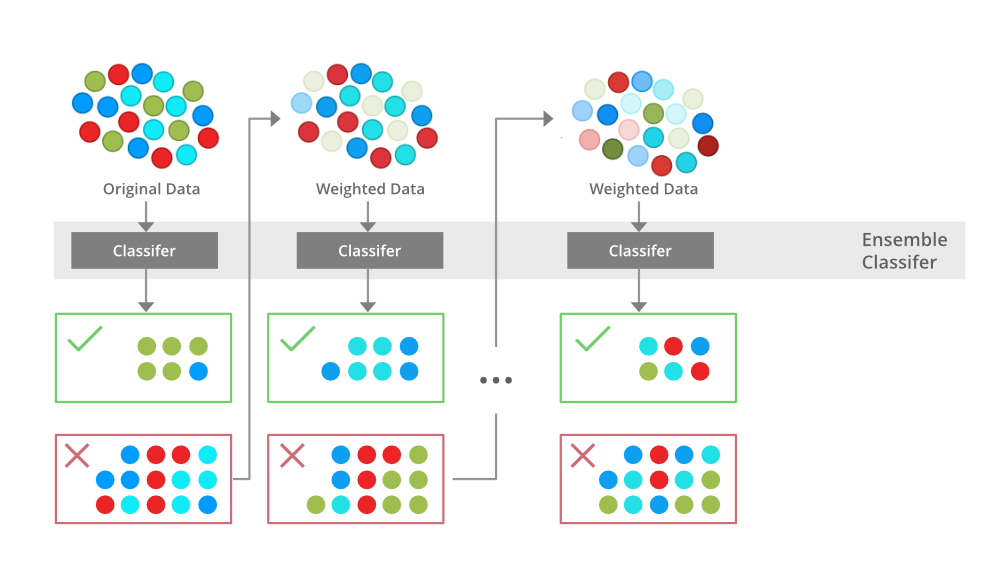

### XGBoost \
XGBoost is an implementation of Gradient Boosted decision trees. \
In this algorithm, decision trees are created in sequential form. Weights play an important role in XGBoost. Weights are assigned to all the independent variables which are then fed into the decision tree which predicts results. The weight of variables predicted wrong by the tree is increased and these variables are then fed to the second decision tree.  These individual classifiers/predictors then ensemble to give a strong and more precise model.

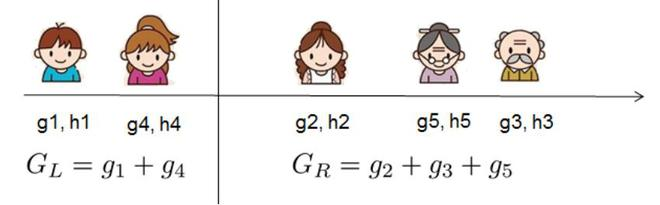

Here an example dataset:\
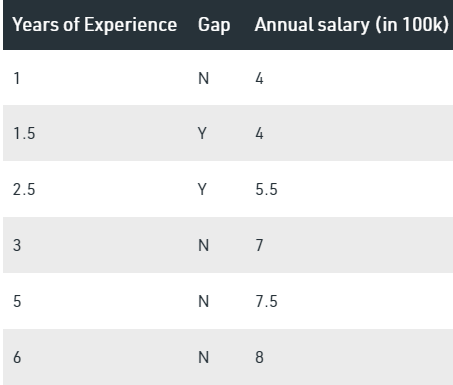

First we take the base learner, by default the base model always take the average salary i.e F_0 =6       (100k). Now, we calculate the residual values:
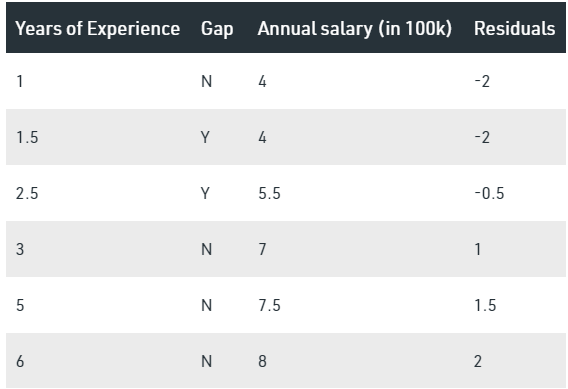

Now, let’s consider the decision tree, we will be splitting the data based on experience <=2 or otherwise\
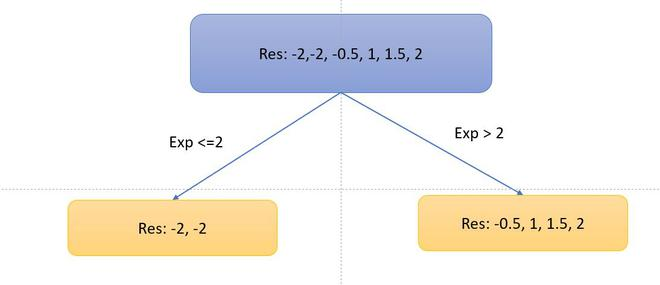

Now, let’s calculate the similarity metrices of left and right side. \


calculate the similarity metrices of left and right side. Similarly, we can try multiple splits and calculate the information gain. We will take the split with the highest information gain. Let’s for now take this information gain. Further, we will split the decision tree if there is a gap or not.\
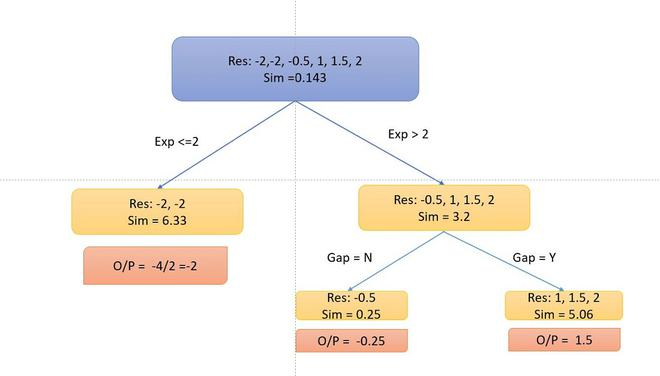

To calculate the particular output, we follow the decision tree multiplied with a learning rate \alpha (let’s take 0.5) and add with the previous learner (base learner for the first tree) i.e for data point 1: o/p  = 6 + 0.5 *-2 =5. So our table becomes. \
Similarly, the algorithm produces more than one decision tree and combine them additively to generate better estimates

### get results-without DTW measure

here is predict company  MSFT
MAE: 3.164


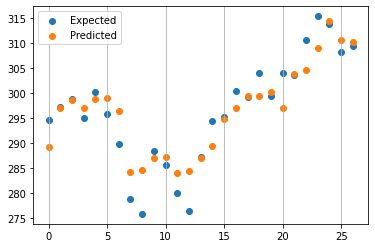

here is predict company  AVGO
MAE: 6.824


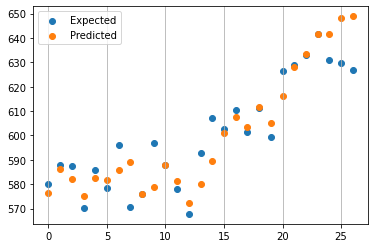

here is predict company  CDW
MAE: 2.071


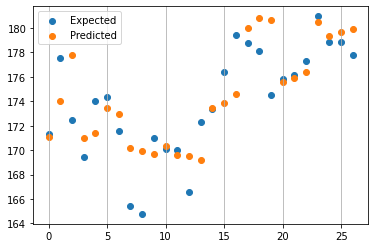

here is predict company  INTU
MAE: 11.157


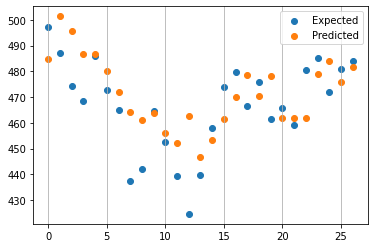

here is predict company  TER
MAE: 2.162


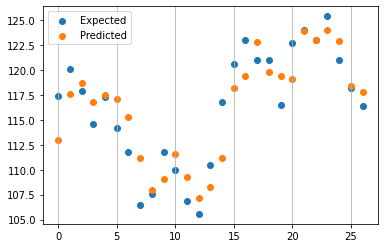

here is predict company  QCOM
MAE: 2.792


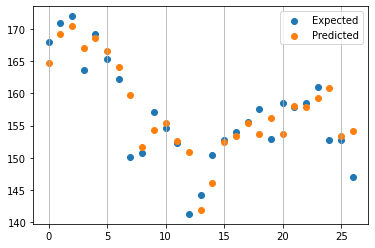

here is predict company  EQIX
MAE: 10.670


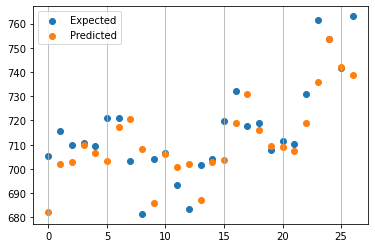

here is predict company  SPNS
MAE: 0.321


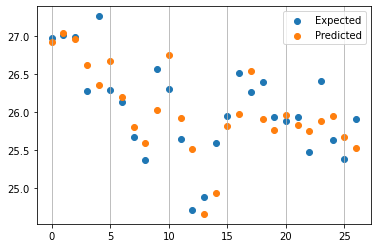

here is predict company  MGIC
MAE: 0.170


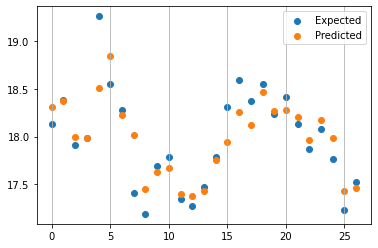

here is predict company  ESLT
MAE: 2.997


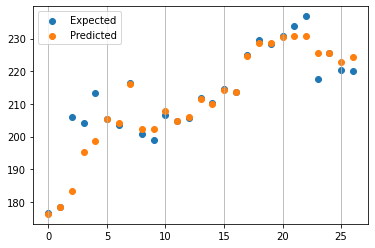

here is predict company  LOGI
MAE: 0.994


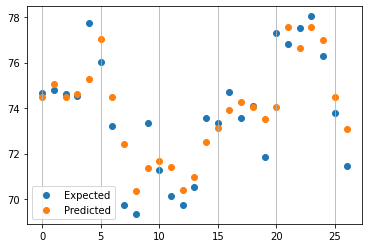

here is predict company  AUDC
MAE: 0.372


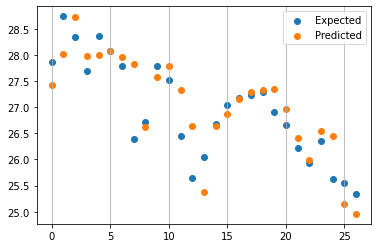

here is predict company  ATVI
MAE: 0.329


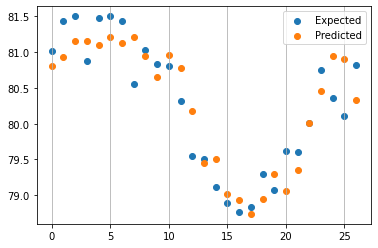

In [ ]:
weekly, monthly, maeAll_fair_obj, pred = predict_weekMonthly_byXGB(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited, _nestimators=200, _nin=10, obj=fair_obj)

here is predict company  MSFT
MAE: 2.362


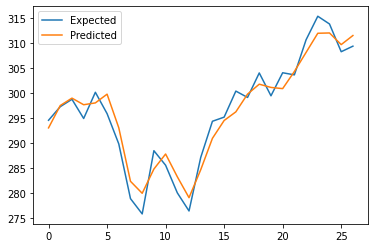

here is predict company  AVGO
MAE: 3.492


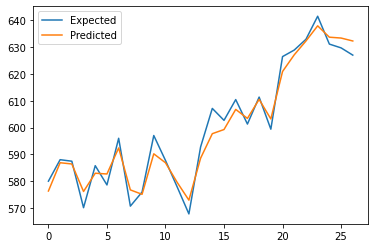

here is predict company  CDW
MAE: 1.536


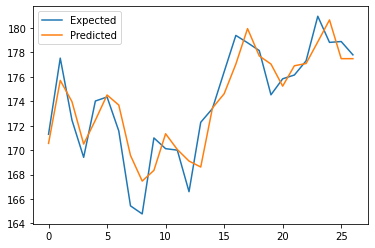

here is predict company  INTU
MAE: 5.423


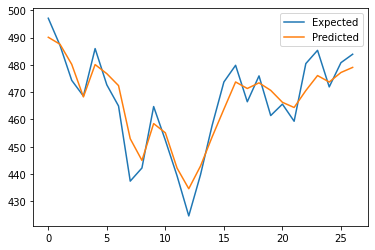

here is predict company  TER
MAE: 1.874


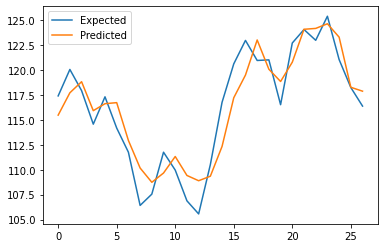

here is predict company  QCOM
MAE: 1.816


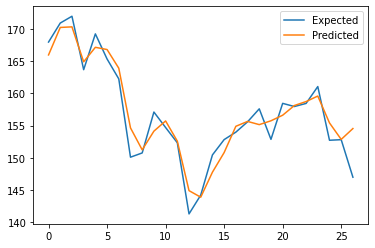

here is predict company  EQIX
MAE: 7.447


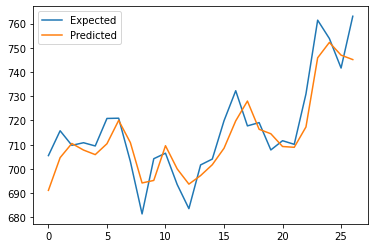

here is predict company  SPNS
MAE: 0.329


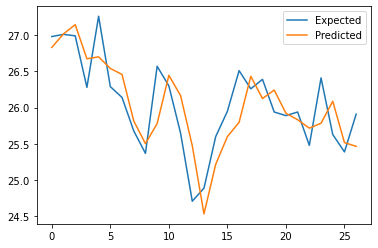

here is predict company  MGIC
MAE: 0.157


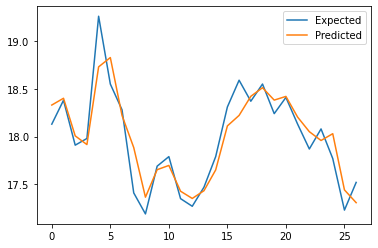

here is predict company  ESLT
MAE: 0.885


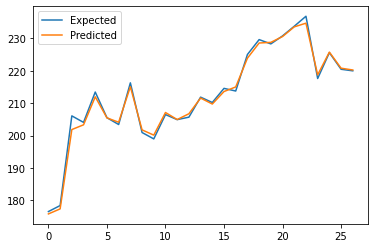

here is predict company  LOGI
MAE: 0.849


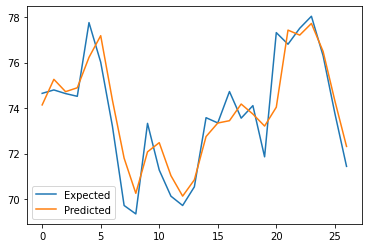

here is predict company  AUDC
MAE: 0.401


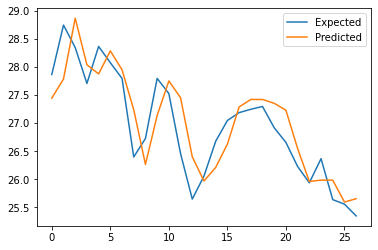

here is predict company  ATVI
MAE: 0.364


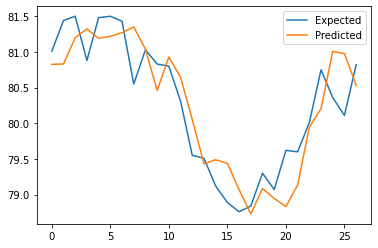

In [ ]:
weekly, monthly, maeAll_squareErro, pred = predict_weekMonthly_byXGB(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited, _nestimators=200, _nin=10)

here is predict company  MSFT
MAE: 3.673


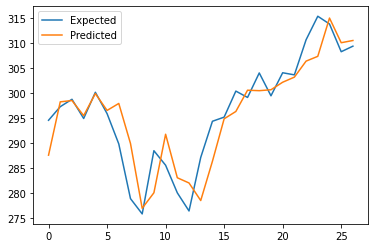

here is predict company  AVGO
MAE: 7.126


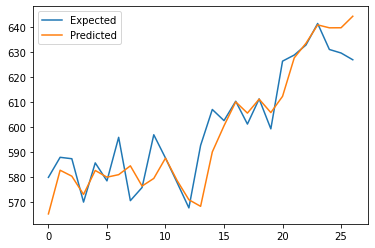

here is predict company  CDW
MAE: 2.140


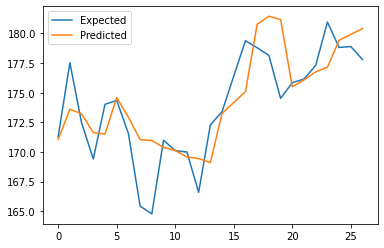

here is predict company  INTU
MAE: 12.484


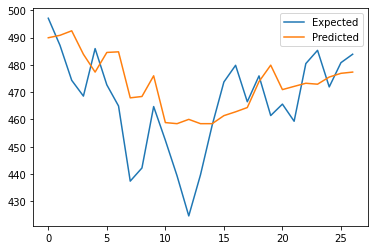

here is predict company  TER
MAE: 2.288


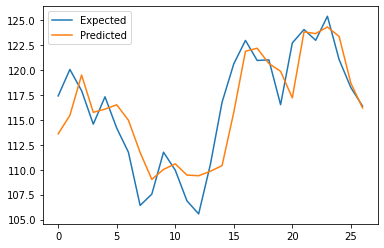

here is predict company  QCOM
MAE: 2.604


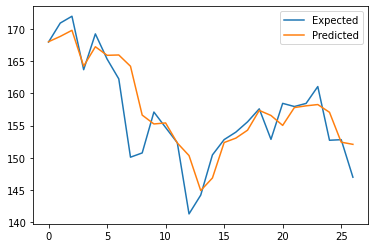

here is predict company  EQIX
MAE: 12.845


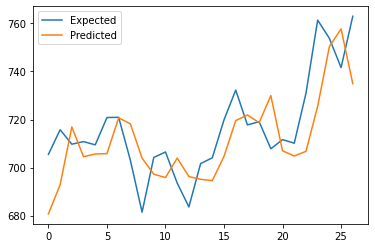

here is predict company  SPNS
MAE: 25.553


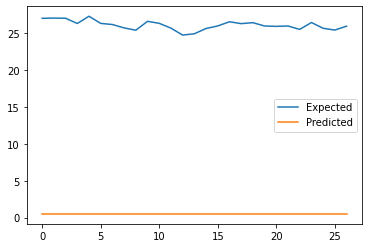

here is predict company  MGIC
MAE: 18.056


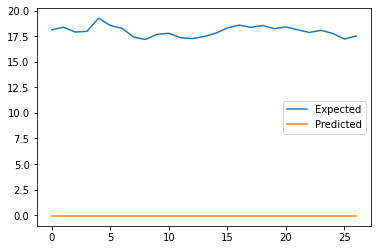

here is predict company  ESLT
MAE: 2.745


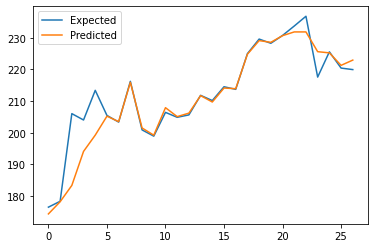

here is predict company  LOGI
MAE: 0.994


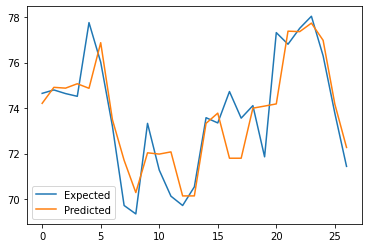

here is predict company  AUDC
MAE: 26.442


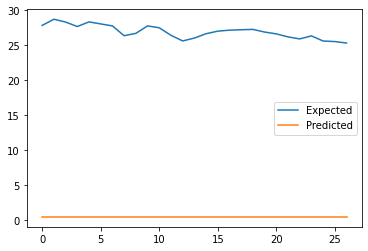

here is predict company  ATVI
MAE: 0.304


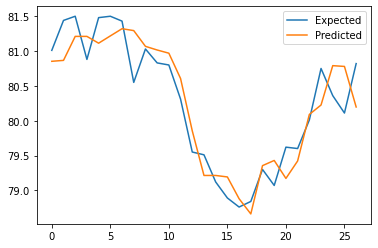

In [ ]:
weekly, monthly, mae_log_cosh_obj, pred = predict_weekMonthly_byXGB(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited, _nestimators=200, _nin=10, obj=log_cosh_obj)

here is predict company  MSFT
MAE: 3.594


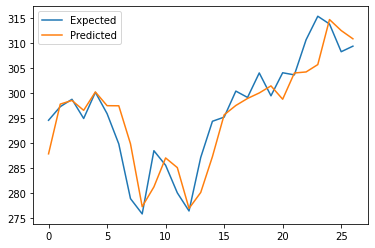

here is predict company  AVGO
MAE: 6.801


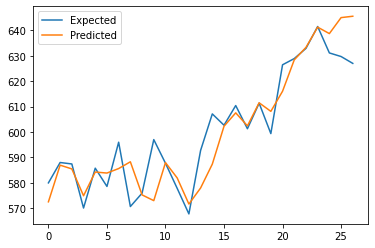

here is predict company  CDW
MAE: 1.727


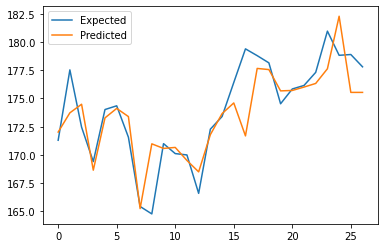

here is predict company  INTU
MAE: 11.360


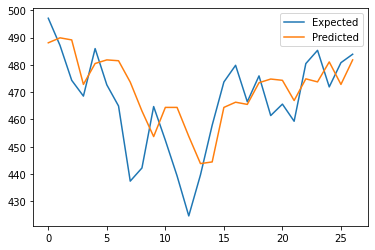

here is predict company  TER
MAE: 2.364


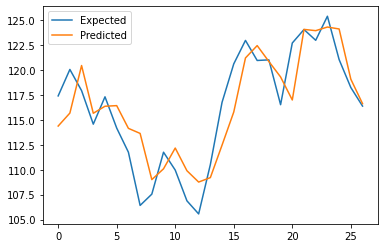

here is predict company  QCOM
MAE: 2.513


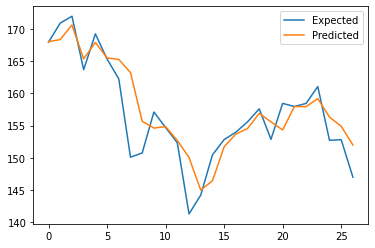

here is predict company  EQIX
MAE: 9.961


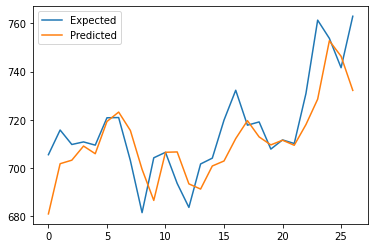

here is predict company  SPNS
MAE: 36.619


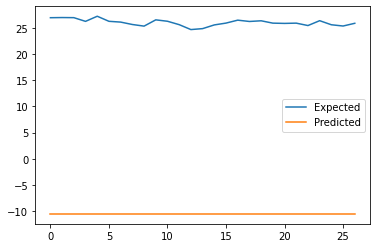

here is predict company  MGIC
MAE: 40.768


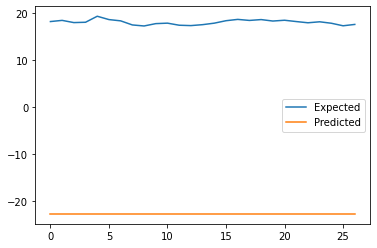

here is predict company  ESLT
MAE: 2.765


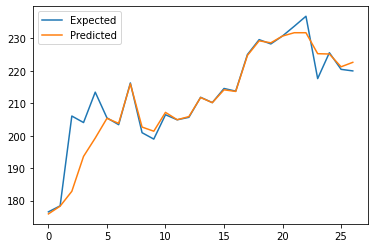

here is predict company  LOGI
MAE: 1.233


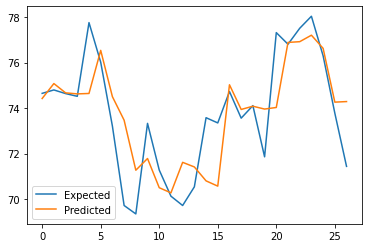

here is predict company  AUDC
MAE: 36.319


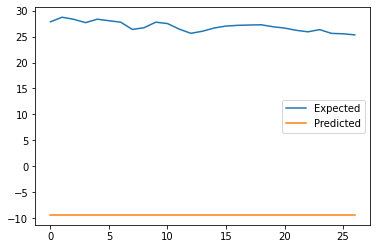

here is predict company  ATVI
MAE: 0.385


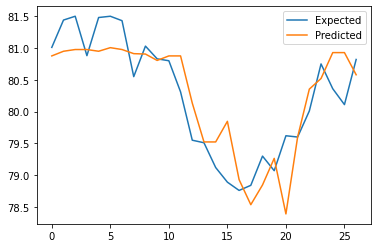

In [ ]:
weekly, monthly, maeAll_huber, pred = predict_weekMonthly_byXGB(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited, _nestimators=200, _nin=10, obj=huber_approx_obj)

here is predict company  MSFT
MAE: 2.362


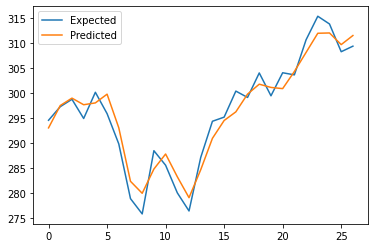

here is predict company  AVGO
MAE: 3.492


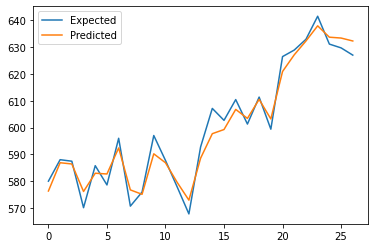

here is predict company  CDW
MAE: 1.536


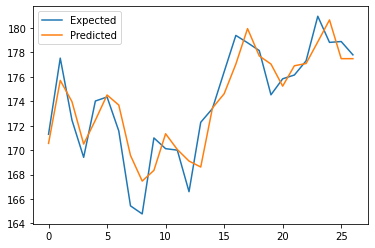

here is predict company  INTU
MAE: 5.423


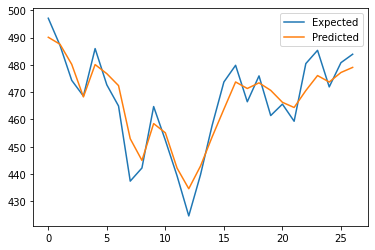

here is predict company  TER
MAE: 1.874


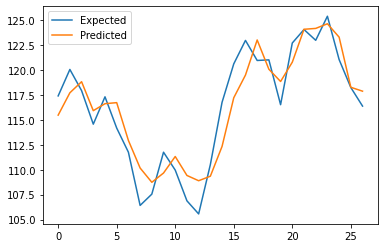

here is predict company  QCOM
MAE: 1.816


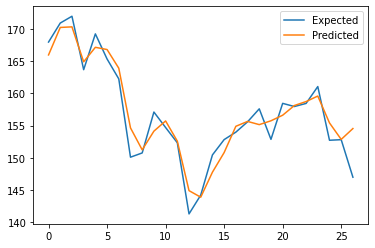

here is predict company  EQIX
MAE: 7.447


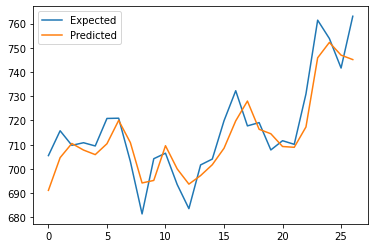

here is predict company  SPNS
MAE: 0.329


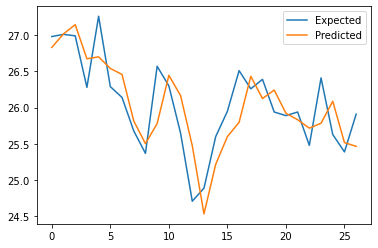

here is predict company  MGIC
MAE: 0.157


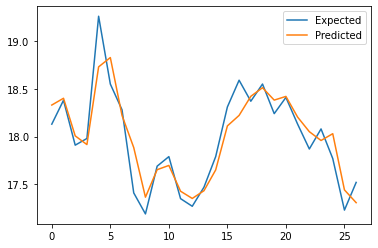

here is predict company  ESLT
MAE: 0.885


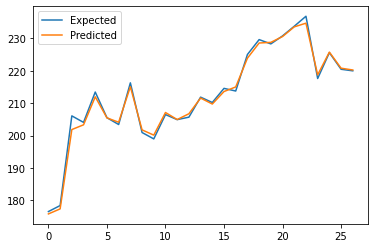

here is predict company  LOGI
MAE: 0.849


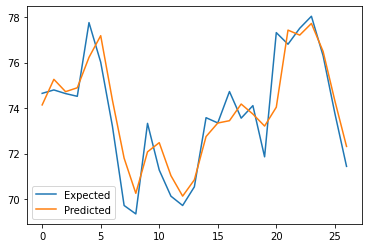

here is predict company  AUDC
MAE: 0.401


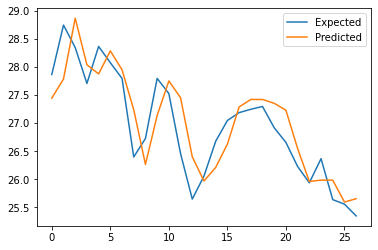

here is predict company  ATVI
MAE: 0.364


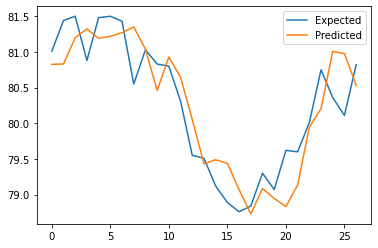

In [ ]:
weekly, monthly, maeAll_eval, pred = predict_weekMonthly_byXGB(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited, _nestimators=200, _nin=10, eval=huber_loss)

In [ ]:
print(maeAll_fair_obj)
print(maeAll_huber)
print(maeAll_eval)
print(maeAll_squareErro)
print(mae_log_cosh_obj)

[3.1635222, 6.8239655, 2.0711405, 11.157017, 2.1623275, 2.7916927, 10.670344, 0.32075965, 0.17015415, 2.9970286, 0.99432343, 0.37234786, 0.32894418]
[3.5943818, 6.801317, 1.727218, 11.359898, 2.364456, 2.5127084, 9.961053, 36.61866, 40.76783, 2.7651236, 1.2332681, 36.319485, 0.38462603]
[2.362394, 3.4924972, 1.5358582, 5.422576, 1.8736284, 1.815893, 7.4473605, 0.32923436, 0.15678187, 0.8851872, 0.8490081, 0.40116712, 0.36403516]
[2.362394, 3.4924972, 1.5358582, 5.422576, 1.8736284, 1.815893, 7.4473605, 0.32923436, 0.15678187, 0.8851872, 0.8490081, 0.40116712, 0.36403516]
[3.6732504, 7.1263223, 2.1399186, 12.484263, 2.287688, 2.6040888, 12.844725, 25.552591, 18.056425, 2.745017, 0.99422455, 26.44185, 0.30384347]


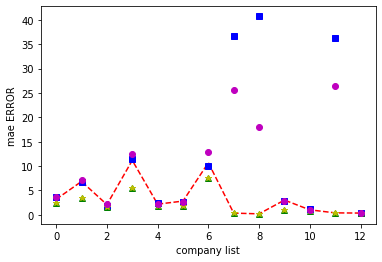

In [ ]:
xxis = np.arange(0, 13, 1)
plt.plot(xxis, maeAll_fair_obj, 'r--', xxis, maeAll_huber, 'bs', xxis, maeAll_eval, 'g^'
         , xxis, maeAll_squareErro, 'y*', xxis, mae_log_cosh_obj, 'mo')
plt.xlabel('company list')
plt.ylabel('mae ERROR')
plt.show()

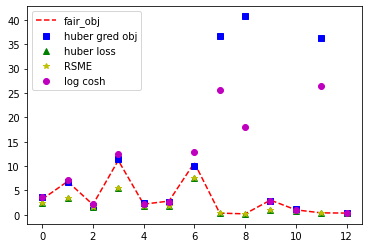

In [ ]:
xxis = np.arange(0, 13, 1)
plt.plot(xxis, maeAll_fair_obj, 'r--', label ="fair_obj")
plt.plot(xxis, maeAll_huber, 'bs', label ="huber gred obj")
plt.plot(xxis, maeAll_eval, 'g^', label ="huber loss")
plt.plot(xxis, maeAll_squareErro, 'y*', label ="RSME")
plt.plot(xxis, mae_log_cosh_obj, 'mo', label ="log cosh")
plt.legend()


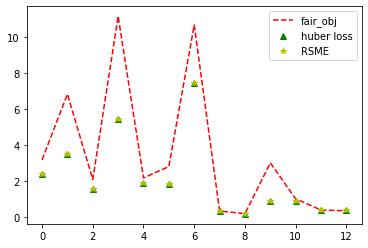

In [ ]:
xxis = np.arange(0, 13, 1)
plt.plot(xxis, maeAll_fair_obj, 'r--', label ="fair_obj")
plt.plot(xxis, maeAll_eval, 'g^', label ="huber loss")
plt.plot(xxis, maeAll_squareErro, 'y*', label ="RSME")
plt.legend()

### get the results--old

In [ ]:
stocks_yahoofinance_edited

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 2.362


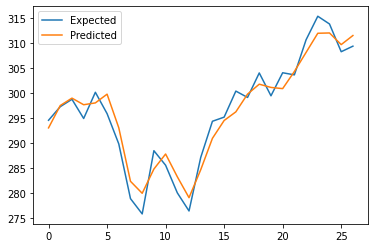

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 3.492


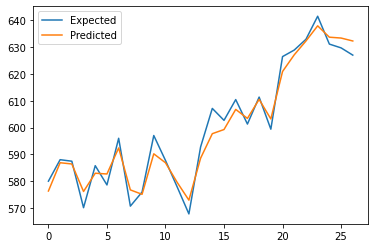

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 1.536


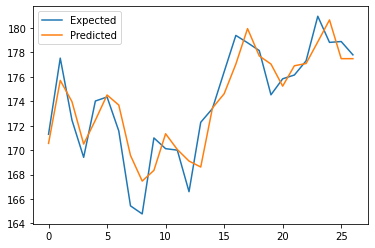

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 5.423


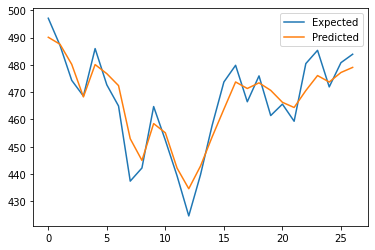

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 1.874


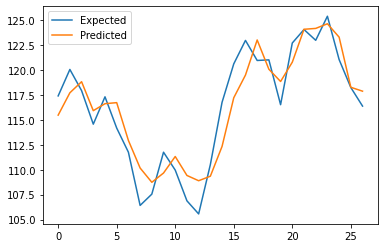

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 1.816


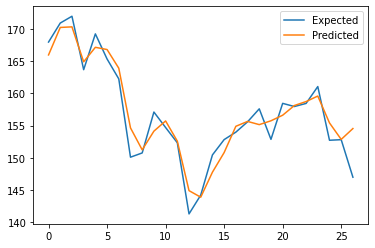

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 7.447


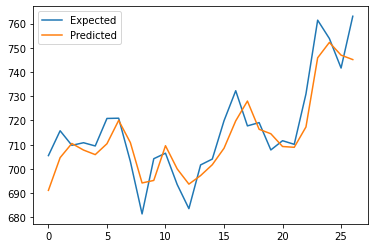

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.329


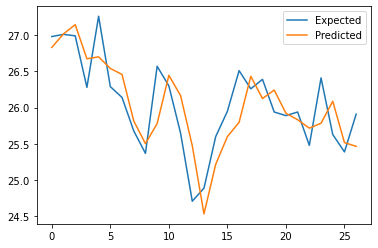

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.157


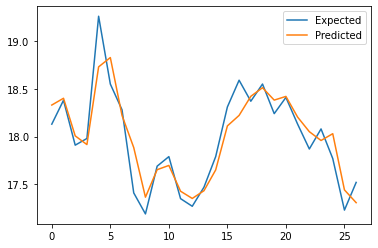

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.885


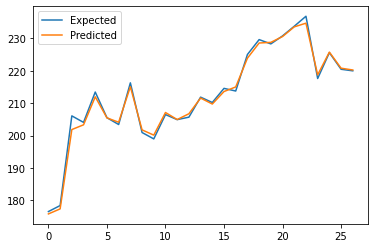

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.849


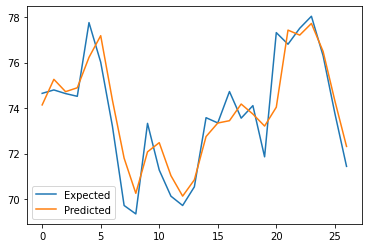

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.401


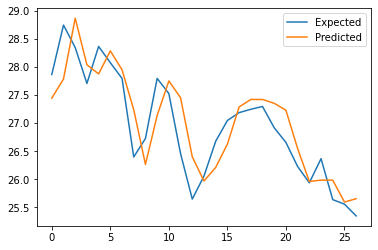

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.364


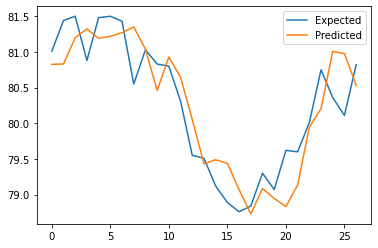

In [ ]:
weekly, monthly = predict_weekMonthly_byXGB(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited, _nestimators=200, _nin=10)

In [ ]:
print(weekly)
print(monthly)

[-0.8056946, 0.32659233, 0.0049336753, -1.4885254, 0.4098867, 0.872857, -4.779236, -0.03120719, 0.05633545, -0.13679504, -0.07525211, 0.19853146, -0.10797119]
[0.054308858, -0.4967561, 0.07876926, 0.24761736, 0.16254905, 0.32236058, -2.7642233, -0.021689096, 0.016217055, -0.29231998, 0.13292609, 0.07878395, 0.0032529477]


In [ ]:
stocks_alphafinance_edited = transformWeekMonthdata(weekly, monthly, stocks_alphafinance_edited)
stocks_alphafinance_edited.head(15)

-0.42734957
-0.19063106


,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD,Weekly,Monthly
Symbol,,,,,,,,,,,,
MSFT,14.316393,1.147154,72.249347,1.001643,0.283329,1970.863760,24.230136,42.624885,37.502147,-7.998335,3,4
AVGO,3.767996,1.326051,62.202813,0.600194,0.166214,1245.794549,28.353259,67.441001,27.040873,-5.775387,4,3
CDW,1.124751,1.214419,61.387117,0.531257,0.137587,1203.485569,3.655337,41.477067,21.708876,-13.175115,4,4
INTU,1.055878,1.241720,61.063863,0.527290,0.137835,1187.209307,20.338688,48.951036,22.115209,-24.764466,2,4
TER,13.012789,1.391666,45.432665,0.702944,0.256520,630.276844,-12.292734,49.394636,40.698953,-28.838745,4,4
QCOM,11.694107,1.274919,43.889468,0.685793,0.246982,592.122826,4.745956,49.348611,36.488148,-19.620495,4,4
EQIX,4.631243,0.806046,36.768798,0.537714,0.169877,440.193761,10.541261,13.197275,18.692886,-9.793814,0,0
SPNS,2.580141,1.002226,32.841469,0.429483,0.146601,370.183683,-20.325953,21.057744,19.692696,-24.789550,4,4
MGIC,10.445718,0.884644,29.326015,0.622388,0.251670,314.115486,12.379731,52.131487,27.263850,-16.292403,4,4


In [ ]:
stocks_alphafinance_edited.to_csv('tempAlpha_edit.csv')

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 1.187


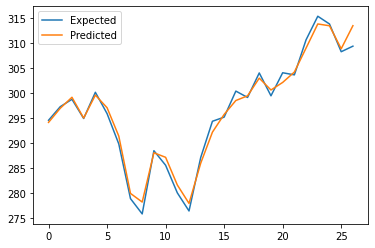

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 1.914


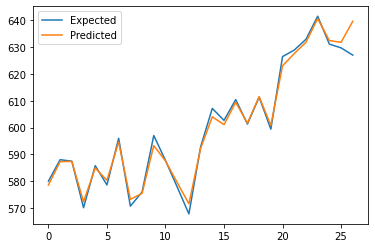

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.607


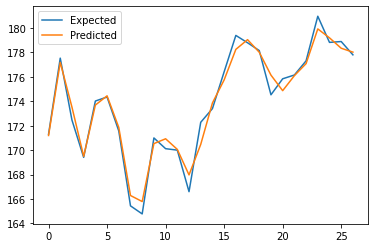

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 2.600


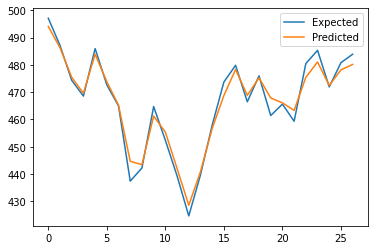

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.864


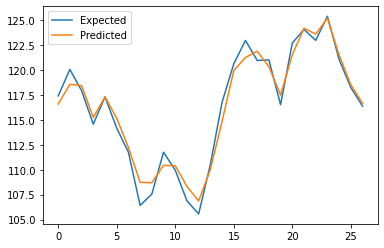

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.980


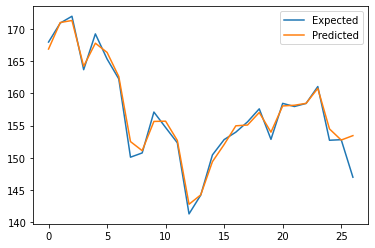

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 3.735


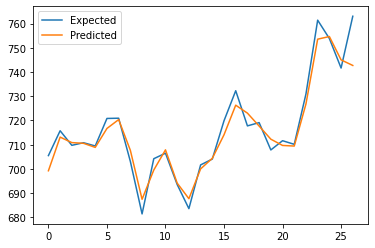

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.176


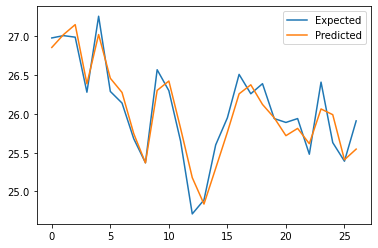

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.081


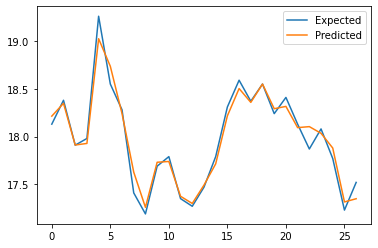

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.419


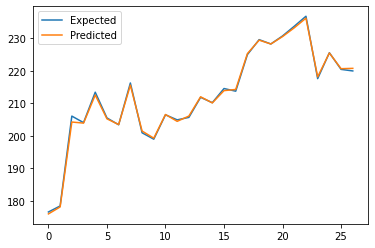

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.455


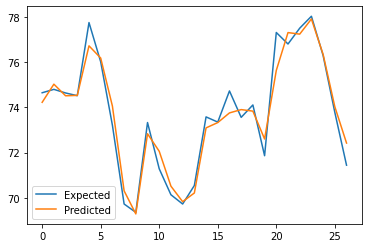

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.254


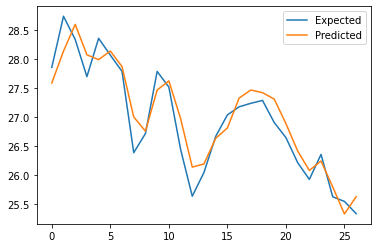

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn("Use subset (sliced data) of np.ndarray is not recommended " +


here new predict
MAE: 0.262


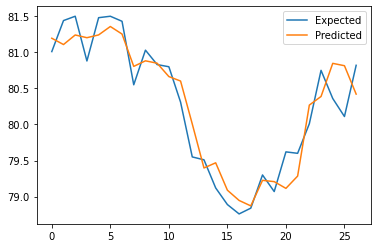

In [ ]:
weekly, monthly = predict_weekMonthly_byXGB(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited)

In [ ]:
print(weekly)
print( monthly)

[-0.012627495, 1.2065023, -0.085847646, -0.5536126, 0.07118649, 0.9146186, -3.0798476, -0.0834109, 0.014859306, 0.005560981, 0.02084181, 0.14047834, -0.007783678]
[0.1912514, 0.2925528, 0.02637397, 0.11578935, 0.08932128, 0.36764073, -1.3630213, -0.023738436, 0.0048056003, -0.12571208, -0.012110109, 0.094577365, 0.025139702]


In [ ]:
stocks_alphafinance_edited = transformWeekMonthdata(weekly, monthly, stocks_alphafinance_edited)
stocks_alphafinance_edited.to_csv('alpha_predict.csv')
stocks_alphafinance_edited.head(13)

In [ ]:
stocks_alphafinance_edited.head(13)

,Symbol,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD,Weekly,Monthly
0,MSFT,14.316393,1.147154,72.249347,1.001643,0.283329,1970.863760,24.230136,42.624885,37.502147,-7.998335,3,4
1,AVGO,3.767996,1.326051,62.202813,0.600194,0.166214,1245.794549,28.353259,67.441001,27.040873,-5.775387,4,4
2,CDW,1.124751,1.214419,61.387117,0.531257,0.137587,1203.485569,3.655337,41.477067,21.708876,-13.175115,3,4
3,INTU,1.055878,1.241720,61.063863,0.527290,0.137835,1187.209307,20.338688,48.951036,22.115209,-24.764466,2,4
4,TER,13.012789,1.391666,45.432665,0.702944,0.256520,630.276844,-12.292734,49.394636,40.698953,-28.838745,3,4
5,QCOM,11.694107,1.274919,43.889468,0.685793,0.246982,592.122826,4.745956,49.348611,36.488148,-19.620495,4,4
6,EQIX,4.631243,0.806046,36.768798,0.537714,0.169877,440.193761,10.541261,13.197275,18.692886,-9.793814,0,0
7,SPNS,2.580141,1.002226,32.841469,0.429483,0.146601,370.183683,-20.325953,21.057744,19.692696,-24.789550,3,3
8,MGIC,10.445718,0.884644,29.326015,0.622388,0.251670,314.115486,12.379731,52.131487,27.263850,-16.292403,3,3
9,ESLT,6.914897,0.644831,24.238573,0.542716,0.210670,242.189202,53.331939,34.271554,18.584678,26.325159,3,3


### use LSTM to predict-old

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 3.78 RMSE
Monthly Test Score: 7.33 RMSE
Weekly Test Score: 7.33 RMSE
Weekly Mean Error: -4.05 
Monly Mean Error: -5.52 


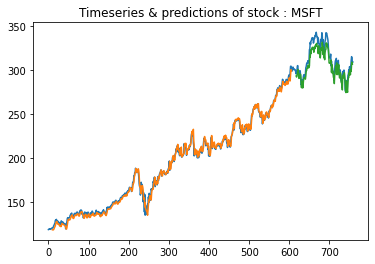

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 9.82 RMSE
Monthly Test Score: 53.65 RMSE
Weekly Test Score: 53.65 RMSE
Weekly Mean Error: -50.72 
Monly Mean Error: -68.39 


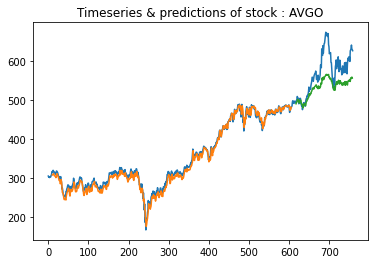

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 3.13 RMSE
Monthly Test Score: 3.57 RMSE
Weekly Test Score: 3.57 RMSE
Weekly Mean Error: -0.99 
Monly Mean Error: -1.39 


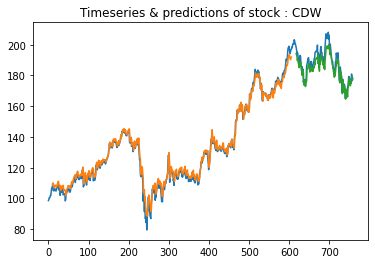

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 11.29 RMSE
Monthly Test Score: 19.54 RMSE
Weekly Test Score: 19.54 RMSE
Weekly Mean Error: -12.91 
Monly Mean Error: -13.25 


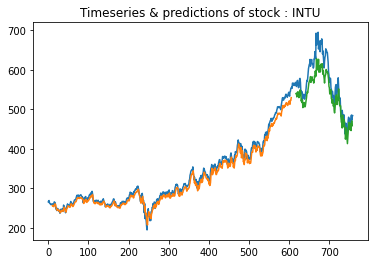

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 3.38 RMSE
Monthly Test Score: 3.63 RMSE
Weekly Test Score: 3.63 RMSE
Weekly Mean Error: 1.05 
Monly Mean Error: 1.52 


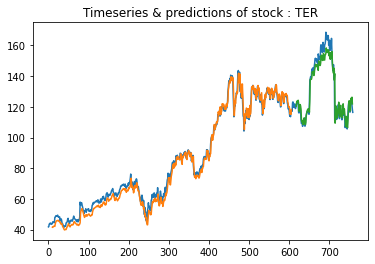

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 3.89 RMSE
Monthly Test Score: 6.39 RMSE
Weekly Test Score: 6.39 RMSE
Weekly Mean Error: 4.23 
Monly Mean Error: 3.97 


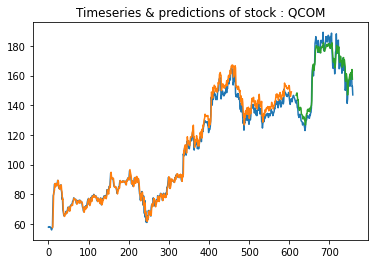

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 13.96 RMSE
Monthly Test Score: 15.63 RMSE
Weekly Test Score: 15.63 RMSE
Weekly Mean Error: 5.08 
Monly Mean Error: 7.08 


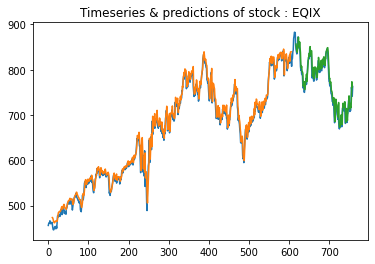

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 0.72 RMSE
Monthly Test Score: 0.96 RMSE
Weekly Test Score: 0.96 RMSE
Weekly Mean Error: 0.14 
Monly Mean Error: 0.14 


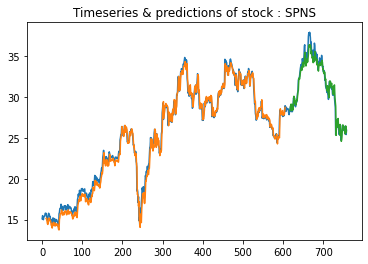

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 0.32 RMSE
Monthly Test Score: 0.50 RMSE
Weekly Test Score: 0.50 RMSE
Weekly Mean Error: -0.27 
Monly Mean Error: -0.17 


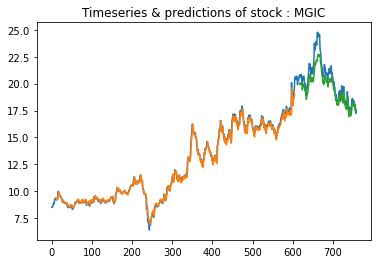

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 2.51 RMSE
Monthly Test Score: 14.97 RMSE
Weekly Test Score: 14.97 RMSE
Weekly Mean Error: -12.38 
Monly Mean Error: -19.00 


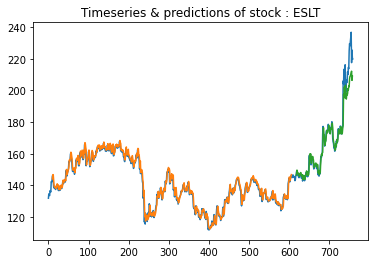

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 4.01 RMSE
Monthly Test Score: 3.19 RMSE
Weekly Test Score: 3.19 RMSE
Weekly Mean Error: 2.23 
Monly Mean Error: 2.51 


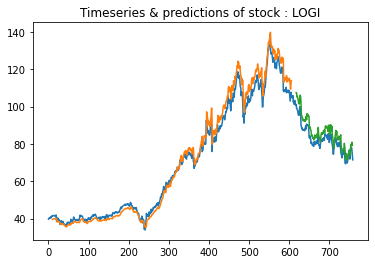

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 0.97 RMSE
Monthly Test Score: 0.69 RMSE
Weekly Test Score: 0.69 RMSE
Weekly Mean Error: -0.32 
Monly Mean Error: -0.23 


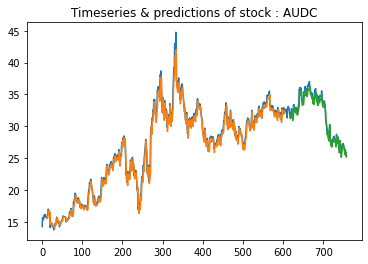

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Train Score: 3.70 RMSE
Monthly Test Score: 2.72 RMSE
Weekly Test Score: 2.72 RMSE
Weekly Mean Error: 2.69 
Monly Mean Error: 2.50 


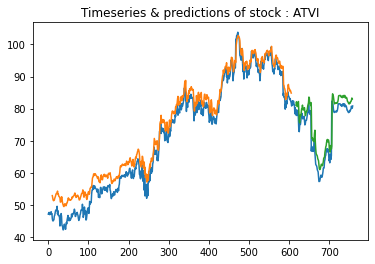

In [ ]:
weekly, monthly, pred = predict_weekMonthly(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited)

In [ ]:
print(weekly)
print(monthly)

[-5.5200493331674165, -68.39172255812508, -1.3864602514090747, -13.24556598005539, 1.5174244524583476, 3.9740986048123768, 7.080274954836745, 0.1397258007465329, -0.1711250453529275, -19.002446263592706, 2.5122480160256453, -0.22644409924921088, 2.5000218515581483]
[-4.0453181461404215, -50.72060502292962, -0.9912247224295145, -12.90783801309883, 1.0501764106659623, 4.227478863091126, 5.0793243347357695, 0.143222428744931, -0.2702225629874962, -12.383201709510805, 2.229205324322354, -0.3192403223911771, 2.6891988421122126]


In [ ]:
#################################################################
#   8. Convertion of technical predictions into recomendations  #
#################################################################
# In this section, we use the arrays weekly, monthly that occured as the ME
# (mean error) of our predictions for last's week, month data, and after
# we normalize them between (-1,1) we classify the result as 'Strong Buy', 'Buy'
# ..., and more specifically as 0 (Strong Sell) to 4 (Strong Buy)

weekly =[-5.5200493331674165, -68.39172255812508, -1.3864602514090747, -13.24556598005539, 1.5174244524583476, 3.9740986048123768, 7.080274954836745, 0.1397258007465329, -0.1711250453529275, -19.002446263592706, 2.5122480160256453, -0.22644409924921088, 2.5000218515581483]
monthly =[-4.0453181461404215, -50.72060502292962, -0.9912247224295145, -12.90783801309883, 1.0501764106659623, 4.227478863091126, 5.0793243347357695, 0.143222428744931, -0.2702225629874962, -12.383201709510805, 2.229205324322354, -0.3192403223911771, 2.6891988421122126]

stocks_alphafinance_edited = transformWeekMonthdata(weekly, monthly, stocks_alphafinance_edited)
stocks_alphafinance_edited.to_csv('alpha_full.csv')
stocks_alphafinance_edited.head(13)


-6.940001526962616
-5.093772638139654


,Symbol,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD,Weekly,Monthly
0,MSFT,14.316393,1.147154,72.249347,1.001643,0.283329,1970.863760,24.230136,42.624885,37.502147,-7.998335,4,4
1,AVGO,3.767996,1.326051,62.202813,0.600194,0.166214,1245.794549,28.353259,67.441001,27.040873,-5.775387,0,0
2,CDW,1.124751,1.214419,61.387117,0.531257,0.137587,1203.485569,3.655337,41.477067,21.708876,-13.175115,4,4
3,INTU,1.055878,1.241720,61.063863,0.527290,0.137835,1187.209307,20.338688,48.951036,22.115209,-24.764466,3,3
4,TER,13.012789,1.391666,45.432665,0.702944,0.256520,630.276844,-12.292734,49.394636,40.698953,-28.838745,4,4
5,QCOM,11.694107,1.274919,43.889468,0.685793,0.246982,592.122826,4.745956,49.348611,36.488148,-19.620495,4,4
6,EQIX,4.631243,0.806046,36.768798,0.537714,0.169877,440.193761,10.541261,13.197275,18.692886,-9.793814,4,4
7,SPNS,2.580141,1.002226,32.841469,0.429483,0.146601,370.183683,-20.325953,21.057744,19.692696,-24.789550,4,4
8,MGIC,10.445718,0.884644,29.326015,0.622388,0.251670,314.115486,12.379731,52.131487,27.263850,-16.292403,4,4
9,ESLT,6.914897,0.644831,24.238573,0.542716,0.210670,242.189202,53.331939,34.271554,18.584678,26.325159,3,3


### mixed measurement-for results

LSTM RESULT

Train Score: 4.32 RMSE
Monthly Test Score: 6.77 RMSE
Weekly Test Score: 6.77 RMSE
Weekly Mean Error: 2.62 
Monly Mean Error: 1.68 


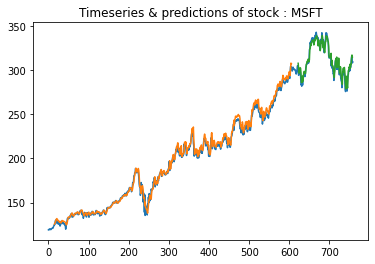

Train Score: 8.34 RMSE
Monthly Test Score: 86.85 RMSE
Weekly Test Score: 86.85 RMSE
Weekly Mean Error: -85.11 
Monly Mean Error: -102.44 


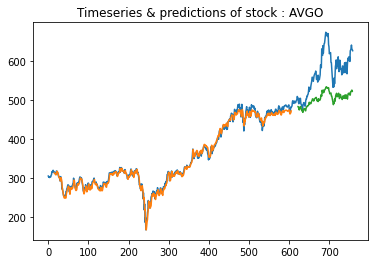

Train Score: 3.30 RMSE
Monthly Test Score: 4.02 RMSE
Weekly Test Score: 4.02 RMSE
Weekly Mean Error: -1.73 
Monly Mean Error: -1.78 


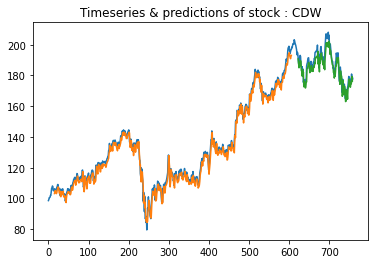

Train Score: 7.98 RMSE
Monthly Test Score: 19.29 RMSE
Weekly Test Score: 19.29 RMSE
Weekly Mean Error: 11.74 
Monly Mean Error: 11.89 


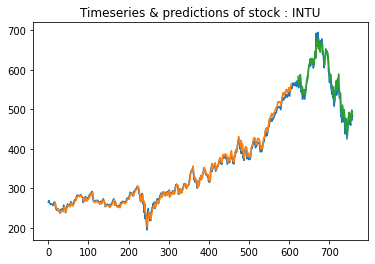

Train Score: 2.57 RMSE
Monthly Test Score: 3.85 RMSE
Weekly Test Score: 3.85 RMSE
Weekly Mean Error: 1.71 
Monly Mean Error: 1.81 


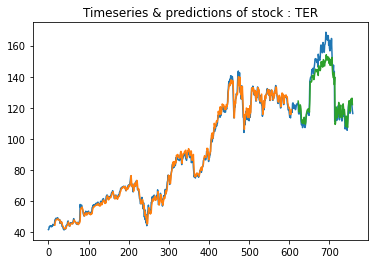

Train Score: 3.82 RMSE
Monthly Test Score: 6.09 RMSE
Weekly Test Score: 6.09 RMSE
Weekly Mean Error: 3.74 
Monly Mean Error: 3.55 


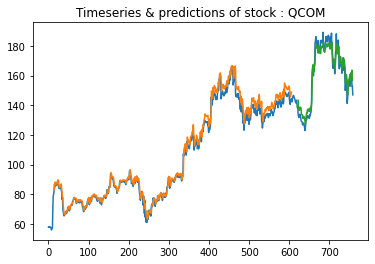

Train Score: 15.92 RMSE
Monthly Test Score: 18.51 RMSE
Weekly Test Score: 18.51 RMSE
Weekly Mean Error: -11.11 
Monly Mean Error: -10.32 


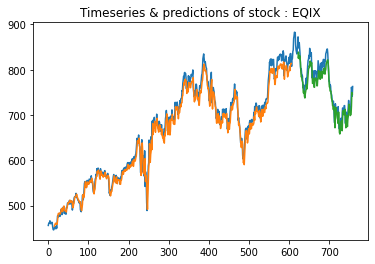

Train Score: 0.75 RMSE
Monthly Test Score: 0.91 RMSE
Weekly Test Score: 0.91 RMSE
Weekly Mean Error: -0.13 
Monly Mean Error: -0.09 


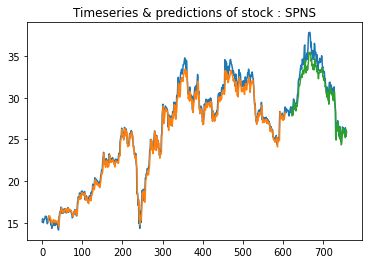

Train Score: 0.58 RMSE
Monthly Test Score: 0.98 RMSE
Weekly Test Score: 0.98 RMSE
Weekly Mean Error: -0.90 
Monly Mean Error: -0.82 


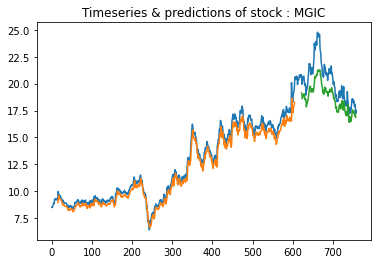

Train Score: 4.28 RMSE
Monthly Test Score: 31.08 RMSE
Weekly Test Score: 31.08 RMSE
Weekly Mean Error: -29.32 
Monly Mean Error: -39.44 


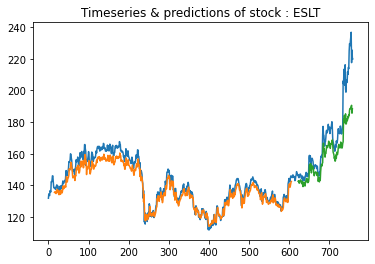

Train Score: 3.92 RMSE
Monthly Test Score: 3.59 RMSE
Weekly Test Score: 3.59 RMSE
Weekly Mean Error: 2.78 
Monly Mean Error: 3.15 


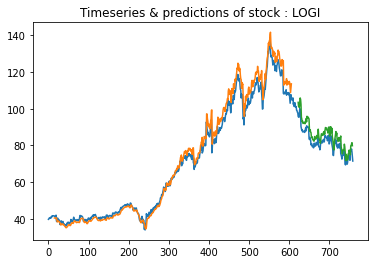

Train Score: 1.44 RMSE
Monthly Test Score: 1.04 RMSE
Weekly Test Score: 1.04 RMSE
Weekly Mean Error: -0.85 
Monly Mean Error: -0.72 


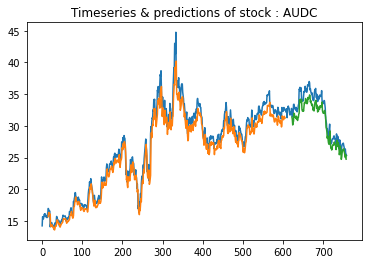

Train Score: 1.91 RMSE
Monthly Test Score: 1.71 RMSE
Weekly Test Score: 1.71 RMSE
Weekly Mean Error: 1.66 
Monly Mean Error: 1.50 


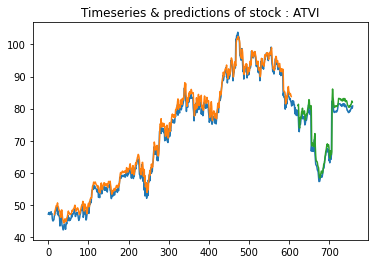

In [ ]:
weekly_LSTM, monthly_LSTM, trainScore_LSTM, preds_LSTM, tureYs_LSTM = predict_weekMonthly_lstm(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited
                                                                                               , test_size_monthly = 27,test_size_weekly = 9, look_back = 15)

XGB FOR different loss

here is predict company  MSFT
MAE: 1.929


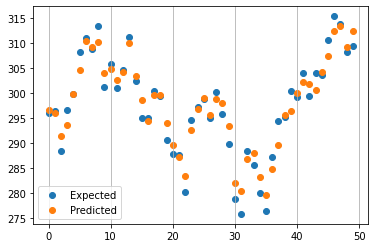

here is predict company  AVGO
MAE: 2.999


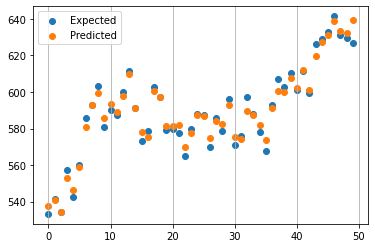

here is predict company  CDW
MAE: 1.289


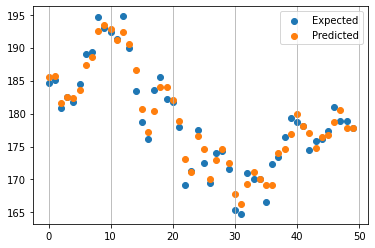

here is predict company  INTU
MAE: 4.233


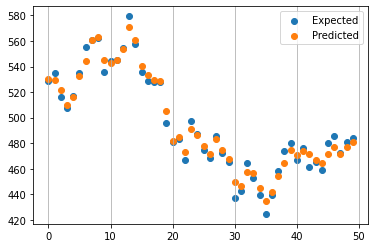

here is predict company  TER
MAE: 1.346


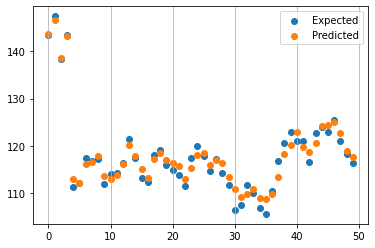

here is predict company  QCOM
MAE: 1.303


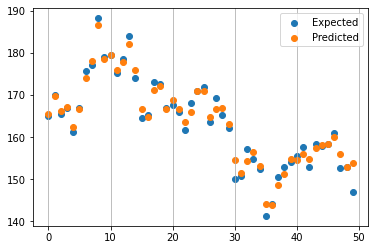

here is predict company  EQIX
MAE: 6.421


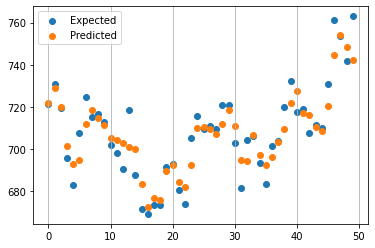

here is predict company  SPNS
MAE: 0.298


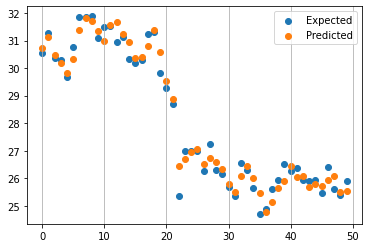

here is predict company  MGIC
MAE: 0.145


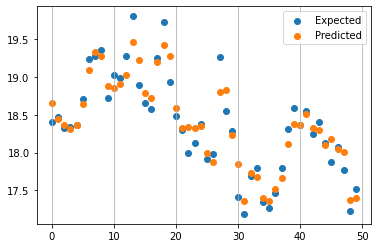

here is predict company  ESLT
MAE: 0.770


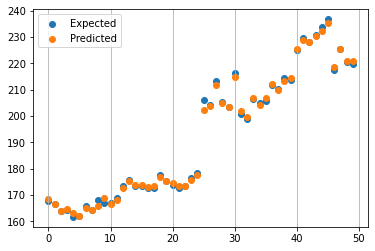

here is predict company  LOGI
MAE: 0.932


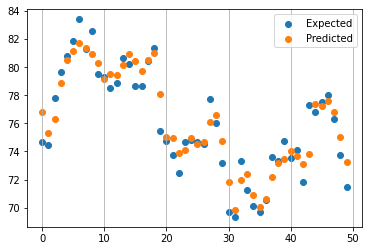

here is predict company  AUDC
MAE: 0.291


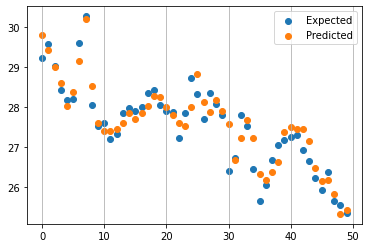

here is predict company  ATVI
MAE: 0.309


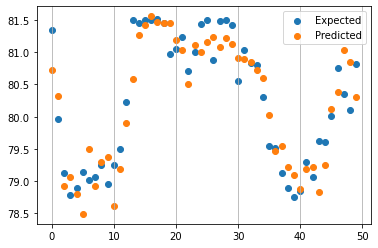

In [ ]:
weekly_xgb1, monthly_xgb1, MAEall_xgb1, preds_xgb1, trueYs_xgb1 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj='reg:squarederror', eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)

here is predict company  MSFT
MAE: 3.542


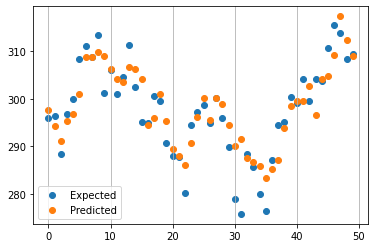

here is predict company  AVGO
MAE: 5.841


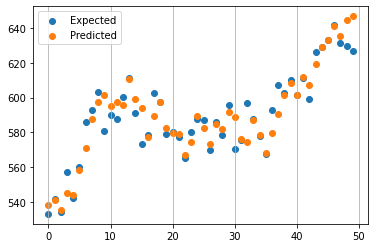

here is predict company  CDW
MAE: 1.910


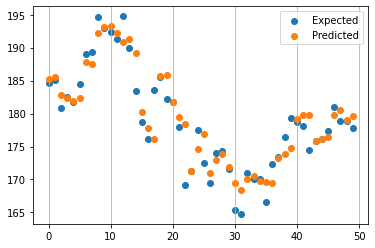

here is predict company  INTU
MAE: 10.904


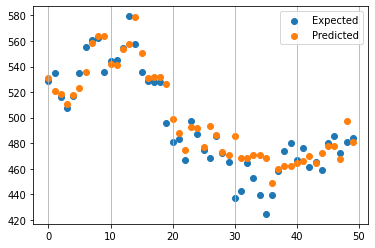

here is predict company  TER
MAE: 2.364


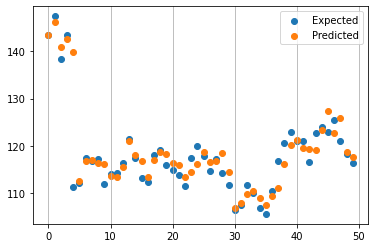

here is predict company  QCOM
MAE: 2.265


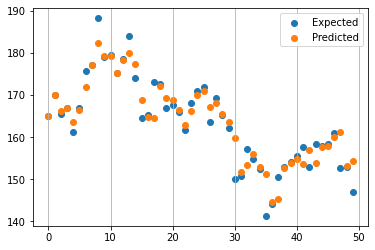

here is predict company  EQIX
MAE: 11.200


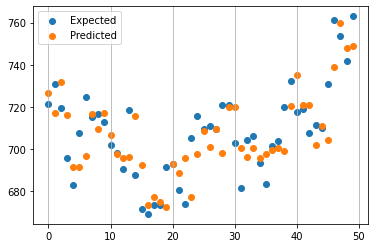

here is predict company  SPNS
MAE: 0.319


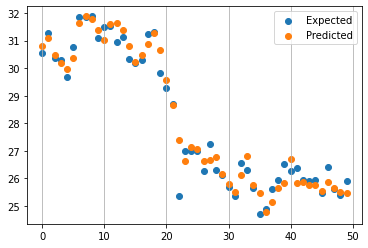

here is predict company  MGIC
MAE: 0.146


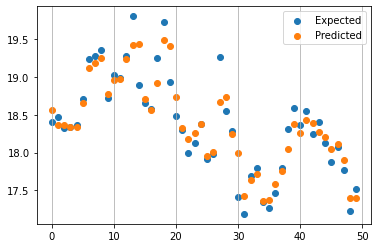

here is predict company  ESLT
MAE: 1.882


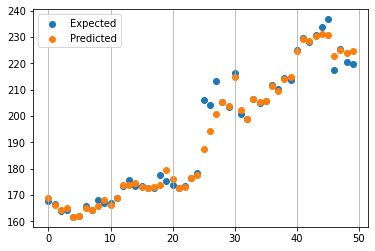

here is predict company  LOGI
MAE: 1.133


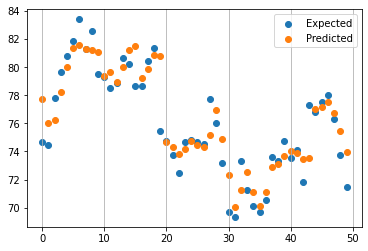

here is predict company  AUDC
MAE: 0.317


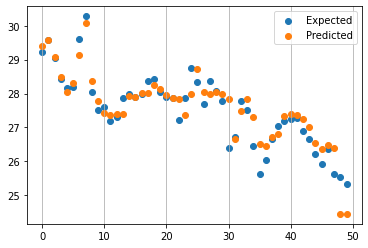

here is predict company  ATVI
MAE: 0.302


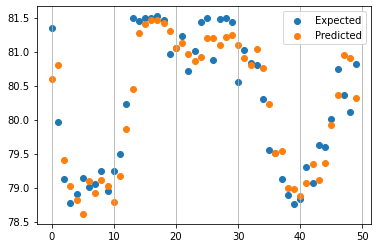

In [ ]:
weekly_xgb2, monthly_xgb2, MAEall_xgb2, preds_xgb2, trueYs_xgb2 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj=fair_obj, eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


here is predict company  MSFT
MAE: 0.091


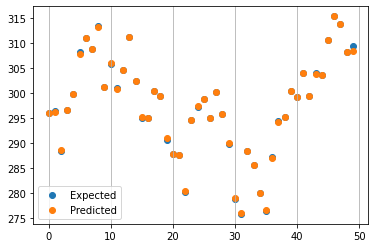

here is predict company  AVGO
MAE: 0.810


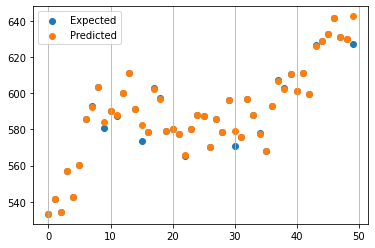

here is predict company  CDW
MAE: 0.049


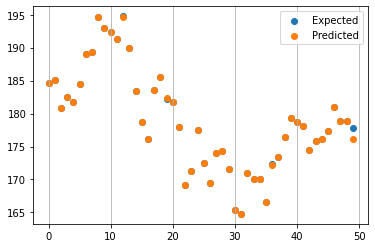

here is predict company  INTU
MAE: 2.509


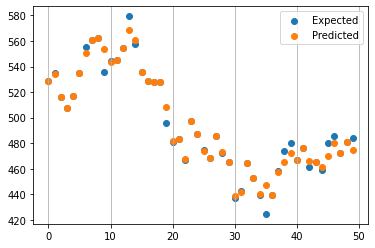

here is predict company  TER
MAE: 0.056


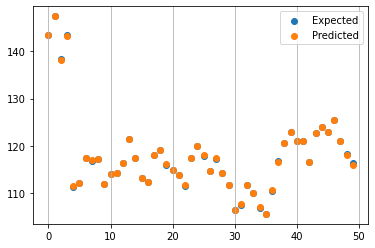

here is predict company  QCOM
MAE: 0.181


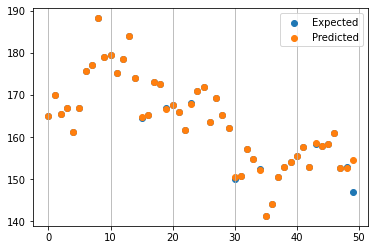

here is predict company  EQIX
MAE: 2.345


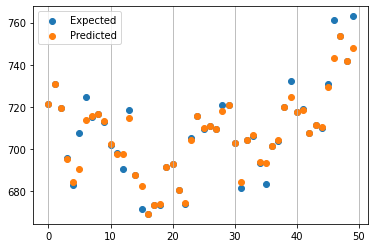

here is predict company  SPNS
MAE: 27.593


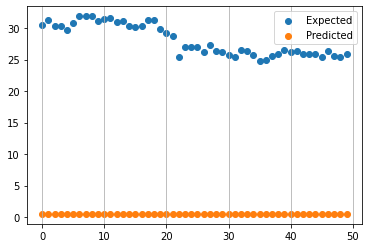

here is predict company  MGIC
MAE: 19.490


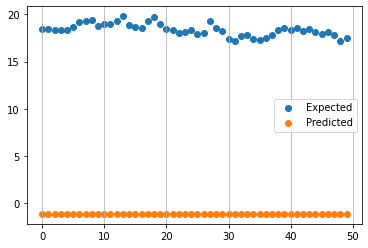

here is predict company  ESLT
MAE: 0.030


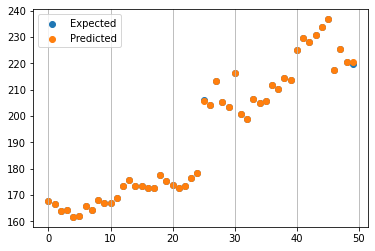

here is predict company  LOGI
MAE: 0.030


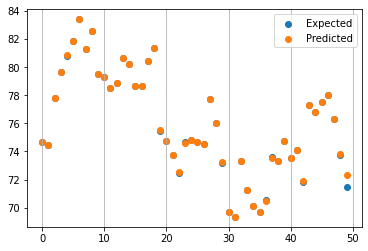

here is predict company  AUDC
MAE: 27.044


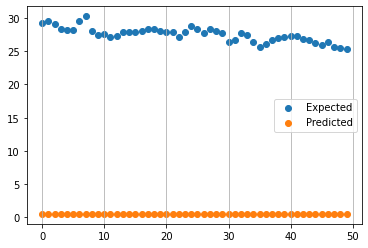

here is predict company  ATVI
MAE: 0.025


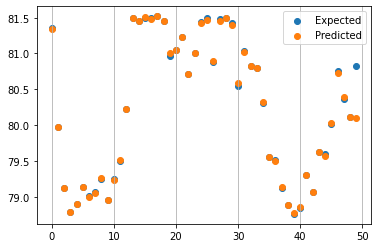

In [ ]:
weekly_xgb3, monthly_xgb3, MAEall_xgb3, preds_xgb3, trueYs_xgb3 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=2300, _nin=15,obj=log_cosh_obj, eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


here is predict company  MSFT
MAE: 3.296


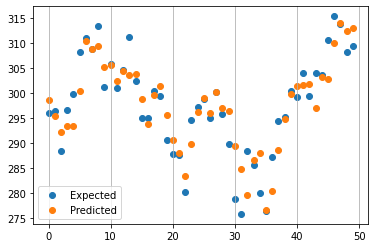

here is predict company  AVGO
MAE: 6.331


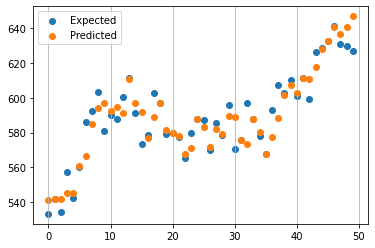

here is predict company  CDW
MAE: 2.081


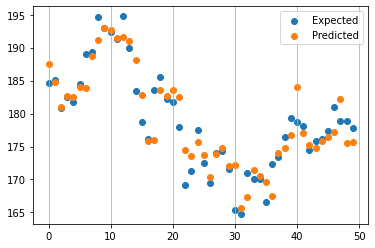

here is predict company  INTU
MAE: 12.350


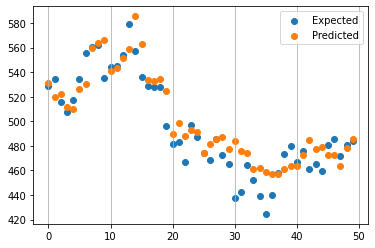

here is predict company  TER
MAE: 2.133


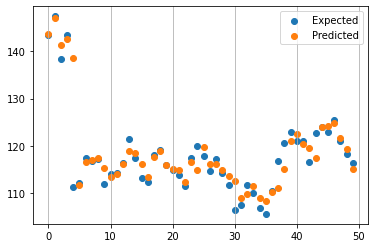

here is predict company  QCOM
MAE: 2.256


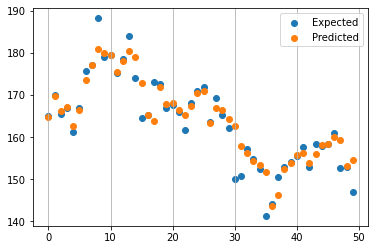

here is predict company  EQIX
MAE: 11.947


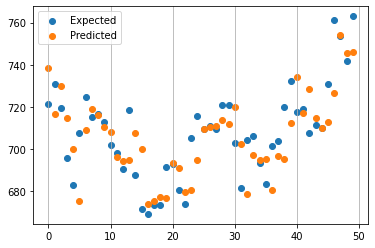

here is predict company  SPNS
MAE: 38.331


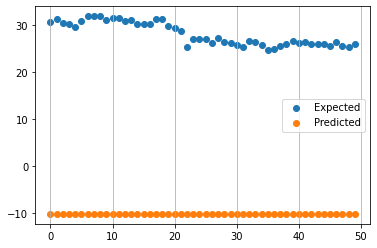

here is predict company  MGIC
MAE: 40.872


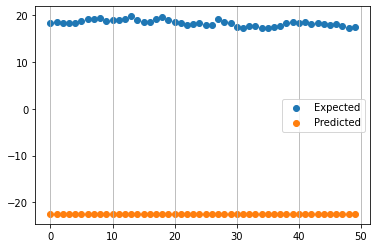

here is predict company  ESLT
MAE: 1.854


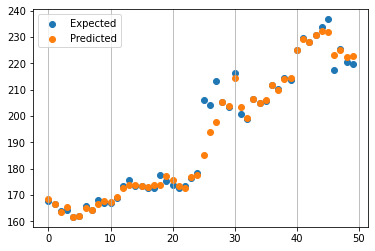

here is predict company  LOGI
MAE: 1.156


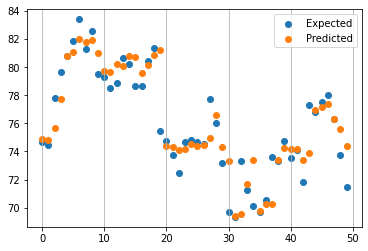

here is predict company  AUDC
MAE: 36.594


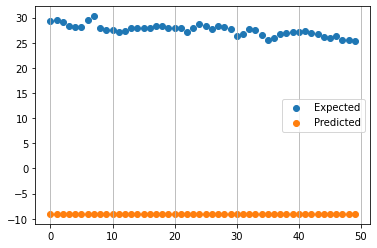

here is predict company  ATVI
MAE: 0.312


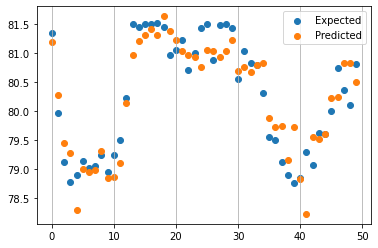

In [ ]:
weekly_xgb4, monthly_xgb4, MAEall_xgb4, preds_xgb4, trueYs_xgb4 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj=huber_approx_obj, eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


In [ ]:
# weekly_xgb5, monthly_xgb5, MAEall_xgb5, preds_xgb5, trueYs_xgb5 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
#                                                                                                   _nestimators=200, _nin=15,obj=huber_loss, eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


 ### LOOK AT THOSE RESULTS--FOR ALL NEW AND OLD

#### store all results

In [ ]:
all_pred ={}
all_true={}
#weekly_xgb3, monthly_xgb3, MAEall_xgb3, preds_xgb3, trueYs_xgb3
print('this is LSTM')
print(weekly_LSTM)
print(monthly_LSTM)
print(trainScore_LSTM)
for i in range(4):
   print('this is the ', i , 'results')
   name1 = 'weekly_xgb'+str(i+1)
   name2 = 'monthly_xgb'+str(i+1)
   name5= 'MAEall_xgb'+str(i+1)
   name3 = 'preds_xgb'+str(i+1)
   name4 = 'trueYs_xgb'+str(i+1)
   print(globals()[name1] )
   print( globals()[name2])
   print(globals()[name5])
   all_pred[str(i)] =  globals()[name3]
   all_true[str(i)] =  globals()[name4]

this is LSTM
[5.387709591528765, -108.46530722066848, -1.688755512368276, -2.5532442027116407, 0.10495056194185458, 1.589107488818453, -3.238287870684088, 0.7755504280929956, -0.018531008826777336, -50.51637245174375, 0.4808267785039438, -0.4193317233540286, 1.1835418507443463]
[7.516404220757726, -88.30562247446318, -1.5468825683858225, -1.0287147492099413, -0.5073619397572147, 2.1940434654131753, -5.465206463151962, 0.7075026914447646, -0.11488688940803292, -35.854557006458144, 0.48494658499220383, -0.513613276583162, 1.3490405915154242]
1.9116087218593139
this is the  0 results
[-1.1485494, 4.93453, 0.6196052, 5.532352, 2.766799, 0.24576654, -4.9914145, -0.14720917, 0.4929903, -50.419765, 0.7541877, 0.2930654, -0.15296596]
[0.69669485, 2.6064634, 0.28016606, 35.84174, 1.5091132, 2.0457606, -4.1776958, -0.004105038, 0.42081302, -36.255314, 0.40609968, 0.14394556, -0.08268003]
[5.1250997, 13.912668, 3.7048435, 28.498663, 5.000867, 5.493028, 13.162784, 0.63733596, 0.53276706, 20.75788,

In [ ]:
all_pred[str(5)] = preds_LSTM
all_true[str(5)] = tureYs_LSTM

import pickle

filehandler = open("preds.pkl","wb")
pickle.dump(all_pred,filehandler)
filehandler.close()
filehandler = open("trueYs.pkl","wb")
pickle.dump(all_true,filehandler)
filehandler.close()

load results back

#### code for load results

In [ ]:
import pickle
file = open("preds.pkl",'rb')
preds_file = pickle.load(file)
file.close()
file = open("trueYs.pkl",'rb')
trueYs_file = pickle.load(file)
file.close()

In [ ]:
preds_lstm, trueY_lstm = preds_file['5'], trueYs_file['5']
preds_xg1, trueY_xg1 = preds_file['0'], trueYs_file['0']
preds_xg2, trueY_xg2 = preds_file['1'], trueYs_file['1']
preds_xg3, trueY_xg3 = preds_file['2'], trueYs_file['2']
preds_xg4, trueY_xg4 = preds_file['3'], trueYs_file['3']

In [ ]:
def draw_figure(preds_, trueY_, data=None):
  for item in preds_.keys():
    x = preds_[item]
    y = data[item]
    xlen = 50
    xis = np.arange(0, xlen, 1)
    print(len(xis))
    print(len(y[-50:]))
    pyplot.plot(xis, y[-50:], label='Expected')
    pyplot.plot(xis, x[-50:], label='Predicted')
    plt.grid(axis = 'x')
    pyplot.legend()
    pyplot.title(item)
    pyplot.show()

#### check the figure

50
50


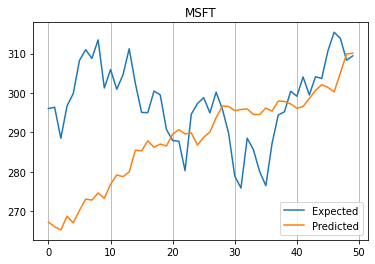

50
50


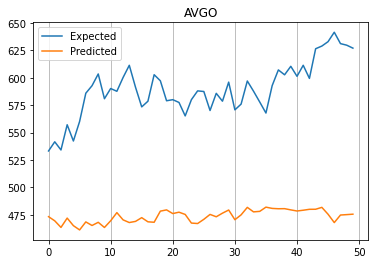

50
50


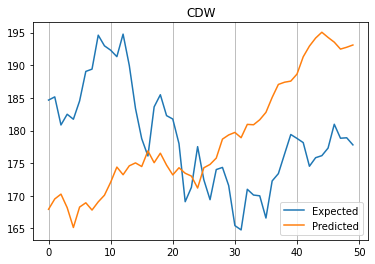

50
50


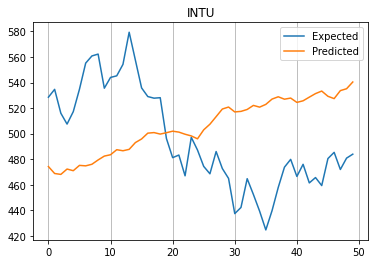

50
50


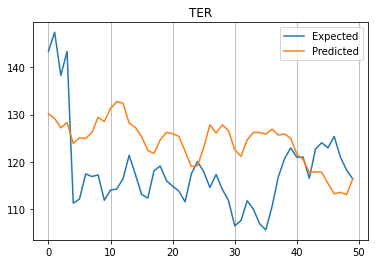

50
50


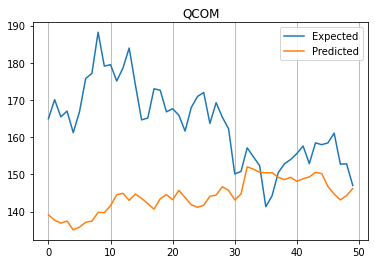

50
50


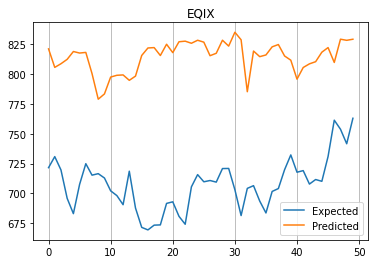

50
50


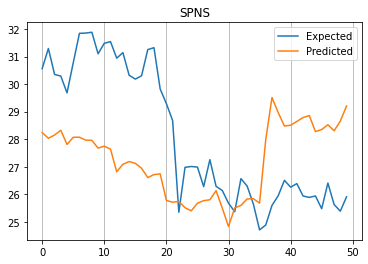

50
50


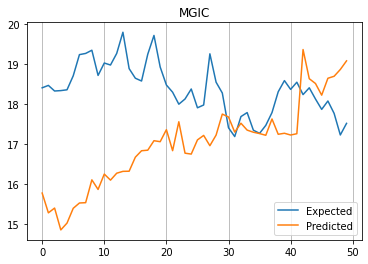

50
50


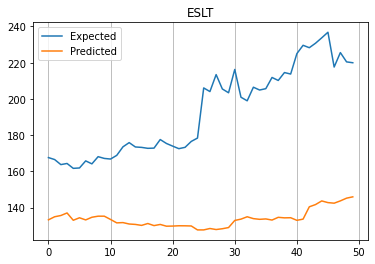

50
50


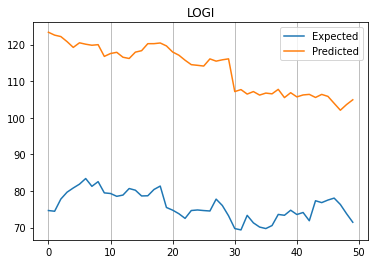

50
50


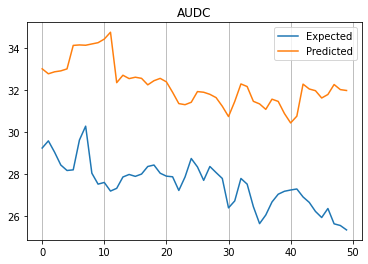

50
50


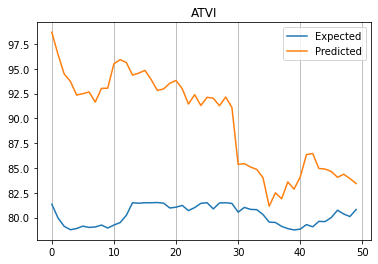

In [ ]:
draw_figure(preds_lstm, trueY_lstm, stock_alphafinance)

50
50


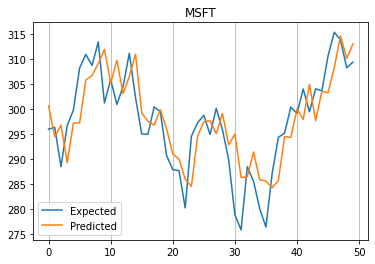

50
50


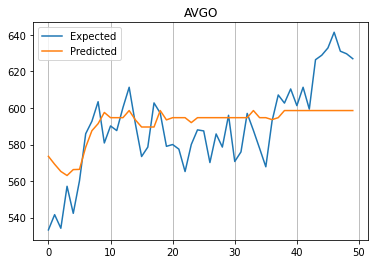

50
50


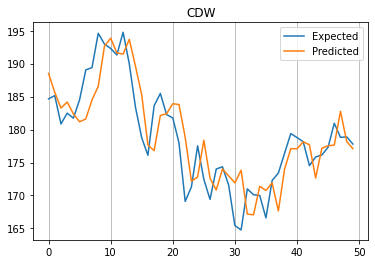

50
50


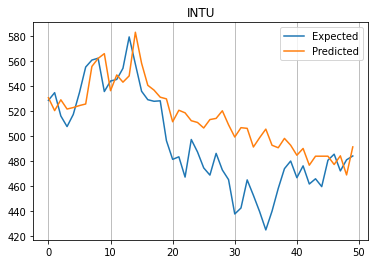

50
50


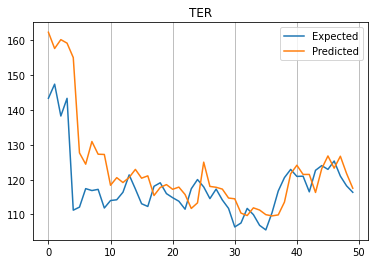

50
50


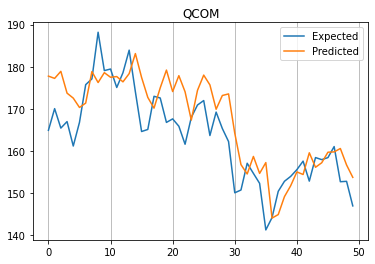

50
50


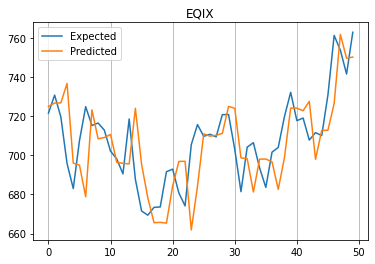

50
50


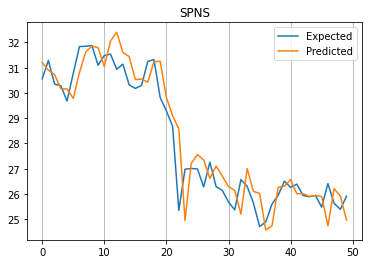

50
50


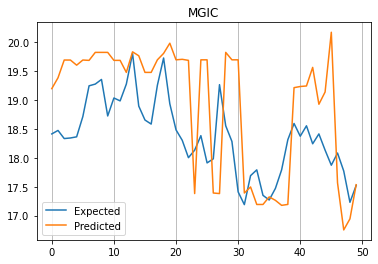

50
50


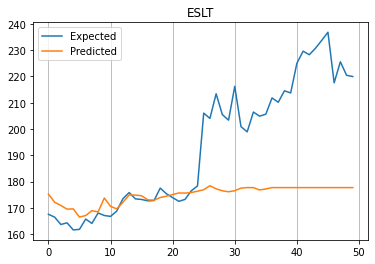

50
50


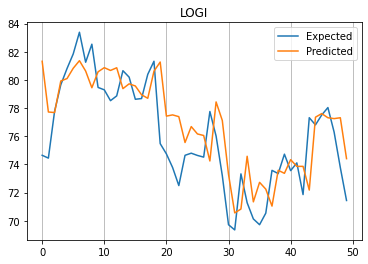

50
50


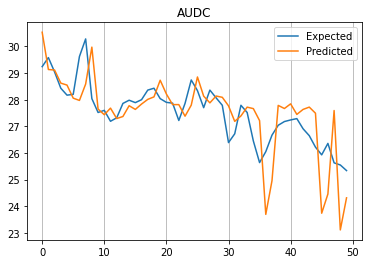

50
50


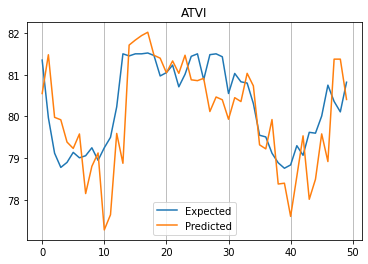

In [ ]:
draw_figure(preds_xg2, trueY_xg2, stock_alphafinance)

draw some figure

### use small estimators

lstm results

Train Score: 5.13 RMSE
Monthly Test Score: 9.85 RMSE
Weekly Test Score: 9.85 RMSE
Weekly Mean Error: 7.52 
Monly Mean Error: 5.39 


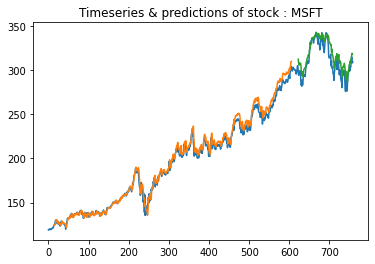

Train Score: 10.44 RMSE
Monthly Test Score: 90.31 RMSE
Weekly Test Score: 90.31 RMSE
Weekly Mean Error: -88.31 
Monly Mean Error: -108.47 


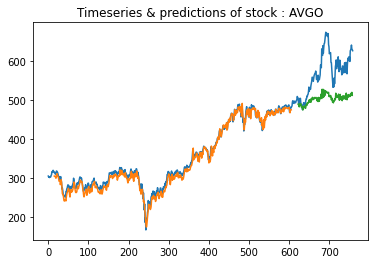

Train Score: 2.86 RMSE
Monthly Test Score: 3.86 RMSE
Weekly Test Score: 3.86 RMSE
Weekly Mean Error: -1.55 
Monly Mean Error: -1.69 


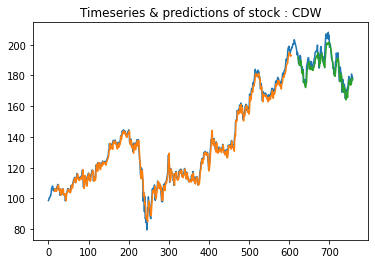

Train Score: 7.32 RMSE
Monthly Test Score: 14.15 RMSE
Weekly Test Score: 14.15 RMSE
Weekly Mean Error: -1.03 
Monly Mean Error: -2.55 


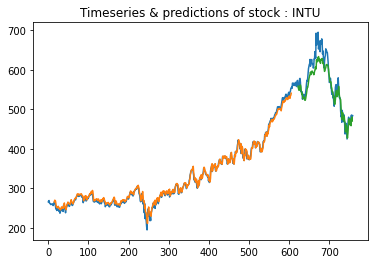

Train Score: 2.67 RMSE
Monthly Test Score: 3.56 RMSE
Weekly Test Score: 3.56 RMSE
Weekly Mean Error: -0.51 
Monly Mean Error: 0.10 


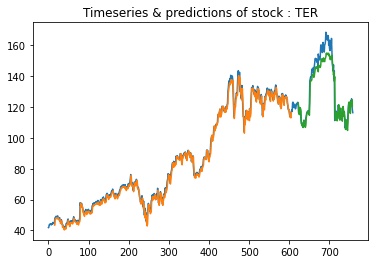

Train Score: 3.00 RMSE
Monthly Test Score: 5.27 RMSE
Weekly Test Score: 5.27 RMSE
Weekly Mean Error: 2.19 
Monly Mean Error: 1.59 


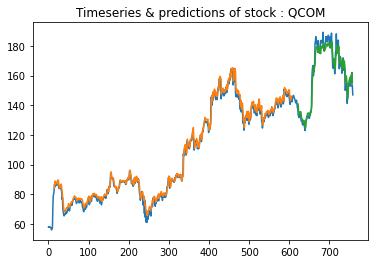

Train Score: 19.69 RMSE
Monthly Test Score: 15.60 RMSE
Weekly Test Score: 15.60 RMSE
Weekly Mean Error: -5.47 
Monly Mean Error: -3.24 


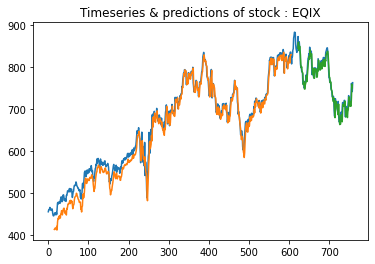

Train Score: 0.81 RMSE
Monthly Test Score: 1.15 RMSE
Weekly Test Score: 1.15 RMSE
Weekly Mean Error: 0.71 
Monly Mean Error: 0.78 


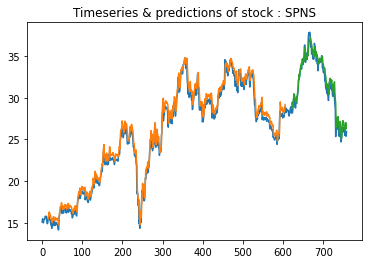

Train Score: 0.31 RMSE
Monthly Test Score: 0.43 RMSE
Weekly Test Score: 0.43 RMSE
Weekly Mean Error: -0.11 
Monly Mean Error: -0.02 


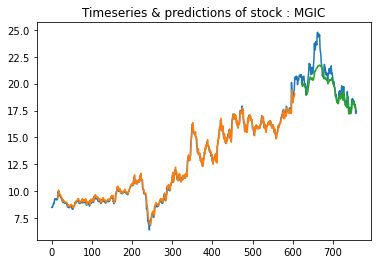

Train Score: 2.87 RMSE
Monthly Test Score: 38.40 RMSE
Weekly Test Score: 38.40 RMSE
Weekly Mean Error: -35.85 
Monly Mean Error: -50.52 


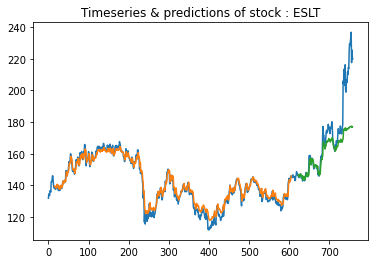

Train Score: 2.83 RMSE
Monthly Test Score: 2.11 RMSE
Weekly Test Score: 2.11 RMSE
Weekly Mean Error: 0.48 
Monly Mean Error: 0.48 


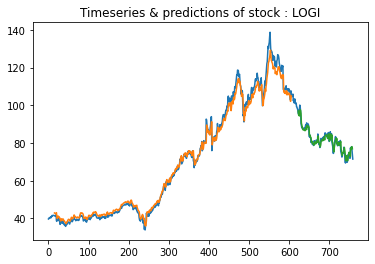

Train Score: 1.04 RMSE
Monthly Test Score: 0.78 RMSE
Weekly Test Score: 0.78 RMSE
Weekly Mean Error: -0.51 
Monly Mean Error: -0.42 


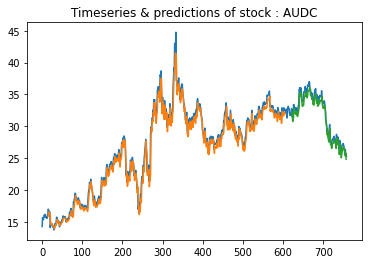

Train Score: 1.91 RMSE
Monthly Test Score: 1.41 RMSE
Weekly Test Score: 1.41 RMSE
Weekly Mean Error: 1.35 
Monly Mean Error: 1.18 


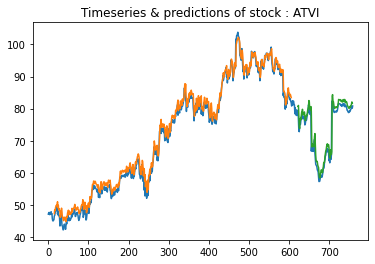

In [ ]:
weekly_LSTM, monthly_LSTM, trainScore_LSTM, preds_LSTM, tureYs_LSTM = predict_weekMonthly_lstm(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited
                                                                                               , test_size_monthly = 27,test_size_weekly = 9, look_back = 15, epoche = 50, batch_size=1)

here is predict company  MSFT
MAE: 5.125


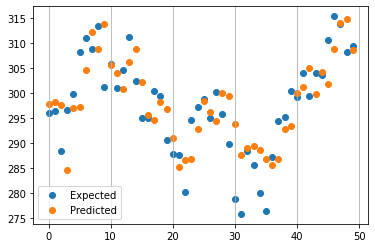

here is predict company  AVGO
MAE: 13.913


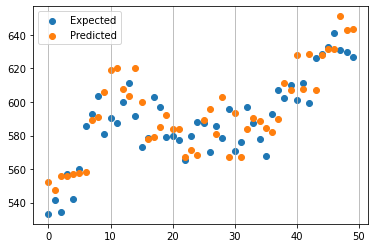

here is predict company  CDW
MAE: 3.705


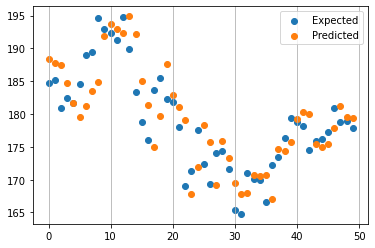

here is predict company  INTU
MAE: 28.499


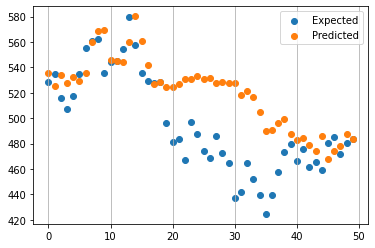

here is predict company  TER
MAE: 5.001


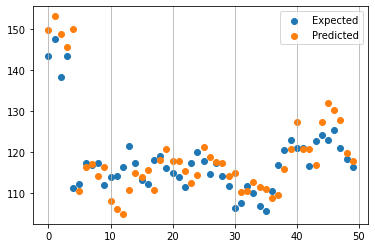

here is predict company  QCOM
MAE: 5.493


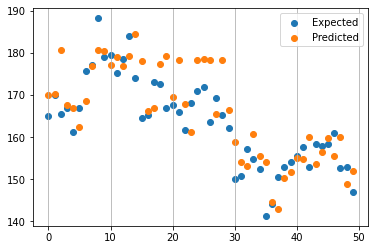

here is predict company  EQIX
MAE: 13.163


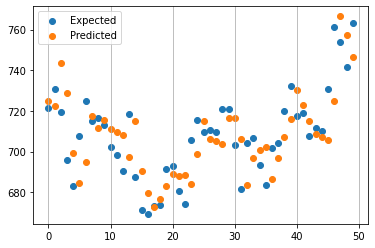

here is predict company  SPNS
MAE: 0.637


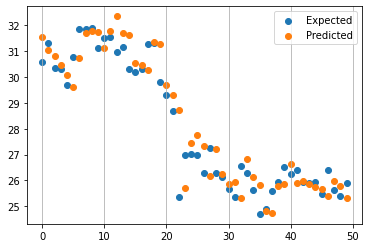

here is predict company  MGIC
MAE: 0.533


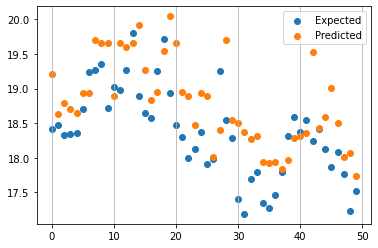

here is predict company  ESLT
MAE: 20.758


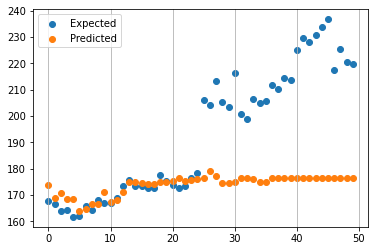

here is predict company  LOGI
MAE: 1.903


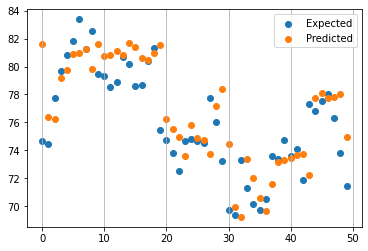

here is predict company  AUDC
MAE: 0.578


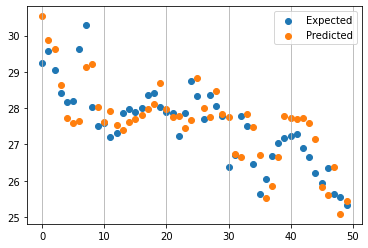

here is predict company  ATVI
MAE: 0.778


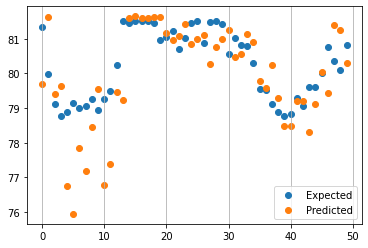

In [ ]:
weekly_xgb1, monthly_xgb1, MAEall_xgb1, preds_xgb1, trueYs_xgb1 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj='reg:squarederror', eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


here is predict company  MSFT
MAE: 4.905


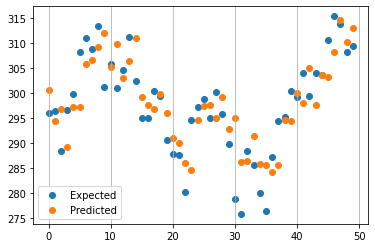

here is predict company  AVGO
MAE: 15.504


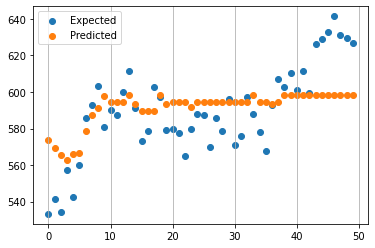

here is predict company  CDW
MAE: 3.213


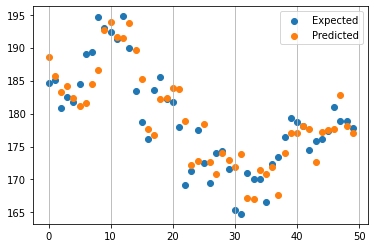

here is predict company  INTU
MAE: 24.768


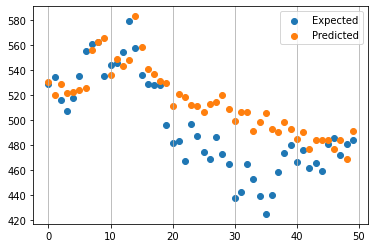

here is predict company  TER
MAE: 6.560


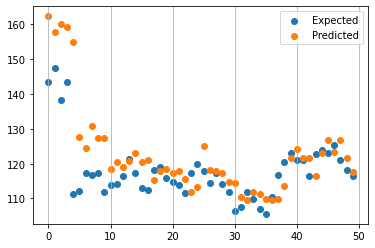

here is predict company  QCOM
MAE: 5.943


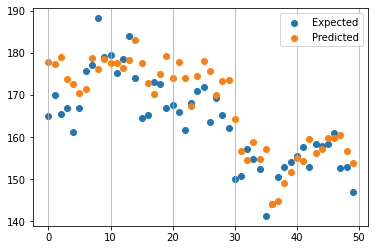

here is predict company  EQIX
MAE: 14.170


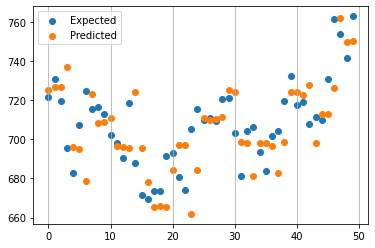

here is predict company  SPNS
MAE: 0.677


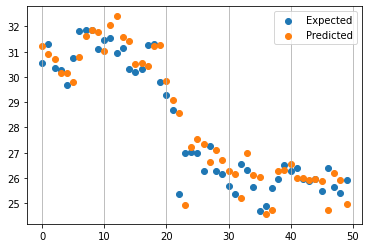

here is predict company  MGIC
MAE: 0.854


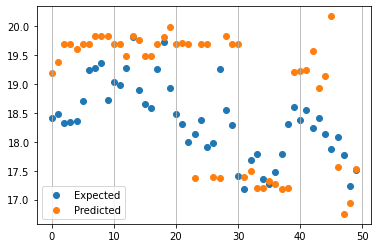

here is predict company  ESLT
MAE: 20.448


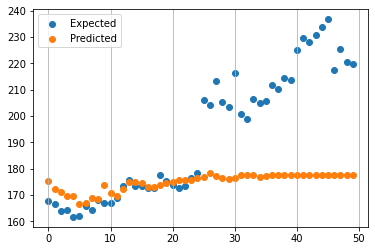

here is predict company  LOGI
MAE: 2.009


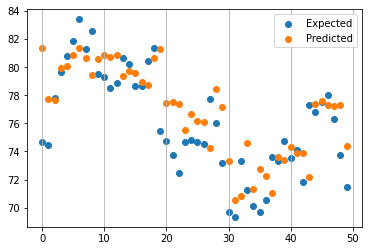

here is predict company  AUDC
MAE: 0.783


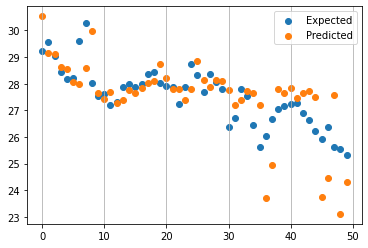

here is predict company  ATVI
MAE: 0.723


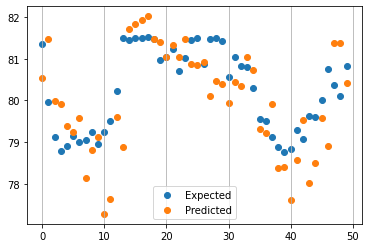

In [ ]:
weekly_xgb2, monthly_xgb2, MAEall_xgb2, preds_xgb2, trueYs_xgb2 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj=fair_obj, eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


here is predict company  MSFT
MAE: 5.508


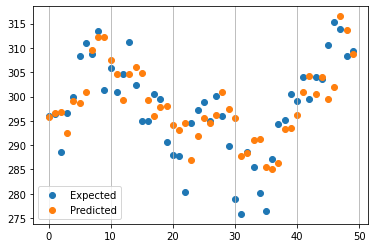

here is predict company  AVGO
MAE: 17.063


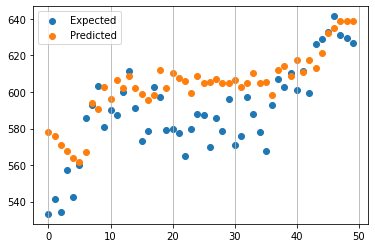

here is predict company  CDW
MAE: 3.549


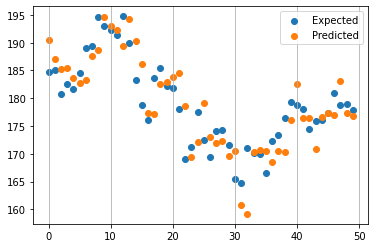

here is predict company  INTU
MAE: 25.932


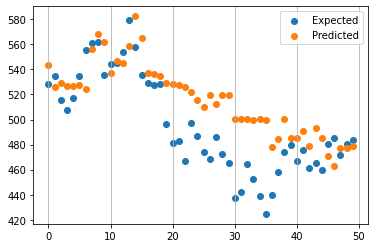

here is predict company  TER
MAE: 6.667


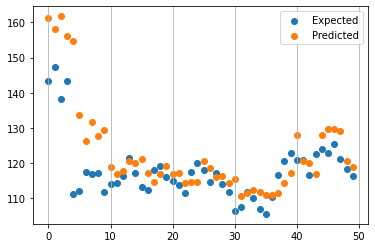

here is predict company  QCOM
MAE: 6.101


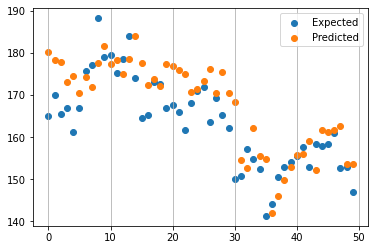

here is predict company  EQIX
MAE: 12.956


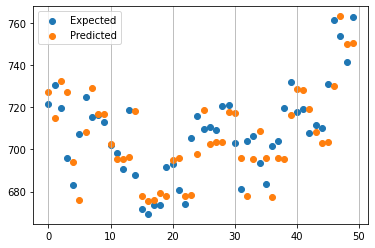

here is predict company  SPNS
MAE: 27.593


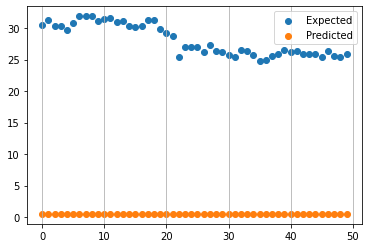

here is predict company  MGIC
MAE: 18.419


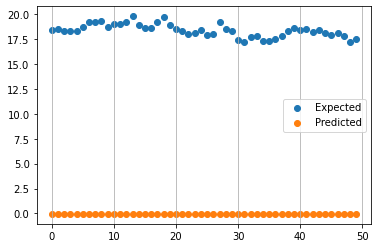

here is predict company  ESLT
MAE: 20.526


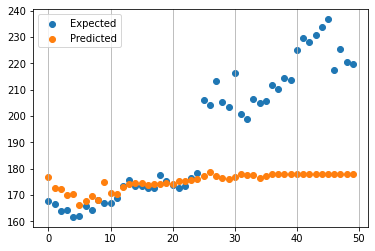

here is predict company  LOGI
MAE: 2.092


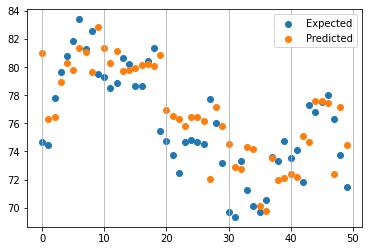

here is predict company  AUDC
MAE: 27.044


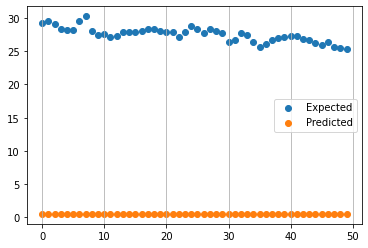

here is predict company  ATVI
MAE: 1.011


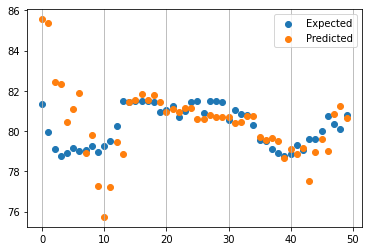

In [ ]:
weekly_xgb3, monthly_xgb3, MAEall_xgb3, preds_xgb3, trueYs_xgb3 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj=log_cosh_obj, eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


here is predict company  MSFT
MAE: 5.520


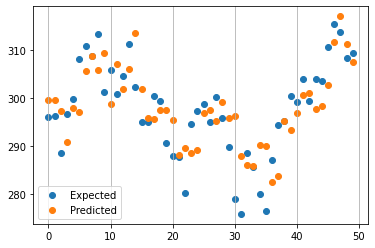

here is predict company  AVGO
MAE: 17.361


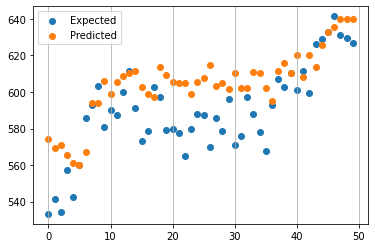

here is predict company  CDW
MAE: 3.212


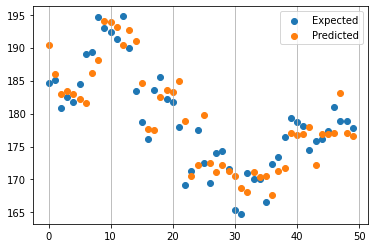

here is predict company  INTU
MAE: 21.957


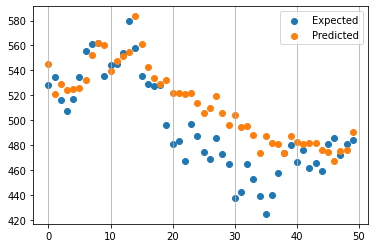

here is predict company  TER
MAE: 6.471


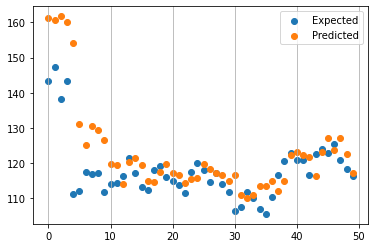

here is predict company  QCOM
MAE: 5.996


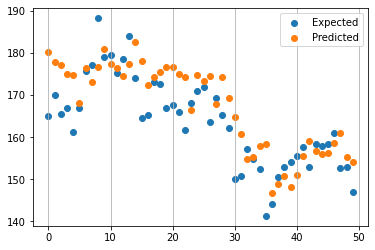

here is predict company  EQIX
MAE: 14.699


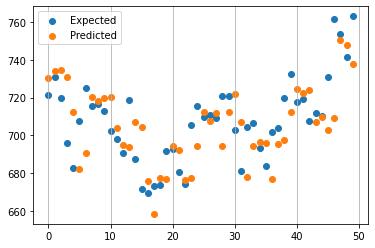

here is predict company  SPNS
MAE: 35.889


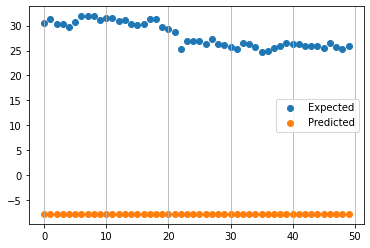

here is predict company  MGIC
MAE: 38.582


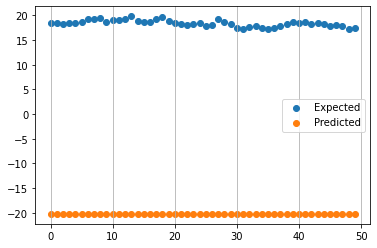

here is predict company  ESLT
MAE: 20.980


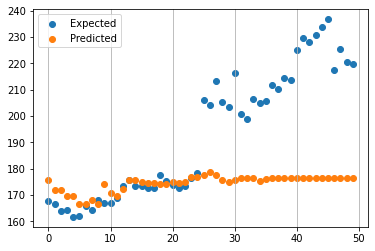

here is predict company  LOGI
MAE: 2.209


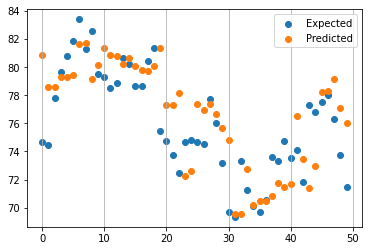

here is predict company  AUDC
MAE: 34.059


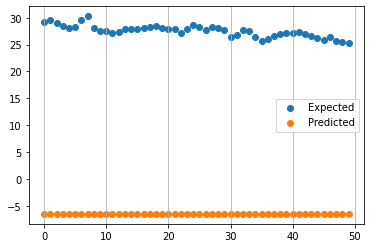

here is predict company  ATVI
MAE: 0.862


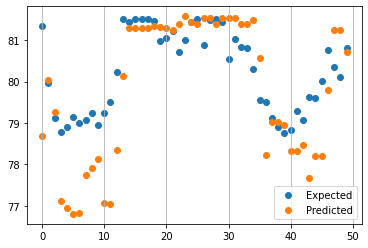

In [ ]:
weekly_xgb4, monthly_xgb4, MAEall_xgb4, preds_xgb4, trueYs_xgb4 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj=huber_approx_obj, eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


### calculate the DTW distance of measure
[source link](https://dtaidistance.readthedocs.io/en/latest/usage/dtw.html)

##### code of measure

In [ ]:
pip install dtaidistance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 538 kB 6.2 MB/s 


In [ ]:
from dtaidistance import dtw_visualisation as dtwvis
import numpy as np
from dtaidistance import dtw

In [ ]:
def style_negative(v, props=''):
    return props if v < 10 else None
def colordataframe(dfdata):
    s2 = dfdata.style.applymap(style_negative, props='color:red;')\
              .applymap(lambda v: 'opacity: 20%;' if (v < 20) and (v > 0) else None)
    return s2

In [ ]:
def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
def highlightdf(df):
    s2 =df.apply(highlight_max, props='color:white;background-color:darkblue', axis=0)
    return s2

In [ ]:
def dtw_distance_cal(data, preds_):
  dist = np.zeros(len(preds_.keys()))
  i = 0
  # print(dist)
  for item in preds_.keys():
    x = preds_[item][-50:]
    y = data[item][-50:]
    s1 = np.array(x)
    s2 = np.array(y)
    # print(len(x))
    # print(len(y))
    distance = dtw.distance(s1, s2)
    dist[i] = distance
    i =i+1
    #print(distance)
  return dist
def dtw_distance_draw(data, preds_, draw=True, winws=10):
  for item in preds_.keys():
    x = preds_[item][-50:]
    y = data[item][-50:]
    s1 = np.array(x)
    s2 = np.array(y)
    distance = dtw.distance(s1, s2, window=winws)
    path = dtw.warping_path(s1, s2, window=winws)
    #dtwvis.plot_warping(s1, s2, path, filename="warp.png")
    if draw == True:
      print('this is for ', item)
      dtwvis.plot_warping(s1, s2, path)
      plt.show()


In [ ]:
def make_pretty(styler):
    styler.set_caption("DTW distance vis")
    styler.background_gradient(axis=None, vmin=0.1, vmax=60, cmap="YlGnBu")
    return styler

In [ ]:
def dtw_distance_draw_lstm(data, preds_, draw=True, winws=10):
  for item in preds_.keys():
    # print(preds_[item])
    x = preds_[item][-50:]
    # print(x)
    # print(x.shape)
    y = data[item][-50:]
    b = np.squeeze(x, axis=1)
    s1 = np.array(b,dtype='float64')
    s2 = np.array(y)
    # print(s1.shape)
    # break
    distance = dtw.distance(s1, s2, window=winws)
    # print(distance)
    path = dtw.warping_path(s1, s2, window=winws)
    #dtwvis.plot_warping(s1, s2, path, filename="warp.png")
    if draw == True:
      print('this is for ', item)
      dtwvis.plot_warping(s1, s2, path)
      plt.show()

##### figures and distances

In [ ]:
# dist_lstm = dtw_distance_cal(stock_alphafinance, preds_lstm)#preds_lstm
print(dist_lstm)
# dtw_distance_draw_lstm(stock_alphafinance, preds_lstm, draw=True)

NameError: ignored

In [ ]:
dist1 = dtw_distance_cal(stock_alphafinance, preds_xg1)
print(dist1)
dtw_distance_draw(stock_alphafinance, preds_xg1, draw=True)


In [ ]:
dist2 = dtw_distance_cal(stock_alphafinance, preds_xg2)
print(dist2)
dtw_distance_draw(stock_alphafinance, preds_xg2, draw=True)

In [ ]:
dist3 = dtw_distance_cal(stock_alphafinance, preds_xg3)
dtw_distance_draw(stock_alphafinance, preds_xg3, draw=True)
print(dist3)

In [ ]:
dist4 = dtw_distance_cal(stock_alphafinance, preds_xg4)

In [ ]:
print(dist_lstm)
print(dist1)
print(dist_lstm.shape)
print(type(dist1))

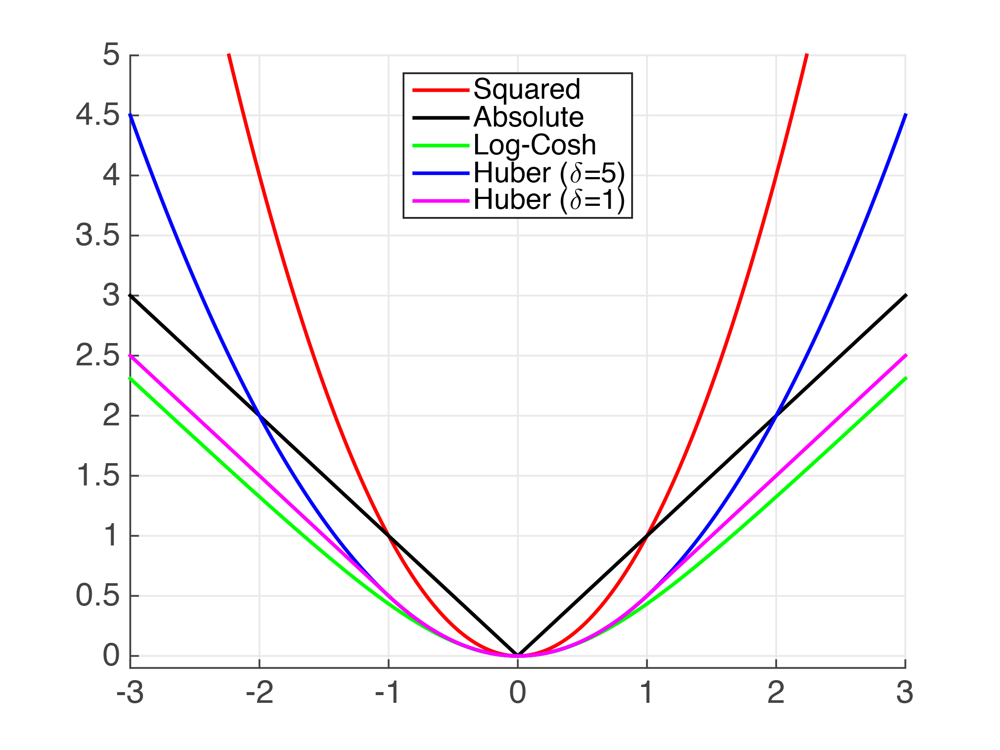

In [ ]:
d_dist=np.concatenate((dist_lstm.reshape(1, 13), dist1.reshape(1, 13), dist2.reshape(1, 13),
                       dist3.reshape(1, 13), dist4.reshape(1, 13)), axis=0)
print(d_dist.shape)
df = pd.DataFrame(d_dist, columns =stocks_alphafinance_edited.index)
df.head(5)


In [ ]:
df.style.pipe(make_pretty)

In [ ]:
s2=colordataframe(df)
s2


In [ ]:
highlightdf(s2)

## for yahoo_finance data

## define objective function for xgbRegressor

[why we use huber loss to replace absolute ERROR](https://stackoverflow.com/questions/45006341/xgboost-how-to-use-mae-as-objective-function) [and this](https://intellipaat.com/community/14845/xgboost-how-to-use-mae-as-objective-function)\
[custom objective function code](https://stackoverflow.com/questions/59683944/creating-a-custom-objective-function-in-for-xgboost-xgbregressor)\
[various top loss function from competition](https://stackoverflow.com/questions/45006341/xgboost-how-to-use-mae-as-objective-function)\
[and here all calculate functions](https://towardsdatascience.com/understanding-the-3-most-common-loss-functions-for-machine-learning-regression-23e0ef3e14d3)\
[Chinese version explain](https://blog.csdn.net/wj1066/article/details/78816177)


## combination DTW and models.(measure)

#### code of new lossfunc

In [ ]:
def dtw_distance_pred(data, preds_):
  s1 = np.array(preds_)
  s2 = np.array(data)
  mxv1 = max(s1)
  miv1 = min(s1)
  mxv2 = max(s2)
  miv2 = min(s2)
  mx = mxv1 if mxv1 > mxv2 else mxv2
  mi = miv1 if miv1 < miv2 else miv2
  x = (np.array(s1)-mi)/(mx-mi)
  y= (np.array(s2)-mi)/(mx-mi)
  distance = dtw.distance(x, y)/len(data)
  return distance*0.01

In [ ]:
def EVALFAIL(preds, dtrain):
    """y = c * abs(x) - c**2 * np.log(abs(x)/c + 1)"""
    x = preds - dtrain.get_labels()
    y = c * abs(x) - c**2 * np.log(abs(x)/c + 1)
    dist = dtw_distance_pred(dtrain, preds)*0.1
    return 'pyEVALFAIL', dist+y

In [ ]:
import warnings
warnings.filterwarnings("ignore")  # don't spam the notebook with warnings
def huber_approx_obj_dtw(preds, dtrain):
    d = dtrain - preds
    h = 1  #h is delta in the graphic
    scale = 1 + (d / h) ** 2
    scale_sqrt = np.sqrt(scale)
    grad = d / scale_sqrt
    hess = 1 / scale / scale_sqrt
    dist = dtw_distance_pred(dtrain, preds)
    return grad+dist, hess

def huber_loss_dtw(y_pred, y, delta=1.0):
    huber_mse = 0.5*(y-y_pred)**2
    huber_mae = delta * (np.abs(y - y_pred) - 0.5 * delta)
    return np.where(np.abs(y - y_pred) <= delta, huber_mse, huber_mae)

def fair_obj_dtw(preds, dtrain):
    """y = c * abs(x) - c**2 * np.log(abs(x)/c + 1)"""
    x = dtrain-preds
    c = 1
    den = abs(x) + c
    grad = c*x / den
    hess = c*c / den ** 2
    # print(len(preds))
    dist = dtw_distance_pred(dtrain[:-50], preds[:-50])
    # print('dis ', dist, ' grad ', grad)

    return grad-dist, hess

def log_cosh_obj_dtw(preds, dtrain):
    # x = preds - dtrain.get_labels()
    x = dtrain-preds
    grad = np.tanh(x)
    hess = 1 / np.cosh(x)**2
    dist = dtw_distance_pred(dtrain, preds)
    return grad+dist, hess

### for get the results
for those [how to use set functions](https://xgboost.readthedocs.io/en/stable/tutorials/custom_metric_obj.html)\
and for whole [reference](https://xgboost.readthedocs.io/en/stable/python/examples/custom_rmsle.html#sphx-glr-python-examples-custom-rmsle-py)

In [ ]:
weekly_xgb2, monthly_xgb2, MAEall_xgb2, preds_xgb2, trueYs_xgb2 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15, obj=fair_obj_dtw,  n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


In [ ]:
weekly_xgb1, monthly_xgb1, MAEall_xgb1, preds_xgb1, trueYs_xgb1 = predict_weekMonthly_byXGB_mixed(stocks_alphafinance_edited.index, stock_alphafinance, stocks_alphafinance_edited,
                                                                                                  _nestimators=200, _nin=15,obj='reg:squarederror', eval =None, n_tests =50, test_size_monthly = 27, test_size_weekly = 9)


## use DTW FOR measure how/why
[explaination here](https://github.com/brechtlaperre/DTW_measure)\
and [source code](https://www.frontiersin.org/articles/10.3389/fspas.2020.00039/full)\

except this there is a DTW with MLflow
[source link](https://databricks.com/blog/2019/04/30/using-dynamic-time-warping-and-mlflow-to-detect-sales-trends.html)\
but this file is [DBC format notebook](https://docs.databricks.com/notebooks/notebooks-manage.html), difficult use, so [use this](https://davewentzel.com/content/ConvertDatabricksDBCtoipynb/)

#### check the results

##### code

In [ ]:
def draw_figure_compare4(preds0_, preds1_,preds2_,preds3_, data=None):
  import matplotlib.pyplot as plt
  for item in preds0_.keys():
    x0 = preds0_[item]
    x1 = preds1_[item]
    x2 = preds2_[item]
    x3 = preds3_[item]
    y = data[item]
    xlen = 50
    from matplotlib.pyplot import figure
    figure(figsize=(20, 8), dpi=40)
    xis = np.arange(0, xlen, 1)
    plt.subplot(1, 4, 1)
    plt.plot(xis, x0[-50:], 'ro', xis, y[-50:], 'ko')
    plt.subplot(1, 4, 2)
    plt.plot(xis, x1[-50:], 'ro', xis, y[-50:], 'ko')
    plt.subplot(1, 4, 3)
    plt.plot(xis, x2[-50:], 'ro', xis, y[-50:], 'ko')
    plt.subplot(1, 4, 4)
    plt.plot(xis, x3[-50:], 'ro', xis, y[-50:], 'ko')
    plt.tight_layout()
    plt.show()

In [ ]:
def read_data( file = 'org1.pkl'):
	import pickle
	txtfile = open(file, 'rb')
	resu = pickle.load(txtfile)
	txtfile.close()
	weekly_xgb2 = resu['weekly_xgb0']
	monthly_xgb2 = resu['monthly_xgb0']
	MAEall_xgb2 = resu['MAEall_xgb0']
	preds_xgb2 = resu['preds_xgb0']
	trueYs_xgb2 = resu['trueYs_xgb0']
	return weekly_xgb2, monthly_xgb2, MAEall_xgb2, preds_xgb2, trueYs_xgb2

In [ ]:
def draw_figure(preds_, trueY_, data=None):
  for item in preds_.keys():
    x = preds_[item]
    y = data[item]
    xlen = 50
    xis = np.arange(0, xlen, 1)
    print(len(xis))
    print(len(y[-50:]))
    pyplot.plot(xis, y[-50:], label='Expected')
    pyplot.plot(xis, x[-50:], label='Predicted')
    plt.grid(axis = 'x')
    pyplot.legend()
    pyplot.title(item)
    pyplot.show()

In [ ]:
def square_MAE(preds_, data=None, xlen = 50):
  NAE =[]
  for item in preds_.keys():
    x = preds_[item].squeeze()
    y = data[item]
    mae = np.square(x[-xlen:]-y[-xlen:])
    mae = np.sum(mae, axis = 0)
    NAE.append(mae)
  return NAE

def draw_figure_compare(preds_, preds1_, data=None):
  import matplotlib.pyplot as plt
  for item in preds_.keys():
    x = preds_[item]
    z= preds1_[item]
    y = data[item]
    xlen = 50
    xis = np.arange(0, xlen, 1)
    print(len(xis))
    print(len(y[-50:]))
    plt.subplot(1, 2, 1)
    # plt.plot(xis, y[-50:], label='Expected')
    # plt.plot(xis, x[-50:], label='Predicted')
    plt.plot(xis, x[-50:], 'ro', xis, y[-50:], 'ko')
    # plt.grid(axis = 'x')
    # plt.legend()
    # plt.title(item)

    plt.subplot(1, 2, 2)
    # plt.plot(xis, y[-50:], label='Expected')
    # plt.plot(xis, z[-50:], label='Predicted')
    plt.plot(xis, z[-50:], 'ro', xis, y[-50:], 'ko')
    # plt.grid(axis = 'z')
    # plt.legend()
    # plt.title(item)
    plt.tight_layout()
    plt.show()

In [ ]:
def style_negative(v, props=''):
    return props if v < 10 else None
def colordataframe(dfdata):
    s2 = dfdata.style.applymap(style_negative, props='color:red;')\
              .applymap(lambda v: 'opacity: 20%;' if (v < 20) and (v > 0) else None)
    return s2

In [ ]:
def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
def highlightdf(df):
    s2 =df.apply(highlight_max, props='color:white;background-color:darkblue', axis=0)
    return s2

In [ ]:
def dtw_distance_cal(data, preds_):
  dist = np.zeros(len(preds_.keys()))
  i = 0
  # print(dist)
  for item in preds_.keys():
    x = preds_[item][-50:]
    y = data[item][-50:]
    s1 = np.array(x)
    s2 = np.array(y)
    # print(len(x))
    # print(len(y))
    distance = dtw.distance(s1, s2)
    dist[i] = distance
    i =i+1
    #print(distance)
  return dist
def dtw_distance_draw(data, preds_, draw=True, winws=10):
  for item in preds_.keys():
    x = preds_[item][-50:]
    y = data[item][-50:]
    s1 = np.array(x)
    s2 = np.array(y)
    distance = dtw.distance(s1, s2, window=winws)
    path = dtw.warping_path(s1, s2, window=winws)
    #dtwvis.plot_warping(s1, s2, path, filename="warp.png")
    if draw == True:
      print('this is for ', item)
      dtwvis.plot_warping(s1, s2, path)
      plt.show()
def make_pretty(styler):
    styler.set_caption("DTW distance vis")
    styler.background_gradient(axis=None, vmin=0.1, vmax=60, cmap="YlGnBu")
    return styler
def dtw_distance_draw_lstm(data, preds_, draw=True, winws=10):
  for item in preds_.keys():
    # print(preds_[item])
    x = preds_[item][-50:]
    # print(x)
    # print(x.shape)
    y = data[item][-50:]
    b = np.squeeze(x, axis=1)
    s1 = np.array(b,dtype='float64')
    s2 = np.array(y)
    # print(s1.shape)
    # break
    distance = dtw.distance(s1, s2, window=winws)
    # print(distance)
    path = dtw.warping_path(s1, s2, window=winws)
    #dtwvis.plot_warping(s1, s2, path, filename="warp.png")
    if draw == True:
      print('this is for ', item)
      dtwvis.plot_warping(s1, s2, path)
      plt.show()

##### run the results--for single-no

In [ ]:
weekly_xgb0, monthly_xgb0, MAEall_xgb0, preds_xgb0, trueYs_xgb0 = read_data(file='orglstm.pkl')
weekly_xgb1, monthly_xgb1, MAEall_xgb1, preds_xgb1, trueYs_xgb1 = read_data(file='orgsquare.pkl')
weekly_xgb2, monthly_xgb2, MAEall_xgb2, preds_xgb2, trueYs_xgb2 = read_data(file='org_mins.pkl')# server
weekly_xgb3, monthly_xgb3, MAEall_xgb3, preds_xgb3, trueYs_xgb3 = read_data(file='org_add.pkl') # server


In [ ]:
maesquare = square_MAE(preds_xgb1, data=stock_alphafinance)
maelstm = square_MAE(preds_xgb0, data=stock_alphafinance)
maesmins = square_MAE(preds_xgb2, data=stock_alphafinance)
maeplus = square_MAE(preds_xgb3, data=stock_alphafinance)

In [ ]:
dist0 = dtw_distance_cal(stock_alphafinance, preds_xgb0)
dist2 = dtw_distance_cal(stock_alphafinance, preds_xgb1)
dist3 = dtw_distance_cal(stock_alphafinance, preds_xgb2)
dist4 = dtw_distance_cal(stock_alphafinance, preds_xgb3)

In [ ]:
# d_mae=np.concatenate(( np.array(maelstm).reshape(1, com_num), np.array(maesquare).reshape(1, com_num),\
#                       np.array(maesmins).reshape(1, com_num)), axis=0)
d_mae=np.concatenate(( np.array(maelstm).reshape(1, com_num),  np.array(maesquare).reshape(1, com_num), \
                        np.array(maesmins).reshape(1, com_num) ,  np.array(maeplus).reshape(1, com_num)), axis=0)
print(d_mae.shape)
df_mae = pd.DataFrame(d_mae, columns =stocks_alphafinance_edited.index[:com_num])

(4, 13)


In [ ]:
com_num = 13
d_dist=np.concatenate(( dist0.reshape(1, com_num), dist2.reshape(1, com_num), \
                       dist3.reshape(1, com_num) , dist4.reshape(1, com_num)), axis=0)
print(d_dist.shape)
df_dist = pd.DataFrame(d_dist, columns =stocks_alphafinance_edited.index[:com_num])

(4, 13)


##### uniform analysis data code

In [ ]:
dataname =['orglstm.pkl', 'orgsquare.pkl', 'org_mins.pkl', 'org_add.pkl', 'org_mins_100.pkl', 'org_add_100.pkl'\
           , 'org_mins_low_100.pkl', 'org_add_low_100.pkl', 'org_mins_200.pkl', 'org_add_200.pkl'\
           , 'org_mins_low_200.pkl', 'org_add_low_200.pkl', 'org_mins_half_100.pkl', 'org_add_half_100.pkl']
maename = ['lstm', 'square', 'min', 'add', 'min_100', 'add_100', 'min_low_100',
           'add_low_100', 'min_200', 'add_200', 'min_low_200', 'add_low_200', 'min_half_100', 'add_half_100']


In [ ]:
dataname =['orglstm.pkl', 'orgsquare.pkl', 'org_mins.pkl', 'org_add.pkl',\
           'org_fl_mins__100.pkl', 'org_fl_mins__200.pkl',
           'org_fl_mins_one__100.pkl', 'org_fl_mins_one__200.pkl',
            'org_fl_plus__100.pkl', 'org_fl_plus__200.pkl',
           'org_fl_plus_one__100.pkl', 'org_fl_plus_one__200.pkl',
           'org_loc_mins_one_100.pkl', 'org_lco_plus_one_100.pkl',
           'org_sl_mins_100.pkl', 'org_sl_plus_100.pkl',
           'org_sl_mins_01__100.pkl',
            'org_sl_mins_200.pkl', 'org_sl_plus_200.pkl',
           'org_sl_mins_01__200.pkl', 'org_sl_plus_01__200.pkl',
           'org_sl_org__100.pkl', 'org_sl_org__200.pkl', 'org_loc_org_100.pkl', 'org_fl_org__100.pkl']

maename =['lstm', 'square', 'mins', 'add',\
           'fl_mins_100', 'fl_mins_200',
           'fl_mins_one_100', 'fl_mins_one_200',
            'fl_plus_100', 'fl_plus_200',
           'fl_plus_one_100', 'fl_plus_one_200',
           'loc_mins_one_100', 'lco_plus_one_100',
           'sl_mins_100', 'sl_plus_100',
           'sl_mins_01_100',
            'sl_mins_200', 'sl_plus_200',
           'sl_mins_01_200', 'sl_plus_01_200',
           'sl_org_100', 'sl_org_200', 'loc_org_100', 'fl_org_100']

In [ ]:
for run in range( len(dataname)):
   var= 'preds_xgb'+ str(run)
   weekly_xgb, monthly_xgb, MAEall_xgb, preds_xgb, trueYs_xgb = read_data(file=dataname[run])
   globals()[var] = preds_xgb

In [ ]:
for run in range( len(maename)):
   var= 'mae'+ maename[run]
   varn= 'preds_xgb'+ str(run)
   mae = square_MAE(globals()[varn], data=stock_alphafinance)
   globals()[var] = mae

In [ ]:
for run in range( len(maename)):
   var= 'dist'+ maename[run]
   varn= 'preds_xgb'+ str(run)
   dist = dtw_distance_cal(stock_alphafinance, globals()[varn])
   globals()[var] = dist

In [ ]:
len(maename)

25

In [ ]:
globals()['maelstm']

In [ ]:
com_num = 13

d_mae=np.concatenate(( np.reshape(globals()['maelstm'], (1, com_num)).T ), axis=0)
# print(d_mae)
for run in range( len(maename)):
  var= 'mae'+ maename[run]
  if run > 0:
    d_mae = np.concatenate( ( d_mae.reshape(run, com_num), np.array(globals()[var]).reshape(1, com_num)), axis=0 )
print(d_mae.shape)
df_mae = pd.DataFrame(d_mae, columns =stocks_alphafinance_edited.index[:com_num])

(25, 13)


In [ ]:
com_num = 13
d_dist=np.concatenate(( globals()['distlstm'].reshape(1, com_num)), axis=0)
# print(d_dist)
for run in range( len(maename)):
  var= 'dist'+ maename[run]
  if run > 0:
    d_dist = np.concatenate( ( d_dist.reshape(run, com_num), globals()[var].reshape(1, com_num)), axis=0 )
print(d_dist.shape)
df_dist = pd.DataFrame(d_dist, columns =stocks_alphafinance_edited.index[:com_num])

(25, 13)


In [ ]:
gap_df_dist = df_dist - df_dist.iloc[1]
df_mae_gap =  df_mae - df_mae.iloc[1]
df_mae_gap_negtive = colordataframe(style_negative(0, df_mae_gap ))
df_mae_gap_pretty  =df_mae_gap.style.pipe(make_pretty)
gap_df_dist_negtive = colordataframe(style_negative(0, gap_df_dist ))
gap_df_dist_pretty = gap_df_dist.style.pipe(make_pretty)

##### HERE For a whole call

##### results showing

In [ ]:
df_dist

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,136.341419,810.097062,78.922990,356.493174,58.112125,174.176461,760.719355,16.225986,12.838945,445.146886,272.053390,33.847182,70.285429
1,48.178967,371.714419,10.092443,219.105782,22.243142,77.787662,40.113881,1.671192,3.715563,267.160503,13.687372,2.281164,7.743933
2,48.036236,303.383318,14.395796,180.482540,33.877231,135.780247,40.078052,2.821173,5.191145,253.690610,13.977533,3.719432,4.738212
3,48.175486,305.159474,14.488652,200.469975,31.307780,131.676643,46.237989,2.795396,5.024450,260.192477,13.537145,3.572619,7.555685
4,45.302329,320.011096,14.734734,194.190648,29.535913,114.991249,48.268839,2.526387,4.404336,260.723767,14.648060,3.273825,6.630569
5,43.495833,305.000333,13.792247,182.028940,27.001269,113.079428,44.982416,2.519712,4.880775,258.584579,14.791739,2.735445,6.183942
6,46.814273,305.569039,13.791181,143.195704,31.264269,114.947912,49.510351,2.620994,4.401334,262.653913,15.099562,3.119387,8.076355
7,46.817532,349.654718,13.410863,143.110527,30.797911,117.005367,46.681465,2.475714,4.401312,261.032969,15.046749,3.319913,8.693317
8,45.302329,320.011096,14.734734,194.190648,29.535913,114.991249,48.268839,2.526387,4.404336,260.723767,14.648060,3.273825,6.630569
9,43.495833,305.000333,13.792247,182.028940,27.001269,113.079428,44.982416,2.519712,4.880775,258.584579,14.791739,2.735445,6.183942


In [ ]:

gap_df_dist

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,88.162451,438.382643,68.830547,137.387391,35.868982,96.388798,720.605475,14.554794,9.123382,177.986383,258.366017,31.566018,62.541496
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,-0.142731,-68.331101,4.303353,-38.623242,11.634088,57.992584,-0.035829,1.149982,1.475582,-13.469893,0.290161,1.438269,-3.005721
3,-0.003481,-66.554945,4.396209,-18.635807,9.064637,53.888981,6.124109,1.124204,1.308887,-6.968026,-0.150228,1.291455,-0.188248
4,-2.876638,-51.703323,4.642290,-24.915134,7.292771,37.203586,8.154959,0.855195,0.688773,-6.436736,0.960688,0.992661,-1.113364
5,-4.683135,-66.714086,3.699804,-37.076842,4.758127,35.291766,4.868535,0.848520,1.165212,-8.575924,1.104366,0.454281,-1.559991
6,-1.364694,-66.145380,3.698738,-75.910078,9.021127,37.160250,9.396471,0.949802,0.685771,-4.506590,1.412190,0.838224,0.332422
7,-1.361435,-22.059701,3.318419,-75.995255,8.554768,39.217704,6.567585,0.804522,0.685749,-6.127534,1.359377,1.038750,0.949384
8,-2.876638,-51.703323,4.642290,-24.915134,7.292771,37.203586,8.154959,0.855195,0.688773,-6.436736,0.960688,0.992661,-1.113364
9,-4.683135,-66.714086,3.699804,-37.076842,4.758127,35.291766,4.868535,0.848520,1.165212,-8.575924,1.104366,0.454281,-1.559991


In [ ]:
df_mae

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,34303.349818,656257.260834,10410.929989,171298.927545,6644.475104,32802.661363,739960.953672,427.485684,212.118629,218182.689367,74013.055346,1397.832742,5655.523381
1,4405.485561,138171.622540,769.973912,99549.211030,1633.049226,7486.552193,11325.436392,33.678613,36.602987,71652.941658,524.503769,24.832628,107.512343
2,4702.941348,92041.443819,1133.629379,109775.941393,2323.088865,20126.435608,12669.743724,44.317433,90.481556,64853.093308,548.955397,32.225355,74.870466
3,4824.605486,93122.324068,1092.037374,117639.595939,2169.976539,19054.296296,12545.887320,45.749869,94.485441,68120.305122,479.945331,29.837921,103.799714
4,4271.833245,102407.117399,1037.413438,131304.920395,1986.835835,13923.088929,12687.190192,40.198186,72.830546,68222.128858,970.201809,28.809685,76.426770
5,3945.412216,93025.216942,963.249305,129176.818774,1981.642854,13585.652394,12091.415830,41.401113,75.389258,67369.077313,944.614037,24.296000,75.476449
6,4373.152267,93372.437708,970.485202,126719.439899,2096.209255,14053.310091,12459.651123,41.612871,76.657807,70255.356178,928.800690,29.650638,105.336110
7,4373.445023,122258.436342,972.823099,127590.679491,2060.322304,14286.374810,12773.176797,38.263200,76.658496,69136.770224,906.144165,32.198052,116.365350
8,4271.833245,102407.117399,1037.413438,131304.920395,1986.835835,13923.088929,12687.190192,40.198186,72.830546,68222.128858,970.201809,28.809685,76.426770
9,3945.412216,93025.216942,963.249305,129176.818774,1981.642854,13585.652394,12091.415830,41.401113,75.389258,67369.077313,944.614037,24.296000,75.476449


In [ ]:

df_mae_gap

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,29897.864258,518085.638294,9640.956077,71749.716515,5011.425878,25316.109170,728635.517280,393.807071,175.515642,146529.747709,73488.551577,1373.000114,5548.011037
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,297.455787,-46130.178721,363.655467,10226.730363,690.039640,12639.883415,1344.307332,10.638820,53.878569,-6799.848350,24.451628,7.392727,-32.641878
3,419.119925,-45049.298472,322.063462,18090.384909,536.927313,11567.744103,1220.450929,12.071256,57.882454,-3532.636536,-44.558438,5.005293,-3.712630
4,-133.652316,-35764.505141,267.439526,31755.709365,353.786610,6436.536737,1361.753800,6.519574,36.227558,-3430.812801,445.698040,3.977058,-31.085573
5,-460.073345,-45146.405598,193.275393,29627.607744,348.593628,6099.100201,765.979439,7.722500,38.786271,-4283.864345,420.110268,-0.536627,-32.035894
6,-32.333294,-44799.184832,200.511290,27170.228868,463.160029,6566.757898,1134.214732,7.934258,40.054819,-1397.585480,404.296921,4.818010,-2.176233
7,-32.040537,-15913.186197,202.849187,28041.468461,427.273079,6799.822617,1447.740406,4.584587,40.055509,-2516.171434,381.640396,7.365424,8.853006
8,-133.652316,-35764.505141,267.439526,31755.709365,353.786610,6436.536737,1361.753800,6.519574,36.227558,-3430.812801,445.698040,3.977058,-31.085573
9,-460.073345,-45146.405598,193.275393,29627.607744,348.593628,6099.100201,765.979439,7.722500,38.786271,-4283.864345,420.110268,-0.536627,-32.035894


In [ ]:
gap_df_dist_pretty

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,88.162451,438.382643,68.830547,137.387391,35.868982,96.388798,720.605475,14.554794,9.123382,177.986383,258.366017,31.566018,62.541496
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,-0.142731,-68.331101,4.303353,-38.623242,11.634088,57.992584,-0.035829,1.149982,1.475582,-13.469893,0.290161,1.438269,-3.005721
3,-0.003481,-66.554945,4.396209,-18.635807,9.064637,53.888981,6.124109,1.124204,1.308887,-6.968026,-0.150228,1.291455,-0.188248
4,-2.876638,-51.703323,4.642290,-24.915134,7.292771,37.203586,8.154959,0.855195,0.688773,-6.436736,0.960688,0.992661,-1.113364
5,-4.683135,-66.714086,3.699804,-37.076842,4.758127,35.291766,4.868535,0.848520,1.165212,-8.575924,1.104366,0.454281,-1.559991
6,-1.364694,-66.145380,3.698738,-75.910078,9.021127,37.160250,9.396471,0.949802,0.685771,-4.506590,1.412190,0.838224,0.332422
7,-1.361435,-22.059701,3.318419,-75.995255,8.554768,39.217704,6.567585,0.804522,0.685749,-6.127534,1.359377,1.038750,0.949384
8,-2.876638,-51.703323,4.642290,-24.915134,7.292771,37.203586,8.154959,0.855195,0.688773,-6.436736,0.960688,0.992661,-1.113364
9,-4.683135,-66.714086,3.699804,-37.076842,4.758127,35.291766,4.868535,0.848520,1.165212,-8.575924,1.104366,0.454281,-1.559991


In [ ]:
gap_df_dist_negtive

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,88.162451,438.382643,68.830547,137.387391,35.868982,96.388798,720.605475,14.554794,9.123382,177.986383,258.366017,31.566018,62.541496
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,-0.142731,-68.331101,4.303353,-38.623242,11.634088,57.992584,-0.035829,1.149982,1.475582,-13.469893,0.290161,1.438269,-3.005721
3,-0.003481,-66.554945,4.396209,-18.635807,9.064637,53.888981,6.124109,1.124204,1.308887,-6.968026,-0.150228,1.291455,-0.188248
4,-2.876638,-51.703323,4.642290,-24.915134,7.292771,37.203586,8.154959,0.855195,0.688773,-6.436736,0.960688,0.992661,-1.113364
5,-4.683135,-66.714086,3.699804,-37.076842,4.758127,35.291766,4.868535,0.848520,1.165212,-8.575924,1.104366,0.454281,-1.559991
6,-1.364694,-66.145380,3.698738,-75.910078,9.021127,37.160250,9.396471,0.949802,0.685771,-4.506590,1.412190,0.838224,0.332422
7,-1.361435,-22.059701,3.318419,-75.995255,8.554768,39.217704,6.567585,0.804522,0.685749,-6.127534,1.359377,1.038750,0.949384
8,-2.876638,-51.703323,4.642290,-24.915134,7.292771,37.203586,8.154959,0.855195,0.688773,-6.436736,0.960688,0.992661,-1.113364
9,-4.683135,-66.714086,3.699804,-37.076842,4.758127,35.291766,4.868535,0.848520,1.165212,-8.575924,1.104366,0.454281,-1.559991


In [ ]:
df_mae_gap_negtive

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,29897.864258,518085.638294,9640.956077,71749.716515,5011.425878,25316.109170,728635.517280,393.807071,175.515642,146529.747709,73488.551577,1373.000114,5548.011037
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,297.455787,-46130.178721,363.655467,10226.730363,690.039640,12639.883415,1344.307332,10.638820,53.878569,-6799.848350,24.451628,7.392727,-32.641878
3,419.119925,-45049.298472,322.063462,18090.384909,536.927313,11567.744103,1220.450929,12.071256,57.882454,-3532.636536,-44.558438,5.005293,-3.712630
4,-133.652316,-35764.505141,267.439526,31755.709365,353.786610,6436.536737,1361.753800,6.519574,36.227558,-3430.812801,445.698040,3.977058,-31.085573
5,-460.073345,-45146.405598,193.275393,29627.607744,348.593628,6099.100201,765.979439,7.722500,38.786271,-4283.864345,420.110268,-0.536627,-32.035894
6,-32.333294,-44799.184832,200.511290,27170.228868,463.160029,6566.757898,1134.214732,7.934258,40.054819,-1397.585480,404.296921,4.818010,-2.176233
7,-32.040537,-15913.186197,202.849187,28041.468461,427.273079,6799.822617,1447.740406,4.584587,40.055509,-2516.171434,381.640396,7.365424,8.853006
8,-133.652316,-35764.505141,267.439526,31755.709365,353.786610,6436.536737,1361.753800,6.519574,36.227558,-3430.812801,445.698040,3.977058,-31.085573
9,-460.073345,-45146.405598,193.275393,29627.607744,348.593628,6099.100201,765.979439,7.722500,38.786271,-4283.864345,420.110268,-0.536627,-32.035894


In [ ]:
df_mae_gap_pretty

,MSFT,TXN,AVGO,CDW,INTU,ADI,SWKS,GRMN,CSCO,MKSI,CCMP,BRKR,INTC
0,29897.864258,518085.638294,9640.956077,71749.716515,5011.425878,25316.109170,728635.517280,393.807071,175.515642,146529.747709,73488.551577,1373.000114,5548.011037
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,297.455787,-46130.178721,363.655467,10226.730363,690.039640,12639.883415,1344.307332,10.638820,53.878569,-6799.848350,24.451628,7.392727,-32.641878
3,419.119925,-45049.298472,322.063462,18090.384909,536.927313,11567.744103,1220.450929,12.071256,57.882454,-3532.636536,-44.558438,5.005293,-3.712630
4,-133.652316,-35764.505141,267.439526,31755.709365,353.786610,6436.536737,1361.753800,6.519574,36.227558,-3430.812801,445.698040,3.977058,-31.085573
5,-460.073345,-45146.405598,193.275393,29627.607744,348.593628,6099.100201,765.979439,7.722500,38.786271,-4283.864345,420.110268,-0.536627,-32.035894
6,-32.333294,-44799.184832,200.511290,27170.228868,463.160029,6566.757898,1134.214732,7.934258,40.054819,-1397.585480,404.296921,4.818010,-2.176233
7,-32.040537,-15913.186197,202.849187,28041.468461,427.273079,6799.822617,1447.740406,4.584587,40.055509,-2516.171434,381.640396,7.365424,8.853006
8,-133.652316,-35764.505141,267.439526,31755.709365,353.786610,6436.536737,1361.753800,6.519574,36.227558,-3430.812801,445.698040,3.977058,-31.085573
9,-460.073345,-45146.405598,193.275393,29627.607744,348.593628,6099.100201,765.979439,7.722500,38.786271,-4283.864345,420.110268,-0.536627,-32.035894


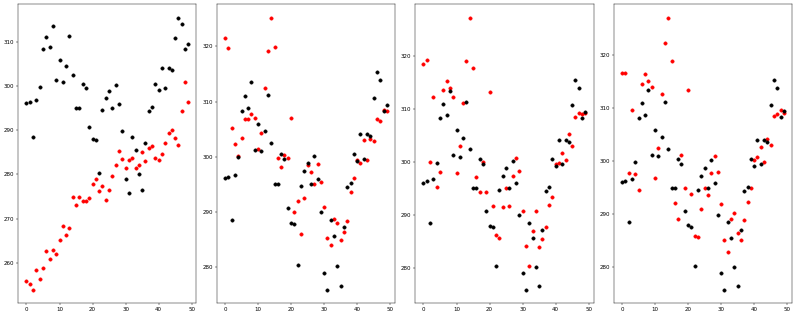

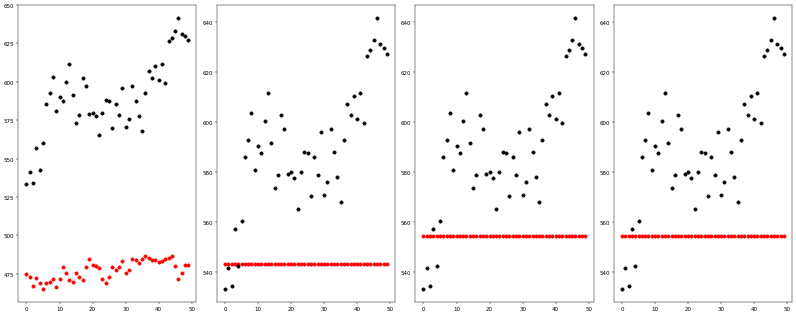

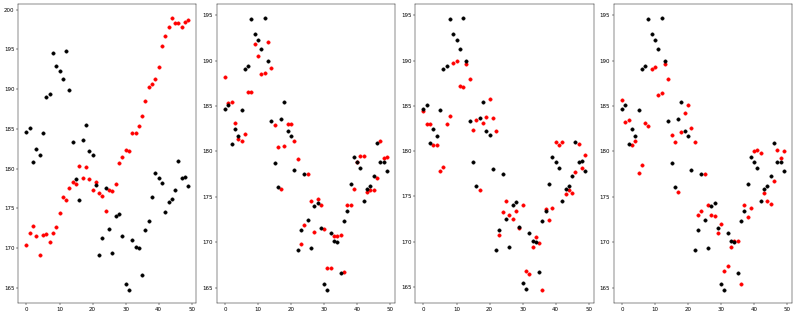

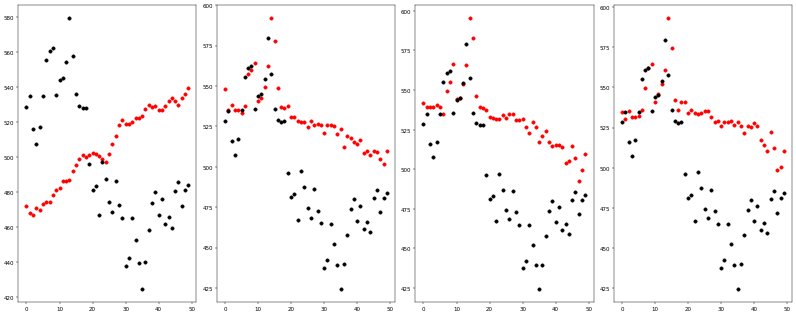

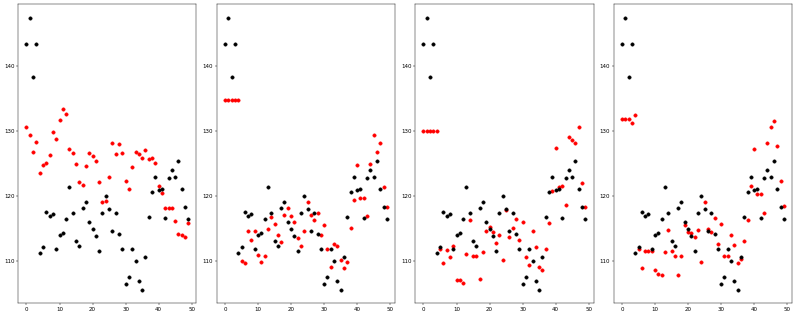

...

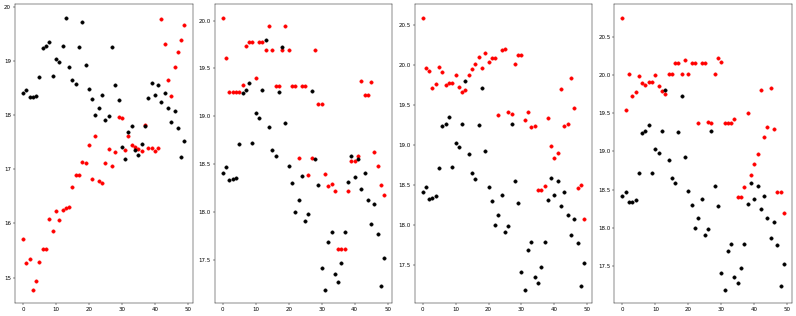

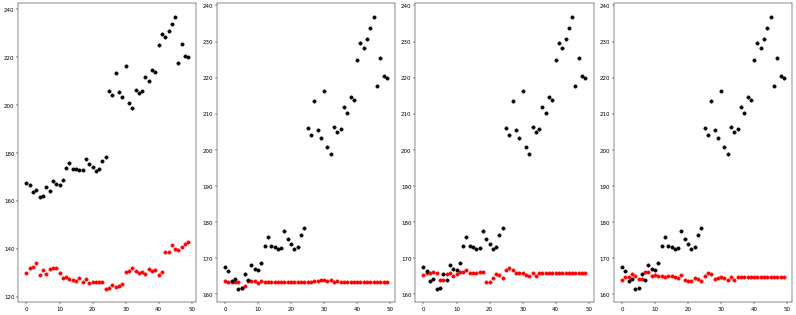

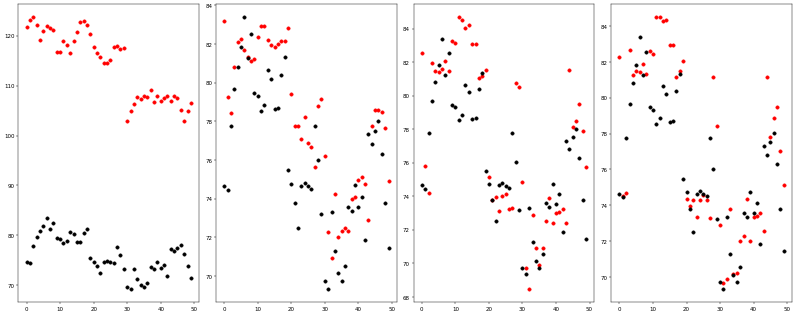

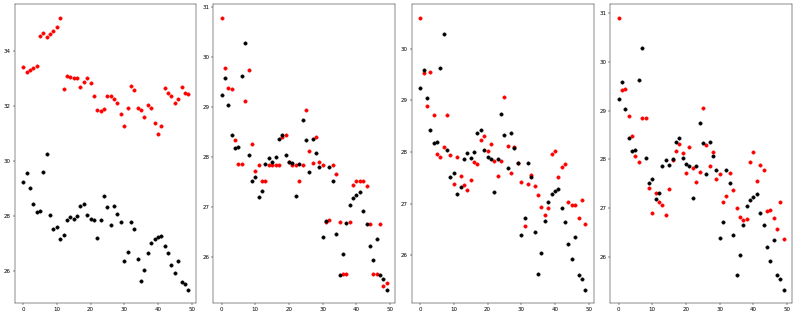

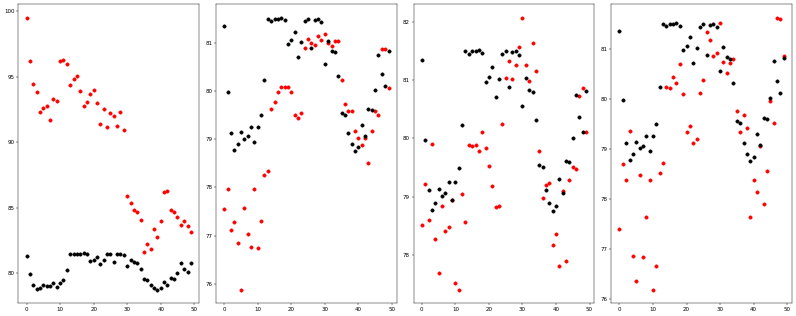

In [ ]:
draw_figure_compare4(preds_xgb0, preds_xgb1, preds_xgb2, preds_xgb3, stock_alphafinance) #true value from original data

#### here some links for [information](https://davewentzel.com/content/ConvertDatabricksDBCtoipynb/)

In [ ]:
!pip install databricks-cli

In [ ]:
!databricks configure

Databricks Host (should begin with https://): https://colab.research.google.com/drive/1BTo6WjvRYKscJS8SdnD8HNM2HruTP5Mv#scrollTo=9cc28DsFq4iE
Username: kong
Password: 
Repeat for confirmation: 


In [ ]:
mkdir export_notebooks

In [ ]:
cd export_notebooks

/content/export_notebooks


In [ ]:
!databricks workspace export -h

Usage: databricks workspace export 
           [OPTIONS] SOURCE_PATH TARGET_PATH

  Exports a notebook from the Databricks
  workspace.

  The format is by default SOURCE. Possible
  formats are SOURCE, HTML, JUPYTER, and DBC.
  Each format is documented at https://docs.data
  bricks.com/api/latest/workspace.html#notebooke
  xportformat.

Options:
  -f, --format FORMAT
  -o, --overwrite
  --debug              Debug Mode. Shows full
                       stack trace on error.

  --profile TEXT       CLI connection profile to
                       use. The default profile is
                       "DEFAULT".

  -h, --help           Show this message and exit.


In [ ]:
!databricks workspace export --format JUPYTER export_notebooks/dynamic-time-warping-mlflow-sales.dbc /content/file.ipynb

Error: Authorization failed. Your token may be expired or lack the valid scope


In [ ]:
!databricks export --format JUPYTER export_notebooks/dynamic-time-warping-mlflow-sales.dbc

Usage: databricks [OPTIONS] COMMAND [ARGS]...
Try 'databricks -h' for help.

Error: No such command 'export'.


### comapre of DTW and future

In [ ]:
pip install dtaidistance
from dtaidistance import dtw_visualisation as dtwvis
import numpy as np
from dtaidistance import dtw

In [ ]:
s1 = np.array([0., 0, 1, 2, 3, 3, 1, 0, 0, 2, 1, 0, 0])
s2 = np.array([0., 1, 2, 3, 1, 1, 0, 0, 2, 1, 0, 0, 0])
path = dtw.warping_path(s1, s2)
dtwvis.plot_warping(s1, s2, path, filename="warp.png")

(None, None)

# the rest of processing

In [ ]:
import pandas as pd


### weekly and monthly transfer

In [ ]:
stocks_yahoofinance_edited = pd.read_csv('e.csv')
stocks_yahoofinance_edited = stocks_yahoofinance_edited.rename(columns={"Unnamed: 0": "Symbol"})
stocks_yahoofinance_edited

,Symbol,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD
0,MSFT,15.373278,1.146386,72.221726,1.035689,0.296125,1968.151274,25.242038,43.930360,38.947371,-7.808102
1,TXN,2.229937,1.152752,63.849428,0.576698,0.147027,1337.019401,-5.313231,40.672222,21.948593,-2.750696
2,AAPL,26.139359,1.170133,63.274669,1.276991,0.429727,1304.247583,39.274042,71.288121,55.283775,-1.710831
3,AVGO,7.490603,1.321001,61.955194,0.695427,0.202583,1232.759135,32.026339,72.869468,31.761175,-5.138219
4,CDW,2.241751,1.214095,61.378750,0.562444,0.148836,1203.060848,4.689684,43.073371,23.070115,-12.917625
5,INTU,1.764918,1.242340,61.091407,0.546713,0.144851,1188.585660,20.946105,49.999546,22.995364,-24.677116
6,NVDA,35.626196,1.552888,52.167385,1.178369,0.487093,825.602156,91.103908,109.880578,80.640024,-9.161359
7,BRKR,0.132025,1.131786,46.407072,0.438029,0.124128,655.499796,-3.463360,43.896913,19.048624,-22.493528
8,TER,13.491981,1.391580,45.426855,0.712967,0.261379,630.129142,-12.012585,49.963272,41.373000,-28.772966
9,QCOM,14.050221,1.278893,44.113794,0.739715,0.272298,597.538187,6.613507,52.349281,39.823972,-19.285187


In [ ]:
weeklly= [-4.673533, -1.0358005, -4.9467382, -0.2243042, 0.1519538, 43.580673, 10.886288, 2.0387998, 0.9006195, -0.868454, -4.8574696, 0.06408225, 0.41916296, -51.67482, 1.5553987, -9.691698, 0.29979473, -0.4731564]
monthlly= [-1.9570018, 0.2475405, 1.6262174, 0.47057652, -0.17572305, 55.139576, 6.5313606, 1.3486352, 1.1894659, 1.7812009, -2.1909769, 0.02438948, 0.33855185, -37.214127, 2.1566563, -11.716046, 0.20644414, -0.2360337]

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np


In [ ]:
def weekmonth(weekly, monthly, _edited):
  scaler = MinMaxScaler(feature_range = (-1,1))
  weekly = np.array(weekly).reshape(-1,1)
  monthly = np.array(monthly).reshape(-1,1)

  weekly = scaler.fit_transform(weekly).reshape(1,-1)[0].tolist()
  monthly = scaler.fit_transform(monthly).reshape(1,-1)[0].tolist()



  for i in range(len(weekly)):
    # strong sell
    if weekly[i] <= -0.6:
      weekly[i] = 0
    # sell
    elif weekly[i] > -0.6 and weekly[i] <= -0.2:
      weekly[i] = 1
    # neutral
    elif weekly[i] > -0.2 and weekly[i] <= 0.2:
      weekly[i] = 2
    # buy
    elif weekly[i] > 0.2 and weekly[i] <= 0.6:
      weekly[i] = 3
    # strong buy
    else:
      weekly[i] = 4


  for i in range(len(monthly)):
    # strong sell
    if monthly[i] <= -0.6:
      monthly[i] = 0
    # sell
    elif monthly[i] > -0.6 and monthly[i] <= -0.2:
      monthly[i] = 1
    # neutral
    elif monthly[i] > -0.2 and monthly[i] <= 0.2:
      monthly[i] = 2
    # buy
    elif monthly[i] > 0.2 and monthly[i] <= 0.6:
      monthly[i] = 3
    # strong buy
    else:
      monthly[i] = 4

  _edited['Weekly'] = pd.Series(weekly, index=_edited.index)
  _edited['Monthly'] = pd.Series(monthly, index=_edited.index)
  _edited



  # download stock from yahoo finance & metrics calculated by using LSTM
  _edited.to_csv('f.csv')
  return _edited
  # create_download_link(filename = 'f.csv')

In [ ]:
stocks_yahoofinance_edited = weekmonth(weeklly, monthlly, stocks_yahoofinance_edited)
stocks_yahoofinance_edited.head(2)

,Symbol,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD,Weekly,Monthly
0,MSFT,15.373278,1.146386,72.221726,1.035689,0.296125,1968.151274,25.242038,43.930360,38.947371,-7.808102,2,1
1,TXN,2.229937,1.152752,63.849428,0.576698,0.147027,1337.019401,-5.313231,40.672222,21.948593,-2.750696,2,2


### combination

In [ ]:
import pandas as pd

stocks_investing = pd.read_csv('initial_datafram.csv')
stocks_investing.drop(columns=['Unnamed: 0', 'Name'], inplace=True)
stocks_investing.head(3)

,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,QCOM.O,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,0,3
1,TSLA.O,1.120000e+12,5.382000e+10,26651773.0,4.92,218.95,2.08,2.63,63.90,1796.80,4,4
2,NVDA.O,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4


In [ ]:
def remove_Nme_O(dataframe, cols):
   for col in cols:
     print(col)
     dataframe[col]= dataframe[col].map(lambda x: str(x)[:-2])
   return dataframe

stocks_investing = remove_Nme_O(stocks_investing, ['Symbol'])
stocks_investing.head(3)

Symbol


,Symbol,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
0,QCOM,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,0,3
1,TSLA,1.120000e+12,5.382000e+10,26651773.0,4.92,218.95,2.08,2.63,63.90,1796.80,4,4
2,NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4


In [ ]:
stocks_yahoofinance_edited = pd.read_csv('f.csv')
stocks_yahoofinance_edited.drop(columns='Unnamed: 0', inplace=True)
stocks_yahoofinance_edited.head(3)  ## the same data produced after weekly and monthly

,Symbol,alpha,beta,r-squared,share_ratio,treynor_ratio,f_test,1 Year,2 Year,3 Year,YTD,Weekly,Monthly
0,MSFT,15.373278,1.146386,72.221726,1.035689,0.296125,1968.151274,25.242038,43.930360,38.947371,-7.808102,2,1
1,TXN,2.229937,1.152752,63.849428,0.576698,0.147027,1337.019401,-5.313231,40.672222,21.948593,-2.750696,2,2
2,AAPL,26.139359,1.170133,63.274669,1.276991,0.429727,1304.247583,39.274042,71.288121,55.283775,-1.710831,2,2


In [ ]:
# list(stocks_yahoofinance_edited['Symbol'])  # testing data
# list(stocks_investing['Symbol'])
# print( len(list(stocks_yahoofinance_edited['Symbol']) ) )
# print(len( list(stocks_investing['Symbol'])) )
# set(list(stocks_investing['Symbol'])) - set(list(stocks_yahoofinance_edited['Symbol']))

In [ ]:
###########################################################################
#      C. DM1 (investing.com) & DM2 (preprocess yahoofinance) consensus   #
###########################################################################
# In this sectiton we calculate score for each DM for each stock, the total
# score of the 2 DM's for each score (along with average, standard deviation)
# and we exclude more stocks if they are not under a specific STD threshold s.
# HERE we prefer s = 0.18, so every stock with s > 0.18 is excluded
##################################################################################
#   1. DM2 results combined (our own Beta, YTD, weekly, monthly recommendations) #
##################################################################################
# Step 1 : changstocks_investingcome index of DM1
# 1.1
tickers =  stocks_investing['Symbol']
stocks_investing.index = tickers
# 1.2
tickers_exclude = set(list(stocks_investing['Symbol'])) - set(list(stocks_yahoofinance_edited['Symbol']))
stocks_investing = stocks_investing.drop(index = tickers_exclude)
stocks_investing.shape

(18, 12)

In [ ]:
stocks_investing.drop(columns='Symbol', inplace= True)
stocks_investing

,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
QCOM,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,0,3
TSLA,1.120000e+12,5.382000e+10,26651773.0,4.92,218.95,2.08,2.63,63.90,1796.80,4,4
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AUDC,8.235000e+08,2.489300e+08,128310.0,1.00,25.65,0.58,-27.06,-8.55,61.50,0,1
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
ESLT,9.740000e+09,5.160000e+09,51816.0,7.55,29.18,0.79,26.33,52.76,63.33,4,4
TXN,1.680400e+11,1.834000e+10,6273342.0,8.26,22.20,0.95,-3.39,-5.20,65.11,4,4
EQIX,6.922000e+10,6.640000e+09,467181.0,5.54,133.97,0.46,-9.79,12.54,65.71,4,4


In [ ]:
stocks_investing = stocks_investing.reindex(stocks_yahoofinance_edited['Symbol'] )
stocks_investing

,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4
TXN,1.680400e+11,1.834000e+10,6273342.0,8.26,22.20,0.95,-3.39,-5.20,65.11,4,4
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
CDW,2.399000e+10,2.082000e+10,912111.0,7.03,25.43,1.10,-13.18,4.93,79.11,2,4
INTU,1.368600e+11,1.141000e+10,1957868.0,7.84,61.35,1.10,-24.76,22.44,80.40,1,3
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
BRKR,9.800000e+09,2.420000e+09,817105.0,1.81,35.47,1.23,-22.55,0.11,68.67,0,2
TER,1.890000e+10,3.700000e+09,2055816.0,5.52,21.41,1.48,-28.84,-9.66,176.94,1,2


In [ ]:
stocks_investing.to_csv('stocks_investing.csv')

In [ ]:
# Step 2 : define the new DM2 Dataframe
stocks_yahoofinance_edited.index = stocks_investing.index
stock_investitngcom_row = stocks_investing.copy()
stocks_yahoofinance_edited2 = pd.DataFrame(columns = stocks_investing.columns, index = stocks_yahoofinance_edited.index )
for item in stocks_yahoofinance_edited.index:

  # Step 2.1 : select the respective rows froms invesing_com, and preprocessed yahoo finance
  # to update the values of beta, YTD, weekly, monthly based on ou finding from
  # the previous analysis

  stock_yahoofinance_row = stocks_yahoofinance_edited.loc[item].to_frame().transpose()
  stock_investitngcom_row = stocks_investing.loc[item].to_frame().transpose()

  # Step 2.3 : Update the values and append the new row in the new DM2 datatfame
  # change beta
  stock_investitngcom_row['Beta'] = stock_yahoofinance_row['beta']
  # change YTD
  stock_investitngcom_row['YTD'] = stock_yahoofinance_row['YTD']
  # change weekly
  stock_investitngcom_row['Weekly'] = stock_yahoofinance_row['Weekly']
  # change monthly
  stock_investitngcom_row['Monthly'] = stock_yahoofinance_row['Monthly']


  # stock_investitngcom_row = stock_investitngcom_row.convert_objects(convert_numeric = True)
  stocks_yahoofinance_edited2.loc[item] = stock_investitngcom_row.squeeze()
  # stocks_yahoofinance_edited2 = stocks_yahoofinance_edited2.convert_objects(convert_numeric = True)

stocks_yahoofinance_edited2

In [ ]:
stocks_yahoofinance_edited2.to_csv('stocks_yahoofinance_edited2.csv')

In [ ]:

def object_numeric(datafram, cols):
  for col in cols:
    datafram[col] = datafram[col].astype(float)
  return datafram

object_numeric(stocks_yahoofinance_edited2, stocks_yahoofinance_edited2.columns)
stocks_yahoofinance_edited2.dtypes

Market Cap             float64
Revenue                float64
Average Volume (3m)    float64
EPS                    float64
P/E Ratio              float64
Beta                   float64
YTD                    float64
1 Year                 float64
3 Years                float64
Weekly                 float64
Monthly                float64
dtype: object

In [ ]:
stocks_investing.columns.values

array(['Market Cap', 'Revenue', 'Average Volume (3m)', 'EPS', 'P/E Ratio',
       'Beta', 'YTD', '1 Year', '3 Years', 'Weekly', 'Monthly'],
      dtype=object)

In [ ]:
import numpy as np

##-----ATTENTION--- here normalize it by using the weights different from our expected, if it use MCDM directly

In [ ]:
########################
#   2. Normalization  #
########################

def normalization(dm, decision, weights):
  dm_normalized = dm.copy()
  fields = list(dm_normalized.columns.values)

  # Step 1: In order to be able to compare different kinds of criteria the first step
  # is to make them dimensionless
  for criterion in fields[0:]:
    crit_values = list(dm_normalized[criterion])
    rms = np.sqrt(sum([i**2 for i in crit_values]))
    dm_normalized[criterion] = dm_normalized[criterion] / rms

  for i in range(0,len(fields)):
    dm_normalized[fields[i]] = dm_normalized[fields[i]] / weights[i]

  # Step 3: Final ranking for the stocks of the portfolio
  # Total sum per row:
  dm_normalized['DM' + str(decision)] = dm_normalized.sum(1)
  return dm_normalized

# Market Cap : 1 %
# P/E Ratio: 2.5%
# Revenue: 2.5%
# Average Vol: 1.5%
# EPS: 10%
# Beta: 25%
# YTD: 15%
# 1 Year: 6.5%
# 3 Year: 1%
# Weekly: 25%
# Monthly: 10%
# weights = [ 0.01, 0.025, 0.025, 0.015, 0.1, 0.25, 0.15, 0.065, 0.01, 0.25, 0.1]
weights = [ 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09]

stocks_investingcom_normalized = normalization(stocks_investing,1, weights)
stocks_yahoofinance_normalized = normalization(stocks_yahoofinance_edited2,2,weights)

print(stocks_investingcom_normalized.head())
print(stocks_yahoofinance_normalized.head())

        Market Cap   Revenue  Average Volume (3m)       EPS  P/E Ratio  \
Symbol                                                                   
MSFT      6.590115  4.787528             3.535091  3.516769   1.249263   
TXN       0.477329  0.474869             0.590484  3.090268   0.845537   
AAPL      8.067210  9.795660             8.781256  2.252229   1.104150   
AVGO      0.727128  0.737937             0.243182  6.565883   1.366191   
CDW       0.068145  0.539082             0.085853  2.630095   0.968559   

            Beta       YTD    1 Year   3 Years    Weekly   Monthly        DM1  
Symbol                                                                         
MSFT    2.043469 -1.171480  2.076040  0.924108  3.628874  3.174603  30.354380  
TXN     2.156995 -0.496415 -0.390149  0.376997  3.628874  3.174603  13.929392  
AAPL    2.679215 -0.269440  3.130192  1.501560  3.628874  3.174603  43.845508  
AVGO    2.338637 -0.846394  2.380656  0.618909  3.628874  3.174603  20.935606  
C

In [ ]:
stocks_investingcom_normalized = pd.read_csv('s_inv_norm.csv')
stocks_yahoofinance_normalized = pd.read_csv('s_yah_norm.csv')

In [ ]:
stocks_investingcom_normalized.set_index('Symbol', inplace=True)
stocks_yahoofinance_normalized.set_index('Symbol', inplace=True)

In [ ]:
stocks_investingcom_normalized.to_csv('s_inv_norm.csv')
stocks_yahoofinance_normalized.to_csv('s_yah_norm.csv')

In [ ]:
#####################################
#   3. Combine scores of DM1, DM2   #
#####################################
# Step 4.1 : Calculate consensus & total % consensus
TH_con = 15
TH_std = 2
def consensus(data):
  return 100 - (100 * data['St. dev'] / TH_std)


# Step 1 : Combine DM1, DM2 scores
final = pd.merge(stocks_investingcom_normalized,stocks_yahoofinance_normalized, left_index=True, right_index=True )
final = final[['DM1','DM2']]
#display(final.head())

# Step 2.1 : Calculate total score
final['Total Score'] = final.sum(1)
#display(final.head())

# Step 2.2 : Rank stocks by total score (sorting)
final = final.sort_values('Total Score', ascending=False)
#display(final.head())


# Step 2.2 : Average of scores of DM1, DM2
final['Average'] = final[['DM1', 'DM2']].mean(1)
#display(final.head())


# Step 2.3 : Standard deviation of scores of DM1, DM2
final['St. dev'] = final[['DM1', 'DM2']].std(1)
final['Standard Consensus'] = final[['DM1', 'DM2', 'St. dev']].apply(consensus, axis = 1)
display(final)
#######################DROP STOCKS#######################
print(final)
TH_std = 2

# Step 3.1 : Droping stocks based on their bad total score
final = final[final['Total Score'] >= 0]

# Step 3.2 : Droping stocks based on the standard deviation threshold
final = final[final['St. dev'] <= TH_std]



# Step 4.2 : Droping stocks based on their bad consensus performance
TH_con = 15


final = final[final['Standard Consensus'] >= TH_con]
final = final.sort_values('Standard Consensus', ascending=False)
print(final.shape)
display(final)
print("Final Average Consensus for DM1, DM2 is : " + str(round(final['Standard Consensus'].mean(0), 2)) + "%")

# download consensus table
final.to_csv('h.csv')
# create_download_link(filename = 'h.csv')

,DM1,DM2,Total Score,Average,St. dev,Standard Consensus
Symbol,,,,,,
AAPL,176.803435,175.907153,352.710588,176.355294,0.633767,68.311639
TSLA,167.596871,164.970077,332.566948,166.283474,1.857424,7.128785
MSFT,126.885203,125.010237,251.895440,125.947720,1.325802,33.709925
NVDA,87.990555,87.635324,175.625879,87.812939,0.251186,87.440696
AVGO,64.065141,63.459395,127.524535,63.762268,0.428327,78.583642
QCOM,41.646870,42.845787,84.492657,42.246328,0.847762,57.611890
INTU,32.641723,36.778651,69.420374,34.710187,2.925249,-46.262468
TXN,34.928790,34.249670,69.178460,34.589230,0.480210,75.989479
ESLT,34.599500,30.358176,64.957676,32.478838,2.999069,-49.953451


               DM1         DM2  Total Score     Average   St. dev  \
Symbol                                                              
AAPL    176.803435  175.907153   352.710588  176.355294  0.633767   
TSLA    167.596871  164.970077   332.566948  166.283474  1.857424   
MSFT    126.885203  125.010237   251.895440  125.947720  1.325802   
NVDA     87.990555   87.635324   175.625879   87.812939  0.251186   
AVGO     64.065141   63.459395   127.524535   63.762268  0.428327   
QCOM     41.646870   42.845787    84.492657   42.246328  0.847762   
INTU     32.641723   36.778651    69.420374   34.710187  2.925249   
TXN      34.928790   34.249670    69.178460   34.589230  0.480210   
ESLT     34.599500   30.358176    64.957676   32.478838  2.999069   
CDW      27.401490   27.260636    54.662125   27.331063  0.099599   
EQIX     27.981389   26.194679    54.176069   27.088034  1.263395   
TER      23.297632   24.716385    48.014017   24.007009  1.003210   
ATVI     23.672166   22.863587    

,DM1,DM2,Total Score,Average,St. dev,Standard Consensus
Symbol,,,,,,
CDW,27.401490,27.260636,54.662125,27.331063,0.099599,95.020049
NVDA,87.990555,87.635324,175.625879,87.812939,0.251186,87.440696
AVGO,64.065141,63.459395,127.524535,63.762268,0.428327,78.583642
TXN,34.928790,34.249670,69.178460,34.589230,0.480210,75.989479
ATVI,23.672166,22.863587,46.535753,23.267877,0.571751,71.412433
AAPL,176.803435,175.907153,352.710588,176.355294,0.633767,68.311639
QCOM,41.646870,42.845787,84.492657,42.246328,0.847762,57.611890
TER,23.297632,24.716385,48.014017,24.007009,1.003210,49.839488
SPNS,4.866150,6.374469,11.240618,5.620309,1.066542,46.672881


Final Average Consensus for DM1, DM2 is : 60.45%


In [ ]:
final = pd.read_csv('h.csv')

In [ ]:
print(final.head())
print(final.index)

          DM1        DM2  Total Score    Average   St. dev  Standard Consensus
4   27.401490  27.260636    54.662125  27.331063  0.099599           95.020049
6   87.990555  87.635324   175.625879  87.812939  0.251186           87.440696
3   64.065141  63.459395   127.524535  63.762268  0.428327           78.583642
1   34.928790  34.249670    69.178460  34.589230  0.480210           75.989479
17  23.672166  22.863587    46.535753  23.267877  0.571751           71.412433
Int64Index([4, 6, 3, 1, 17, 2, 9, 8, 11, 12, 7, 10, 0], dtype='int64')


In [ ]:
import pandas as pd
stocks_investingcom = pd.read_csv("initial_datafram.csv")


In [ ]:
#######################################################
#      D. Apply TOPSIS, ELECTRE with veto, PROMETHE   #
#######################################################
# > In this sectiton we apply all the above metthodologies to reach a single (or a pool)
# of stocks
# > Depsite the use of our own data to conclude upon the DM2 values, for this section
# we will proceed with actual data we already have from a trust worthy source
# investing.com
stock_tickers = list(final.index)

# Step 1 :  Keep the 22 stocks
tickers_exclude = list(set(list(stocks_investing.index)) - set(stock_tickers))
stocks = stocks_investing.drop(tickers_exclude)
stocks = stocks.reindex(final.index)

# Step 2 :  Normalize again with different weights this time since our perspective
# have changed. In the previous setction we give greater weights to our risk metrics
# and YTD calculated by our own analysis so that we could have a fair enough DM2
# results.
# Market Cap : 2.5 %
# P/E Ratio: 10%
# Revenue: 15%
# Average Vol: 2.5%
# EPS: 15%
# Beta: 12.5%
# YTD: 10%
# 1 Year: 10%
# 3 Year: 2.5%
# Weekly: 12.5%
# Monthly: 7.5%
weights = [ 0.025, 0.1, 0.15, 0.025, 0.15, 0.125, 0.1, 0.1, 0.025, 0.125, 0.075]
# weights = [ 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09]
stocks_normalized = normalization(stocks,1,weights)
del stocks_normalized['DM1']
# del stocks_normalized['Name']
display(stocks)

NameError: ignored

In [ ]:
stocks_tickers.head(3)

,Name,Symbol
0,Qualcomm Incorporated,QCOM
1,Tesla Inc,TSLA
2,NVIDIA Corporation,NVDA


####code

In [ ]:
##################
#   1. TOPSIS    #
##################
# 1. The basic principle of the TOPSIS method is that the chosen alternative
#    should have the shortest distance from the positive ideal solution (PIS)
#    and the farthest distance from the negative ideal solution (NIS). It is an
#    effective method to determine the total ranking order of decision alternatives.
# 2. TOPSIS method are used to derive the closeness coefficient and the outranking
#    index of each stock, respectively. Based on the closeness coefficient, the
#    outranking index, and selection threshold, we can easily obtain three type of
#    the investment ratio in accordance with different investment preference of final decision-maker.
#    It is a reasonable way in real decision environment

# Step 1 : Ideal and anti-ideal solutions
topsis_ideal = pd.DataFrame(index = ['Positive ideal solution','Negative ideal solution'], columns = list(stocks_normalized.columns))
topsis_ideal.loc['Positive ideal solution'] = stocks_normalized.max()
topsis_ideal.loc['Negative ideal solution'] = stocks_normalized.min()

# Step 2 : Calculation of the Separation Measures D+, D-. This step is about the calculation
# of the distances of each alternative from the ideal solution as:
#########################################
#                 _______________       #
#                | --                   #
#                | \               2    #
#        D_i* =  | /  (v_ij - v_j*)     #
#               \| --                   #
#                                       #
#########################################
#########################################
#                 _______________       #
#                | --                   #
#           _    | \             _ 2    #
#        D_i  =  | /  (v_ij - v_j )     #
#               \| --                   #
#                                       #
#########################################
stocks_topsis = stocks_normalized.copy()

# Step 2.1 : Calculate D+, D-
def D_plus(data):
  return np.sqrt( sum((data - topsis_ideal.loc['Positive ideal solution'])**2)  )

def D_minus(data):
  return np.sqrt( sum((data - topsis_ideal.loc['Negative ideal solution'])**2)  )

D_plus = stocks_topsis.apply(D_plus, axis = 1)
D_minus = stocks_topsis.apply(D_minus, axis = 1)


stocks_topsis['D_plus'] = D_plus
stocks_topsis['D_minus'] = D_minus


# Step 3 : Calculation of the Relative Closeness to the Ideal Solution
# The relative closeness C_i* is always between 0 and 1 and an alternative is
# best when it is closer to 1. It is calculated for each alternative and is defined as
#########################################
#                     _                 #
#                  D_i                  #
#                                       #
#        C_i* = ----------              #
#                         _             #
#               D_i* + D_i              #
#                                       #
#########################################
def C(data):
  return data['D_minus'] / (data['D_plus'] + data['D_minus'])

stocks_topsis['C_closeness'] =  stocks_topsis.apply(C, axis = 1)
display(stocks_topsis )
stocks_topsis.to_csv('stocks_topsis_cal.csv')
# Step 4 : Step 6. Ranking of the Preference Order Finally, the alternatives
# are ranked from best (higher relative closeness value) to worst.
# The best alternative and the solution to the problem is on the top of the list.
TH_topsis = 0.25
stocks_topsis = stocks_topsis.sort_values('C_closeness', ascending=False)
stocks_topsis = stocks_topsis[stocks_topsis['C_closeness'] >= TH_topsis]

display(stocks_topsis)
stocks_topsis.to_csv('stocks_topsis_res.csv')
# Step 5 :  Print company names we will invest in

companynames_topsis = [stocks_tickers.loc[stocks_tickers['Symbol'] == i, 'Name'].item() for i in list(stocks_topsis.index) ]
print("We will invest in the following companies :")
print(companynames_topsis)

display(stocks.loc[list(stocks_topsis.index)])
stocks.loc[list(stocks_topsis.index)].to_csv('companynames_topsis.csv')

,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly,D_plus,D_minus,C_closeness
Symbol,,,,,,,,,,,,,,
CDW,0.071171,0.543658,0.088145,2.913780,1.589076,2.989829,-2.463913,0.474226,1.335241,2.054445,3.59312,21.633701,5.689440,0.208228
NVDA,1.985908,0.702683,5.093105,1.595740,4.434167,3.859598,-1.716139,8.984318,8.166896,4.108890,3.59312,14.888934,15.877556,0.516067
AVGO,0.759415,0.744201,0.249673,7.274089,2.241454,2.799567,-1.080532,3.052167,1.804120,4.108890,3.59312,18.967612,10.859894,0.364090
TXN,0.498524,0.478900,0.606244,3.423588,1.387239,2.582125,-0.633738,-0.500198,1.098945,4.108890,3.59312,21.192496,7.580739,0.263465
ATVI,0.187228,0.229788,1.187830,1.425804,1.453477,1.467734,4.015542,-1.482316,1.186375,4.108890,3.59312,21.659042,10.574976,0.328069
AAPL,8.425424,9.878813,9.015634,2.495158,1.811535,3.207271,-0.343976,4.013124,4.377046,4.108890,3.59312,11.163245,18.713454,0.626356
QCOM,0.491463,0.941088,1.079889,3.618393,1.094169,3.261632,-3.667827,0.642562,2.583053,0.000000,2.69484,21.217883,5.486054,0.205440
TER,0.056071,0.096616,0.198670,2.287919,1.337874,4.022679,-5.391445,-0.929213,2.986444,1.027223,1.79656,23.326845,4.184315,0.152095
SPNS,0.004213,0.012039,0.007712,0.352306,1.869649,3.723696,-4.634324,-1.897865,1.135402,0.000000,1.79656,24.545519,2.702669,0.099187


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly,D_plus,D_minus,C_closeness
Symbol,,,,,,,,,,,,,,
AAPL,8.425424,9.878813,9.015634,2.495158,1.811535,3.207271,-0.343976,4.013124,4.377046,4.10889,3.59312,11.163245,18.713454,0.626356
NVDA,1.985908,0.702683,5.093105,1.595740,4.434167,3.859598,-1.716139,8.984318,8.166896,4.10889,3.59312,14.888934,15.877556,0.516067
MSFT,6.882741,4.828168,3.629445,3.896093,2.049615,2.446224,-1.495546,2.661628,2.693775,4.10889,3.59312,14.528126,12.567912,0.463828
AVGO,0.759415,0.744201,0.249673,7.274089,2.241454,2.799567,-1.080532,3.052167,1.804120,4.10889,3.59312,18.967612,10.859894,0.364090
ATVI,0.187228,0.229788,1.187830,1.425804,1.453477,1.467734,4.015542,-1.482316,1.186375,4.10889,3.59312,21.659042,10.574976,0.328069
EQIX,0.205355,0.173386,0.045148,2.296208,8.371552,1.250292,-1.830175,1.206246,1.109072,4.10889,3.59312,20.473973,9.982508,0.327763
TXN,0.498524,0.478900,0.606244,3.423588,1.387239,2.582125,-0.633738,-0.500198,1.098945,4.10889,3.59312,21.192496,7.580739,0.263465


We will invest in the following companies :
['Apple Inc', 'NVIDIA Corporation', 'Microsoft Corporation', 'Broadcom Inc', 'Activision Blizzard Inc', 'Equinix Inc', 'Texas Instruments Incorporated']


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
ATVI,6.311000e+10,8.800000e+09,12291522.0,3.44,23.26,0.54,21.48,-15.41,70.29,4,4
EQIX,6.922000e+10,6.640000e+09,467181.0,5.54,133.97,0.46,-9.79,12.54,65.71,4,4
TXN,1.680400e+11,1.834000e+10,6273342.0,8.26,22.20,0.95,-3.39,-5.20,65.11,4,4


In [ ]:
#######################################
#   2. ELECTRE I with & without veto  #
#######################################
# Step 1 : Define the necessary DataFrames of agreement & disagreement
stocks_electreI = stocks.copy()
# del stocks_electreI['Name']

# Step 2 : Define veto thresholds. The veto thresholds express the power attributed to a given criteria to be against the assertion “a outranks b”, when
# the difference in the evaluation between g(b) and g(a) is greater than this threshold.
veto = [10000000000000000000000000, 15,10000000000000000000000000,10000000000000000000000000,5,0.6,25, 45,80,10000000000000000000000000,10000000000000000000000000]

eledctrI_agree = pd.DataFrame(index = stocks_electreI.index, columns = stocks_electreI.index)
eledctrI_disagree = eledctrI_agree.copy()
eledctrI_disagree_veto = eledctrI_agree.copy()

# Step 2 : Calculate agreement & disagreemnt table
# define delta for disagreement

c = stocks_electreI.max()
d = stocks_electreI.min()
delta = max(c - d)

for i in eledctrI_agree.columns:
  for j in eledctrI_agree.columns:
    a = stocks_electreI.loc[i]
    b = stocks_electreI.loc[j]
    # Step 2.1 : agreement cell calculation
    eledctrI_agree[j].loc[i] =  sum([ weights[i] for i in range(len((a-b))) if (a-b)[i] >=0 ])

    # Step 2.2 : disagreement cell calculation
    # with veto
    dis = (b - a) - veto
    dis_result = 1 if any(i >= 0 for i in dis) else 0
    eledctrI_disagree_veto[j].loc[i] = dis_result
    # without veto
    eledctrI_disagree[j].loc[i] = max(dis) / delta

display(eledctrI_agree)
display(eledctrI_disagree)
display(eledctrI_disagree_veto)


#display(eledctrI_agree)
#display(eledctrI_disagree_veto)

# Step 3.1.1 : FIND kernel after applying ELECTRE withtout veto
# Start with c = 1.0, d = 0 as initial threshold values for
# agreement and disagreement. Relaxing those thresholds until we
# include at least 5 stocks in our kernel
c = 1.0
d = 0.0

kernel = list(eledctrI_agree.columns)
changes = {}

for k in range(1000000000):
  length = len(kernel)
  for i in eledctrI_agree.columns:
    for j in eledctrI_agree.columns:
      if i == j: continue
      if(eledctrI_agree[j].loc[i]  >= c and eledctrI_disagree[j].loc[i] <= d):
        if j in kernel:
          kernel.remove(j)
  a = kernel.copy()
  if(len(kernel) < length): changes.update({(c,d):a})
  if(len(kernel) < 6): break
  c -= 0.01
  d += 0.01

# Step 3.1.2 :  Print company names we will invest in
companynames_electreI = [stocks_tickers.loc[stocks_tickers['Symbol'] == i, 'Name'].item() for i in kernel ]
print("Electre I withtout veto : We will invest in the following companies :")
print(companynames_electreI)
print()
print(changes)
print()
display(stocks.loc[kernel])
stocks.loc[kernel].to_csv('withveto_res.csv')
# Step 3.2 : FIND kernel after applying ELECTRE withtout veto
kernel_veto = list(eledctrI_agree.columns)
changes_veto = {}
s = 1
for k in range(100000000):
  length = len(kernel_veto)
  for i in eledctrI_agree.columns:
    for j in eledctrI_agree.columns:
      if i == j: continue
      if(eledctrI_agree[j].loc[i]  >= s and eledctrI_disagree_veto[j].loc[i] == 0):
        if j in kernel_veto:
          kernel_veto.remove(j)
  a = kernel_veto.copy()
  if(len(kernel_veto) < length): changes_veto.update({(s):a})
  if(len(kernel_veto) < 6): break
  s -= 0.01


# Step 3.3.2 :  Print company names we will invest in
companynames_electreI = [stocks_tickers.loc[stocks_tickers['Symbol'] == i, 'Name'].item() for i in kernel_veto ]
print("Electre with veto : We will invest in the following companies :")
print(companynames_electreI)
print()
print(changes_veto)

display(stocks.loc[kernel_veto])
stocks.loc[kernel_veto].to_csv('veto_res.csv')


Symbol,CDW,NVDA,AVGO,TXN,ATVI,AAPL,QCOM,TER,SPNS,MGIC,BRKR,EQIX,MSFT
Symbol,,,,,,,,,,,,,
CDW,0.99,0.18,0.18,0.54,0.63,0.18,0.36,0.72,0.81,0.63,0.81,0.54,0.18
NVDA,0.9,0.99,0.72,0.81,0.9,0.54,0.81,0.81,0.99,0.99,0.99,0.81,0.63
AVGO,0.9,0.45,0.99,0.81,0.81,0.36,0.63,0.81,0.9,0.9,0.9,0.9,0.63
TXN,0.54,0.36,0.36,0.99,0.63,0.27,0.45,0.81,0.72,0.63,0.63,0.72,0.36
ATVI,0.45,0.27,0.36,0.54,0.99,0.27,0.45,0.63,0.81,0.63,0.72,0.63,0.27
AAPL,0.9,0.63,0.81,0.9,0.9,0.99,0.81,0.9,0.81,0.9,0.81,0.9,0.81
QCOM,0.63,0.18,0.36,0.54,0.54,0.18,0.99,0.63,0.81,0.63,0.81,0.54,0.09
TER,0.27,0.18,0.18,0.18,0.36,0.09,0.36,0.99,0.81,0.72,0.72,0.27,0.18
SPNS,0.18,0,0.09,0.27,0.18,0.18,0.27,0.27,0.99,0.63,0.27,0.18,0.09


Symbol,CDW,NVDA,AVGO,TXN,ATVI,AAPL,QCOM,TER,SPNS,MGIC,BRKR,EQIX,MSFT
Symbol,,,,,,,,,,,,,
CDW,-0.0,0.002145,0.002705,-0.0,0.0,0.125918,0.005361,0.0,-0.0,-0.0,0.0,0.0,0.057792
NVDA,-0.0,-0.0,0.00056,-0.0,0.0,0.123773,0.003216,-0.0,-0.0,-0.0,-0.0,0.0,0.055647
AVGO,-0.0,0.0,-0.0,-0.0,0.0,0.123213,0.002656,-0.0,-0.0,-0.0,-0.0,0.0,0.055087
TXN,0.000874,0.003019,0.003579,-0.0,-0.0,0.126792,0.006234,0.0,0.0,0.0,0.0,0.0,0.058666
ATVI,0.004234,0.006379,0.006939,0.00336,-0.0,0.130152,0.009594,0.0,0.0,0.0,0.0,0.0,0.062026
AAPL,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0
QCOM,0.0,0.0,0.0,-0.0,0.0,0.120558,-0.0,-0.0,0.0,0.0,0.0,0.0,0.052431
TER,0.00603,0.008175,0.008735,0.005156,0.001796,0.131948,0.011391,-0.0,0.0,0.0,0.0,0.001036,0.063822
SPNS,0.007171,0.009316,0.009876,0.006297,0.002937,0.133089,0.012532,0.001141,-0.0,0.000007,0.00069,0.002176,0.064963


Symbol,CDW,NVDA,AVGO,TXN,ATVI,AAPL,QCOM,TER,SPNS,MGIC,BRKR,EQIX,MSFT
Symbol,,,,,,,,,,,,,
CDW,0,1,1,0,1,1,1,1,0,0,1,1,1
NVDA,0,0,1,0,1,1,1,0,0,0,0,1,1
AVGO,0,1,0,0,1,1,1,0,0,0,0,1,1
TXN,1,1,1,0,0,1,1,1,1,1,1,1,1
ATVI,1,1,1,1,0,1,1,1,1,1,1,1,1
AAPL,0,1,1,0,0,0,0,0,0,0,1,1,0
QCOM,1,1,1,0,1,1,0,0,1,1,1,1,1
TER,1,1,1,1,1,1,1,0,1,1,1,1,1
SPNS,1,1,1,1,1,1,1,1,0,1,1,1,1


Electre I withtout veto : We will invest in the following companies :
['NVIDIA Corporation', 'Broadcom Inc', 'Apple Inc', 'Microsoft Corporation']

{(0.98, 0.02): ['CDW', 'NVDA', 'AVGO', 'TXN', 'ATVI', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], (0.8899999999999999, 0.10999999999999999): ['NVDA', 'AVGO', 'AAPL', 'MSFT']}



,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4


Electre with veto : We will invest in the following companies :
['NVIDIA Corporation', 'Broadcom Inc', 'Apple Inc', 'Equinix Inc', 'Microsoft Corporation']

{0.98: ['CDW', 'NVDA', 'AVGO', 'TXN', 'ATVI', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], 0.8899999999999999: ['NVDA', 'AVGO', 'AAPL', 'EQIX', 'MSFT']}


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
EQIX,6.922000e+10,6.640000e+09,467181.0,5.54,133.97,0.46,-9.79,12.54,65.71,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4


In [ ]:
######################
#   3. PROMETTHEE    #
######################
stocks_promethee = stocks.copy()
promethee_flows = stocks.copy()
# del stocks_promethee['Name']
# del promethee_flows['Name']
# threshold of absolute preference, threshold of indifference and type for each criterion
p_q_type = {'Market Cap':(10**9, 10**11, 'typeV'), 'P/E Ratio': (15, 35,'typeV'), 'Revenue':(10**8, 10**10, 'typeV'), 'Average Volume (3m)':(10**7, 10**8, 'typeV'),
            'EPS':(1,6, 'typeV'), 'Beta':(0,0.6, 'typeV'), 'YTD':(5, 25, 'typeV'), '1 Year':(5, 45, 'typeV'), '3 Years':(10, 75,'typeV'), 'Weekly':(0,1,'typeI'), 'Monthly':(0,1,'typeI')}

def typeV(d, q, p):
  if(d <= q): return 0
  elif (d > p): return 1
  else: return (d - q)/ (p - q)

def typeI(d):
  return 1 if d > 0 else 0


for crit in stocks_promethee.columns:
  print(crit)
  promethee_preferences_crit = pd.DataFrame(index = stocks_promethee.index, columns = stocks_promethee.index)
  for i in promethee_preferences_crit.columns:
    for j in promethee_preferences_crit.columns:
      # Step 1 : Calculate the differences between the evaluations of the stocks on the specific criterion
      diff = stocks_promethee[crit].loc[j] - stocks_promethee[crit].loc[i]
      # Step 2 : Calculate pairwise comparison
      # Use as a criterion :  linear (type V) preference functions are best suited for quantitative criteria (e.g. prices, costs, power, ...)

      q,p,type_i = p_q_type[crit]

      if(type_i == 'typeV'):
        promethee_preferences_crit[j].loc[i] = typeV(diff, q, p)
      else:
        promethee_preferences_crit[j].loc[i] = typeI(diff)


  # Step 3 : Positive, negative, and net flows for the investment criterion
  length = len(promethee_preferences_crit) - 1
  promethee_preferences_crit['Positive Flow'] = promethee_preferences_crit.sum(1) / length
  promethee_preferences_crit['Negative Flow'] = promethee_preferences_crit.sum(0) / length
  promethee_preferences_crit['Net Flow'] = promethee_preferences_crit['Negative Flow'] - promethee_preferences_crit['Positive Flow']

  # Step 4 : Append flows for this criterion in the final dataframe
  promethee_flows[crit] =  promethee_preferences_crit['Net Flow']

display(promethee_flows)

# Step 5 : Calculate weighted global net flow
for i in promethee_flows.index:
  promethee_flows.loc[i] = promethee_flows.loc[i] * weights

promethee_flows['Net Flow'] = promethee_flows.sum(1)
promethee_flows = promethee_flows.sort_values('Net Flow', ascending = False)
display(promethee_flows)


# Step 6 :  Print company names we will invest in
kernel_promethee = list(promethee_flows.head(7).index)
companynames_promethee = [stocks_tickers.loc[stocks_tickers['Symbol'] == i, 'Name'].item() for i in kernel_promethee ]
print("We will invest in the following companies :")
print(companynames_promethee)
stocks.loc[kernel_promethee].to_csv('promethee_res.csv')
display(stocks.loc[kernel_promethee])


Market Cap
Revenue
Average Volume (3m)
EPS
P/E Ratio
Beta
YTD
1 Year
3 Years
Weekly
Monthly


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
CDW,-0.517988,0.155808,-0.141165,0.211667,-0.166667,0.008333,-0.044292,-0.137104,-0.448103,-0.166667,0.416667
NVDA,0.666667,0.366498,0.337871,-0.271,0.833333,0.502778,0.07525,1.0,1.0,0.5,0.416667
AVGO,0.4817,0.430387,-0.135002,1.0,-0.152667,-0.1125,0.169125,0.419167,-0.132987,0.5,0.416667
TXN,0.26032,0.071465,-0.124752,0.367,-0.166667,-0.256944,0.236667,-0.337167,-0.50291,0.5,0.416667
ATVI,-0.289166,-0.328631,-0.099343,-0.339333,-0.166667,-0.825,0.992458,-0.524729,-0.4845,0.5,0.416667
AAPL,1.0,1.0,0.807934,0.070167,-0.166667,0.136111,0.293167,0.587208,0.833333,0.5,0.416667
QCOM,0.25399,0.638636,-0.107835,0.416333,-0.194208,0.166667,-0.278292,-0.101354,0.407205,-0.75,-0.333333
TER,-0.546296,-0.586712,-0.136686,-0.004833,-0.166667,0.594444,-0.609708,-0.420792,0.51491,-0.333333,-0.75
SPNS,-0.645556,-0.745925,-0.145018,-0.668667,-0.166667,0.426389,-0.462667,-0.591729,-0.494603,-0.75,-0.75


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly,Net Flow
Symbol,,,,,,,,,,,,
AAPL,0.09,0.09,0.072714,0.006315,-0.015,0.01225,0.026385,0.052849,0.075,0.045,0.0375,0.493013
NVDA,0.06,0.032985,0.030408,-0.02439,0.075,0.04525,0.006773,0.09,0.09,0.045,0.0375,0.488526
MSFT,0.075,0.075,0.015667,0.04371,-0.014891,-0.03125,0.009791,0.031275,0.039043,0.045,0.0375,0.325845
AVGO,0.043353,0.038735,-0.01215,0.09,-0.01374,-0.010125,0.015221,0.037725,-0.011969,0.045,0.0375,0.259550
TXN,0.023429,0.006432,-0.011228,0.03303,-0.015,-0.023125,0.0213,-0.030345,-0.045262,0.045,0.0375,0.041731
QCOM,0.022859,0.057477,-0.009705,0.03747,-0.017479,0.015,-0.025046,-0.009122,0.036648,-0.0675,-0.03,0.010603
EQIX,-0.022577,-0.039592,-0.01289,-0.000165,0.09,-0.07975,0.005171,0.00048,-0.045054,0.045,0.0375,-0.021877
CDW,-0.046619,0.014023,-0.012705,0.01905,-0.015,0.00075,-0.003986,-0.012339,-0.040329,-0.015,0.0375,-0.074656
ATVI,-0.026025,-0.029577,-0.008941,-0.03054,-0.015,-0.07425,0.089321,-0.047226,-0.043605,0.045,0.0375,-0.103342


We will invest in the following companies :
['Apple Inc', 'NVIDIA Corporation', 'Microsoft Corporation', 'Broadcom Inc', 'Texas Instruments Incorporated', 'Qualcomm Incorporated', 'Equinix Inc']


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
TXN,1.680400e+11,1.834000e+10,6273342.0,8.26,22.20,0.95,-3.39,-5.20,65.11,4,4
QCOM,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,0,3
EQIX,6.922000e+10,6.640000e+09,467181.0,5.54,133.97,0.46,-9.79,12.54,65.71,4,4


####results

In [ ]:
topis

,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly,D_plus,D_minus,C_closeness
Symbol,,,,,,,,,,,,,,
CDW,0.256216,0.489293,0.052887,10.489609,0.953446,2.152677,-2.217521,0.426803,4.806868,1.479201,4.311744,44.351276,10.632965,0.193382
NVDA,7.149269,0.632414,3.055863,5.744665,2.660500,2.778910,-1.544525,8.085887,29.400827,2.958401,4.311744,32.576708,29.316366,0.473661
AVGO,2.733896,0.669781,0.149804,26.186721,1.344872,2.015688,-0.972479,2.746951,6.494832,2.958401,4.311744,38.018519,26.533009,0.411036
TXN,1.794686,0.431010,0.363747,12.324918,0.832344,1.859130,-0.570364,-0.450178,3.956203,2.958401,4.311744,43.127350,12.976907,0.231300
ATVI,0.674022,0.206810,0.712698,5.132896,0.872086,1.056769,3.613988,-1.334085,4.270949,2.958401,4.311744,46.488321,10.214269,0.180138
AAPL,30.331525,8.890931,5.409380,8.982567,1.086921,2.309235,-0.309578,3.611811,15.757366,2.958401,4.311744,23.094924,36.010049,0.609256
QCOM,1.769268,0.846979,0.647933,13.026215,0.656502,2.348375,-3.301045,0.578305,9.298991,0.000000,3.233808,40.173665,13.813504,0.255866
TER,0.201854,0.086954,0.119202,8.236507,0.802724,2.896329,-4.852300,-0.836292,10.751198,0.739600,2.155872,43.150622,10.268170,0.192220
SPNS,0.015166,0.010835,0.004627,1.268303,1.121789,2.681061,-4.170892,-1.708079,4.087448,0.000000,2.155872,49.739673,2.002164,0.038695


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly,D_plus,D_minus,C_closeness
Symbol,,,,,,,,,,,,,,
AAPL,30.331525,8.890931,5.409380,8.982567,1.086921,2.309235,-0.309578,3.611811,15.757366,2.958401,4.311744,23.094924,36.010049,0.609256
MSFT,24.777866,4.345351,2.177667,14.025936,1.229769,1.761281,-1.345992,2.395466,9.697588,2.958401,4.311744,25.898078,29.765613,0.534740
NVDA,7.149269,0.632414,3.055863,5.744665,2.660500,2.778910,-1.544525,8.085887,29.400827,2.958401,4.311744,32.576708,29.316366,0.473661
AVGO,2.733896,0.669781,0.149804,26.186721,1.344872,2.015688,-0.972479,2.746951,6.494832,2.958401,4.311744,38.018519,26.533009,0.411036
QCOM,1.769268,0.846979,0.647933,13.026215,0.656502,2.348375,-3.301045,0.578305,9.298991,0.000000,3.233808,40.173665,13.813504,0.255866


We will invest in the following companies :
['Apple Inc', 'Microsoft Corporation', 'NVIDIA Corporation', 'Broadcom Inc', 'Qualcomm Incorporated']


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
QCOM,1.656600e+11,3.604000e+10,11174558.0,8.73,17.51,1.20,-19.62,6.68,153.04,0,3


 2. ELECTRE I with & without veto  #

Symbol,CDW,NVDA,AVGO,TXN,ATVI,AAPL,QCOM,TER,SPNS,MGIC,BRKR,EQIX,MSFT
Symbol,,,,,,,,,,,,,
CDW,1.0,0.1,0.2,0.575,0.6,0.1,0.45,0.7,0.725,0.6,0.725,0.5,0.2
NVDA,0.975,1.0,0.775,0.875,0.9,0.6,0.875,0.85,1.0,1.0,1.0,0.825,0.75
AVGO,0.875,0.425,1.0,0.75,0.75,0.375,0.6,0.85,0.875,0.875,0.875,0.85,0.7
TXN,0.5,0.325,0.45,1.0,0.575,0.225,0.475,0.85,0.7,0.6,0.6,0.725,0.425
ATVI,0.475,0.3,0.45,0.625,1.0,0.3,0.6,0.725,0.725,0.6,0.625,0.7,0.3
AAPL,0.975,0.6,0.825,0.975,0.9,1.0,0.85,0.875,0.725,0.875,0.725,0.85,0.825
QCOM,0.55,0.125,0.4,0.525,0.4,0.15,1.0,0.575,0.725,0.525,0.725,0.45,0.125
TER,0.3,0.15,0.15,0.15,0.275,0.125,0.425,1.0,0.75,0.65,0.65,0.3,0.15
SPNS,0.275,0,0.125,0.3,0.275,0.275,0.4,0.325,1.0,0.675,0.325,0.15,0.125


Symbol,CDW,NVDA,AVGO,TXN,ATVI,AAPL,QCOM,TER,SPNS,MGIC,BRKR,EQIX,MSFT
Symbol,,,,,,,,,,,,,
CDW,-0.0,0.002145,0.002705,-0.0,0.0,0.125918,0.005361,0.0,-0.0,-0.0,0.0,0.0,0.057792
NVDA,-0.0,-0.0,0.00056,-0.0,0.0,0.123773,0.003216,-0.0,-0.0,-0.0,-0.0,0.0,0.055647
AVGO,-0.0,0.0,-0.0,-0.0,0.0,0.123213,0.002656,-0.0,-0.0,-0.0,-0.0,0.0,0.055087
TXN,0.000874,0.003019,0.003579,-0.0,-0.0,0.126792,0.006234,0.0,0.0,0.0,0.0,0.0,0.058666
ATVI,0.004234,0.006379,0.006939,0.00336,-0.0,0.130152,0.009594,0.0,0.0,0.0,0.0,0.0,0.062026
AAPL,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0
QCOM,0.0,0.0,0.0,-0.0,0.0,0.120558,-0.0,-0.0,0.0,0.0,0.0,0.0,0.052431
TER,0.00603,0.008175,0.008735,0.005156,0.001796,0.131948,0.011391,-0.0,0.0,0.0,0.0,0.001036,0.063822
SPNS,0.007171,0.009316,0.009876,0.006297,0.002937,0.133089,0.012532,0.001141,-0.0,0.000007,0.00069,0.002176,0.064963


Symbol,CDW,NVDA,AVGO,TXN,ATVI,AAPL,QCOM,TER,SPNS,MGIC,BRKR,EQIX,MSFT
Symbol,,,,,,,,,,,,,
CDW,0,1,1,0,1,1,1,1,0,0,1,1,1
NVDA,0,0,1,0,1,1,1,0,0,0,0,1,1
AVGO,0,1,0,0,1,1,1,0,0,0,0,1,1
TXN,1,1,1,0,0,1,1,1,1,1,1,1,1
ATVI,1,1,1,1,0,1,1,1,1,1,1,1,1
AAPL,0,1,1,0,0,0,0,0,0,0,1,1,0
QCOM,1,1,1,0,1,1,0,0,1,1,1,1,1
TER,1,1,1,1,1,1,1,0,1,1,1,1,1
SPNS,1,1,1,1,1,1,1,1,0,1,1,1,1


Electre I withtout veto : We will invest in the following companies :
['NVIDIA Corporation', 'Broadcom Inc', 'Apple Inc', 'Equinix Inc', 'Microsoft Corporation']

{(1.0, 0.0): ['CDW', 'NVDA', 'AVGO', 'TXN', 'ATVI', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], (0.97, 0.03): ['NVDA', 'AVGO', 'ATVI', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], (0.8999999999999999, 0.09999999999999999): ['NVDA', 'AVGO', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], (0.8699999999999999, 0.12999999999999998): ['NVDA', 'AVGO', 'AAPL', 'EQIX', 'MSFT']}



,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
EQIX,6.922000e+10,6.640000e+09,467181.0,5.54,133.97,0.46,-9.79,12.54,65.71,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4


Electre with veto : We will invest in the following companies :
['NVIDIA Corporation', 'Broadcom Inc', 'Apple Inc', 'Equinix Inc', 'Microsoft Corporation']

{1: ['CDW', 'NVDA', 'AVGO', 'TXN', 'ATVI', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], 0.97: ['NVDA', 'AVGO', 'ATVI', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], 0.8999999999999999: ['NVDA', 'AVGO', 'AAPL', 'QCOM', 'TER', 'EQIX', 'MSFT'], 0.8699999999999999: ['NVDA', 'AVGO', 'AAPL', 'EQIX', 'MSFT']}


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
EQIX,6.922000e+10,6.640000e+09,467181.0,5.54,133.97,0.46,-9.79,12.54,65.71,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4


In [ ]:
stocks.head()

,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
CDW,2.399000e+10,2.082000e+10,912111.0,7.03,25.43,1.10,-13.18,4.93,79.11,2,4
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
TXN,1.680400e+11,1.834000e+10,6273342.0,8.26,22.20,0.95,-3.39,-5.20,65.11,4,4
ATVI,6.311000e+10,8.800000e+09,12291522.0,3.44,23.26,0.54,21.48,-15.41,70.29,4,4


 3. PROMETTHEE   

Market Cap
Revenue
Average Volume (3m)
EPS
P/E Ratio
Beta
YTD
1 Year
3 Years
Weekly
Monthly


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
CDW,-0.517988,0.155808,-0.141165,0.211667,-0.166667,0.008333,-0.044292,-0.137104,-0.448103,-0.166667,0.416667
NVDA,0.666667,0.366498,0.337871,-0.271,0.833333,0.502778,0.07525,1.0,1.0,0.5,0.416667
AVGO,0.4817,0.430387,-0.135002,1.0,-0.152667,-0.1125,0.169125,0.419167,-0.132987,0.5,0.416667
TXN,0.26032,0.071465,-0.124752,0.367,-0.166667,-0.256944,0.236667,-0.337167,-0.50291,0.5,0.416667
ATVI,-0.289166,-0.328631,-0.099343,-0.339333,-0.166667,-0.825,0.992458,-0.524729,-0.4845,0.5,0.416667
AAPL,1.0,1.0,0.807934,0.070167,-0.166667,0.136111,0.293167,0.587208,0.833333,0.5,0.416667
QCOM,0.25399,0.638636,-0.107835,0.416333,-0.194208,0.166667,-0.278292,-0.101354,0.407205,-0.75,-0.333333
TER,-0.546296,-0.586712,-0.136686,-0.004833,-0.166667,0.594444,-0.609708,-0.420792,0.51491,-0.333333,-0.75
SPNS,-0.645556,-0.745925,-0.145018,-0.668667,-0.166667,0.426389,-0.462667,-0.591729,-0.494603,-0.75,-0.75


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly,Net Flow
Symbol,,,,,,,,,,,,
NVDA,0.016667,0.03665,0.050681,-0.006775,0.125,0.062847,0.007525,0.1,0.025,0.0625,0.03125,0.511344
AAPL,0.025,0.1,0.12119,0.001754,-0.025,0.017014,0.029317,0.058721,0.020833,0.0625,0.03125,0.442579
MSFT,0.020833,0.083333,0.026112,0.012142,-0.024819,-0.043403,0.010879,0.03475,0.010845,0.0625,0.03125,0.224423
AVGO,0.012043,0.043039,-0.02025,0.025,-0.0229,-0.014062,0.016912,0.041917,-0.003325,0.0625,0.03125,0.172123
EQIX,-0.006271,-0.043991,-0.021484,-0.000046,0.15,-0.110764,0.005746,0.000533,-0.012515,0.0625,0.03125,0.054958
TXN,0.006508,0.007146,-0.018713,0.009175,-0.025,-0.032118,0.023667,-0.033717,-0.012573,0.0625,0.03125,0.018126
CDW,-0.01295,0.015581,-0.021175,0.005292,-0.025,0.001042,-0.004429,-0.01371,-0.011203,-0.020833,0.03125,-0.056136
ATVI,-0.007229,-0.032863,-0.014901,-0.008483,-0.025,-0.103125,0.099246,-0.052473,-0.012112,0.0625,0.03125,-0.063192
QCOM,0.00635,0.063864,-0.016175,0.010408,-0.029131,0.020833,-0.027829,-0.010135,0.01018,-0.09375,-0.025,-0.090386


We will invest in the following companies :
['NVIDIA Corporation', 'Apple Inc', 'Microsoft Corporation', 'Broadcom Inc', 'Equinix Inc', 'Texas Instruments Incorporated', 'CDW Corp']


,Market Cap,Revenue,Average Volume (3m),EPS,P/E Ratio,Beta,YTD,1 Year,3 Years,Weekly,Monthly
Symbol,,,,,,,,,,,
NVDA,6.694000e+11,2.691000e+10,52702837.0,3.85,70.96,1.42,-9.18,93.40,483.87,4,4
AAPL,2.840000e+12,3.783200e+11,93292683.0,6.02,28.99,1.18,-1.84,41.72,259.33,4,4
MSFT,2.320000e+12,1.849000e+11,37557052.0,9.40,32.80,0.90,-8.00,27.67,159.60,4,4
AVGO,2.559800e+11,2.850000e+10,2583586.0,17.55,35.87,1.03,-5.78,31.73,106.89,4,4
EQIX,6.922000e+10,6.640000e+09,467181.0,5.54,133.97,0.46,-9.79,12.54,65.71,4,4
TXN,1.680400e+11,1.834000e+10,6273342.0,8.26,22.20,0.95,-3.39,-5.20,65.11,4,4
CDW,2.399000e+10,2.082000e+10,912111.0,7.03,25.43,1.10,-13.18,4.93,79.11,2,4


## draw figures

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%cd /content/drive/MyDrive/exp/dtwfinance

/content/drive/MyDrive/exp/dtwfinance


In [ ]:
from main import *
from calculor import *
from dtw_base import *
from dtw_nofuture import *

In [ ]:
def save_results(obj=None, sname='', n_in=27, evalf= None):
	weekly_xgb0, monthly_xgb0, MAEall_xgb0, preds_xgb0, trueYs_xgb0 =\
		main_run_data(obj=obj, n_in=n_in, evalf= evalf)
	resu={}
	resu['weekly_xgb0']	= weekly_xgb0
	resu['monthly_xgb0'] = monthly_xgb0
	resu['MAEall_xgb0'] = MAEall_xgb0
	resu['preds_xgb0'] = preds_xgb0
	resu['trueYs_xgb0'] = trueYs_xgb0
	print(weekly_xgb0)
	print(monthly_xgb0)
	print(MAEall_xgb0)
	import pickle
	txtfile = open(sname+'_'+str(used_len())+'.pkl', 'wb')
	pickle.dump(resu, txtfile)
	txtfile.close()
	# from google.colab import files
	# files.download((sname+'_'+str(used_len())+'.pkl'))


In [ ]:
if __name__ == '__main__':


	inD = 5
	save_results(obj=squared_log, sname=(str(inD)+'_sl_org_'), n_in=inD)
	save_results(obj=squared_log_plus_one, sname=(str(inD)+'_sl_plus_01_'), n_in=inD)

	inD = 65
	save_results(obj=squared_log_plus_one, sname=(str(inD)+'_sl_plus_01_'), n_in=inD)
	save_results(obj=squared_log, sname=(str(inD)+'_sl_org_'), n_in=inD)

	inD = 20
	save_results(obj=squared_log_plus_one, sname=(str(inD)+'_sl_plus_01_'), n_in=inD)
	save_results(obj=squared_log, sname=(str(inD)+'_sl_org_'), n_in=inD)

In [ ]:
from finance_readres_fl import get_results_D
from finance_readres_fl import *

In [ ]:
from fetch_individual import get_distmae_individual
res_individual = get_distmae_individual()
res_individual
res_individual.to_csv('final_pred1.csv')
from fetch_individual import get_monthly_weekly
weeklly, monthlly = get_monthly_weekly()

code for get pred_ data

In [ ]:
import pickle
import numpy as np
import pandas as pd
import os

from dtw_nofuture import dtw_measure
from calculor import load_data_yahoo

dataname = [ '_sl_org__100.pkl',
'_sl_plus_01__100.pkl']


def get_preds():
    stock_yahoofinance, stocks_yahoofinance_edited = load_data_yahoo()
    com_num = len(stocks_yahoofinance_edited.index)
    Dase = [5, 42, 15, 15, 15, 42, 42,  42, 42, 42, 42,  42, 5, 5, 42,  42, 42, 42]

    preds =[]
    preds_s =[]
    for col, item in enumerate(stocks_yahoofinance_edited.index):
        dId = Dase[col]
        weekly_xgb, monthly_xgb, MAEall_xgb, preds_xgb, trueYs_xgb = read_data(base=str(dId), file=dataname[1])
        a, b, c, preds_xgbs, d = read_data(base=str(dId), file=dataname[0])
        preds.append(preds_xgb[item])
        preds_s.append(preds_xgbs[item])

    return preds,preds_s, stock_yahoofinance, stocks_yahoofinance_edited

def read_data(base='finance_D27', file='org1.pkl'):
    if file == 'orglstm.pkl' or file== 'orgsquare.pkl':
        txtfile = open(os.path.join('finance_D27', file), 'rb')
    else:
        txtfile = open((base+file), 'rb')
    resu = pickle.load(txtfile)
    txtfile.close()
    weekly_xgb2 = resu['weekly_xgb0']
    monthly_xgb2 = resu['monthly_xgb0']
    MAEall_xgb2 = resu['MAEall_xgb0']
    preds_xgb2 = resu['preds_xgb0']
    trueYs_xgb2 = resu['trueYs_xgb0']
    return weekly_xgb2, monthly_xgb2, MAEall_xgb2, preds_xgb2, trueYs_xgb2

In [ ]:
preds_, s_preds, stock_finance, stocks_finance_edited = get_preds()

Index(['MSFT', 'TXN', 'AAPL', 'AVGO', 'CDW', 'INTU', 'NVDA', 'BRKR', 'TER',
       'QCOM', 'EQIX', 'SPNS', 'MGIC', 'ESLT', 'LOGI', 'TSLA', 'AUDC', 'ATVI'],
      dtype='object', name='Symbol')
(18, 10)


In [ ]:
preds_

In [ ]:
import matplotlib.pyplot as plt


In [ ]:
def draw_stocks_closer(preds_, spred_, data=None, symbol=None):

  for id, item in enumerate( symbol):
    x1 = preds_[id].reshape(50, ); x2 = spred_[id].reshape(50,)
    y = data[item]
    y = y[-50:]
    xis = np.arange(0, len(y), 1)

    plt.plot(xis, x2, 'r-',label='XGB')
    plt.plot(xis, x1, 'b-', label='Proposed method')
    plt.plot(xis, y, 'g-',label='Expected')
    plt.grid(axis = 'x')
    plt.legend()
    plt.title(item)
    plt.show()

In [ ]:
def draw_stocks(preds_, spred_, data=None, symbol=None):

  for id, item in enumerate( symbol):
    x1 = preds_[id].reshape(50, ); x2 = spred_[id].reshape(50,)
    y = data[item]
    z1 = np.zeros_like(y)
    z2 = np.zeros_like(y)
    z1[:-50] = y[:-50]; z2[:-50] = y[:-50];

    # print(z1.shape)
    # print(x1.shape)
    z1[-50:] = x1[-50:]; z2[-50:] = x2[-50:];

    xis = np.arange(0, len(y), 1)
    # print(len(xis))
    # print(len(z1))
    # plt.plot(xis, z2, 'r+',label='XGB')
    # plt.plot(xis, z1, 'bo', label='Proposed method')
    plt.plot(xis[-50:], z2[-50:], 'r+',label='XGB')
    plt.plot(xis[-50:], z1[-50:], 'bo', label='Proposed method')
    plt.plot(xis, y, 'g-',label='Expected')
    plt.grid(axis = 'x')
    plt.legend()
    plt.title(item)
    plt.show()

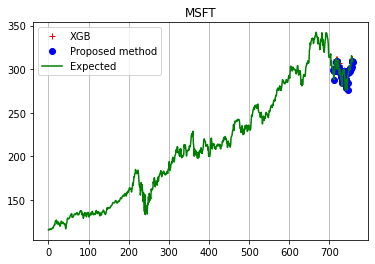

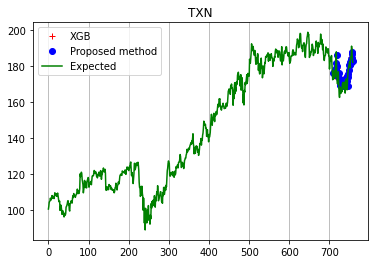

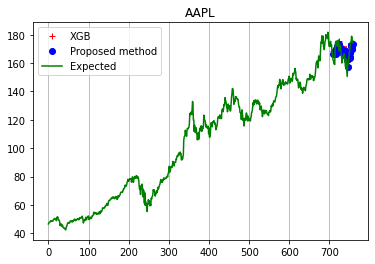

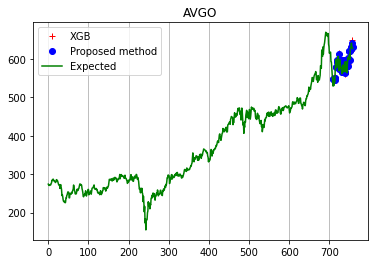

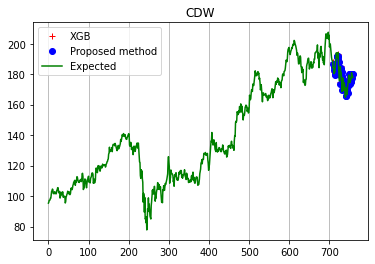

...

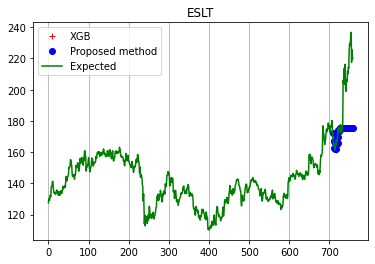

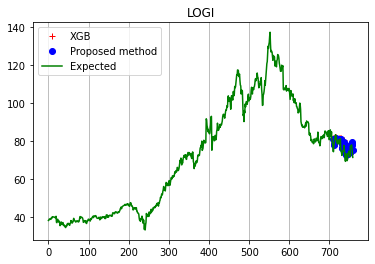

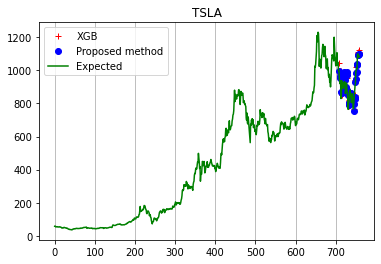

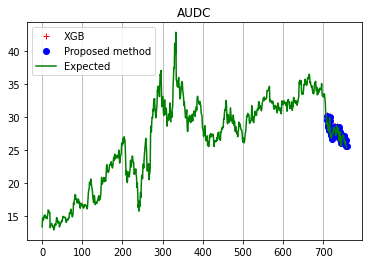

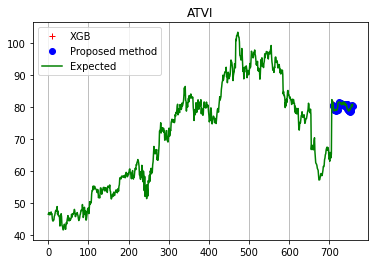

In [ ]:
draw_stocks(preds_, s_preds, stock_finance, stocks_finance_edited.index)

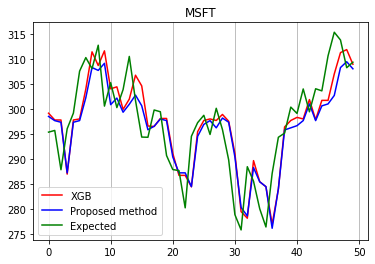

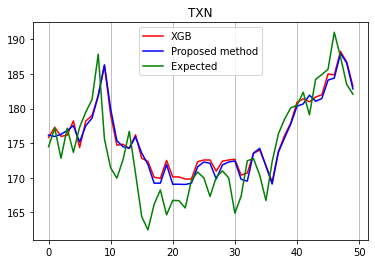

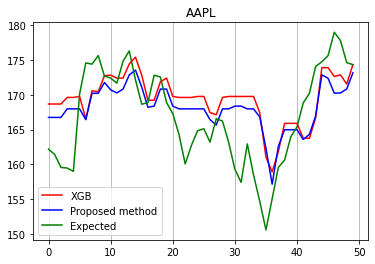

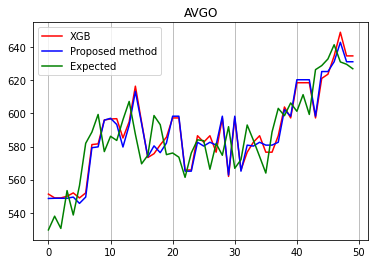

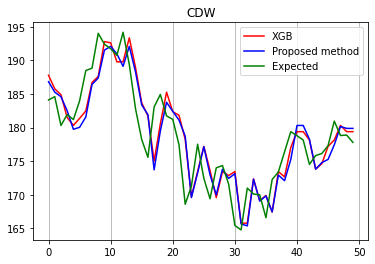

...

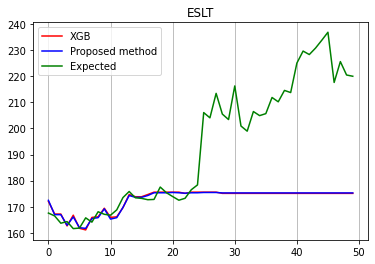

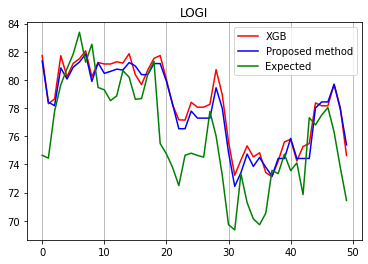

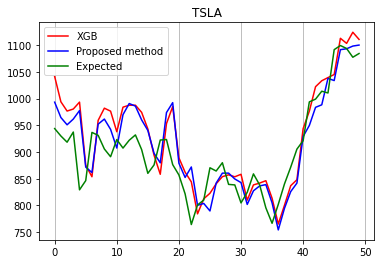

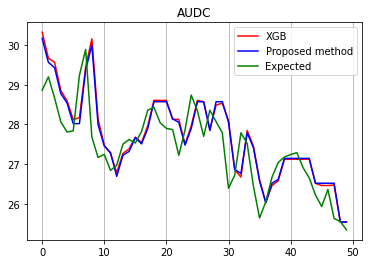

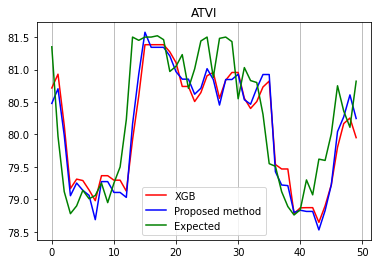

In [ ]:
draw_stocks_closer(preds_, s_preds, stock_finance, stocks_finance_edited.index)

## data consistent draw

In [ ]:
def draw_stock_similar(preds_, spred_, data=None, symbol=None):

  for id, item in enumerate( symbol):
    x1 = preds_[id].reshape(50, ); x2 = spred_[id].reshape(50,)
    y = data[item]
    y = y[-50:]
    xis = np.arange(0, len(y), 1)

    plt.plot(xis, x2, 'r-',label='XGB')
    plt.plot(xis, x1, 'b-', label='Proposed method')
    plt.plot(xis, y, 'g-',label='Expected')
    plt.grid(axis = 'x')
    plt.legend()
    plt.title(item)
    plt.show()

In [ ]:
alpha1 = pd.read_csv('/content/stocks_alphafinance.csv')
yahoo = pd.read_csv('/content/stocks_yahoofinance.csv')
alpha1.drop(columns=['Unnamed: 0'], inplace=True)
alpha = alpha1.reindex(index=alpha1.index[::-1])
alpha = alpha.reset_index(drop=True)
# alpha.head()

In [ ]:
AAPL = pd.read_csv('/content/AAPL Historical Data.csv')
MSFT = pd.read_csv('/content/MSFT Historical Data.csv')
NVDA = pd.read_csv('/content/NVDA Historical Data.csv')
TSLA = pd.read_csv('/content/TSLA Historical Data.csv')

In [ ]:
print(alpha['AAPL'])
print(AAPL['Price'])

0      191.24
1      194.02
2      195.35
3      195.69
4      197.00
        ...  
754    175.60
755    178.96
756    177.77
757    174.61
758    174.31
Name: AAPL, Length: 759, dtype: float64
0      174.31
1      174.61
2      177.77
3      178.96
4      175.60
        ...  
754     49.25
755     48.92
756     48.84
757     48.51
758     47.81
Name: Price, Length: 759, dtype: float64


# test ARIMA

In [ ]:
from numpy import asarray
from pandas import DataFrame
from pandas import concat
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import numpy as np
import pandas as pd


In [ ]:
# https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/
# AR example
from statsmodels.tsa.ar_model import AutoReg
from random import random
from statsmodels.tsa.arima.model import ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX
# VAR example
from statsmodels.tsa.vector_ar.var_model import VAR
# VARMA example
from statsmodels.tsa.statespace.varmax import VARMAX
# SES example
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

In [ ]:
def load_data_yahoo():
    stock_alphafinance = pd.read_csv('/content/stocks_yahoofinance.csv')
    stock_alphafinance = stock_alphafinance.set_index('Date')

    stocks_alphafinance_edited = pd.read_csv('/content/stocks_yahoofinance_edited.csv')
    print(stocks_alphafinance_edited.index)
    print(stocks_alphafinance_edited.shape)
    return stock_alphafinance, stocks_alphafinance_edited

In [ ]:
# Step 2 :
def predict_time_mixed(Symbols_, stocks_finance, storcks_edits):
    ptr = 0
    MAEall = [0] * storcks_edits.shape[0]
    preds = {}
    trueYs = {}

    for item in Symbols_:
        # print(item)
        # Step 2.0 :  fix random seed for reproducibility
        np.random.seed(7)
        # print('here is predict company ', item)
        # Step 2.1 : load data (adjusted closed prices) & normalize
        data = stocks_finance[item].values
        scaledata = MinMaxScaler(feature_range=(0, 1))
        data = data.astype('float32')
        # print('star', data)
        data = data.reshape(-1, 1)
        resdata = scaledata.fit_transform(data)

        # model = ARIMA(resdata[:-50], order=(2, 2, 1))
        # model = AutoReg(resdata[:-50], lags=7)
        model = SimpleExpSmoothing(resdata[:-50])
        model_fit = model.fit()

        # model = SARIMAX(data, order=(0, 1, 1), seasonal_order=(0, 0, 0, 0))
        # model_fit = model.fit(disp=False)

        predss = model_fit.predict((len(data)-49), len(data))

        predictions = np.array(predss)

        predictions = predictions.reshape(-1, 1)
        predictions = scaledata.inverse_transform(predictions)
        # print('sestar', data)
        mae = mean_absolute_error(predictions, data[-50:])


        # print('MAE: %.3f' % mae)
        preds[item] = predictions
        trueYs[item] = data[-50:]
        MAEall[ptr] = mae
        ptr += 1
    return MAEall, preds, trueYs


In [ ]:
if __name__ == '__main__':
    import time
    start = time.time()
    print("The time used to execute this is given below")
    stock_alphafinance, stocks_alphafinance_edited = load_data_yahoo()

    MAEall, preds, trueYs = predict_time_mixed(
        stocks_alphafinance_edited['Ticker'], stock_alphafinance, stocks_alphafinance_edited)  #
    print(MAEall)
    import pickle
    file = open(b"aoreg.pkl",'wb')
    pickle.dump( MAEall, file)

The time used to execute this is given below
RangeIndex(start=0, stop=18, step=1)
(18, 11)
[8.209189124676941, 5.86369466432277, 6.161770240255932, 41.61232124975401, 10.618320590818202, 53.191085998467, 15.320384325768213, 1.9220303165529662, 27.52894147835463, 8.52010129761897, 26.133448750541874, 3.074168606742041, 0.7024882627046418, 24.851607966323776, 3.5228675321845797, 113.20090741822489, 2.5915929395054054, 1.5345807365316226]


/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handl

In [ ]:

auto=  [9.164112169921792, 5.863894230685051, 5.964067200336579, 38.47607396607287, 10.200090801584595, 58.19649670585639, 14.891275179043129, 1.9224114691003211, 27.701167614511878, 8.223425254876501, 24.58354157060262, 2.873013216137132, 0.7680901258797855, 30.510337601678607, 4.145297929678828, 128.32895917366437, 2.3546304620562384, 1.1965025983575248]
a112 = [8.11999702599185, 5.831312628329249, 6.17928754648108, 46.40499446022961, 10.553903041727017, 53.567318597426926, 15.313351075614168, 1.922910829082773, 26.597216554782843, 8.377075990051884, 26.076461041956644, 3.0791864315174475, 0.5606182157019222, 24.740094858562216, 3.6622466784526466, 112.74607210469581, 2.5029499112929674, 1.389417989614421]
log = [8.209189124676941, 5.86369466432277, 6.161770240255932, 41.61232124975401, 10.618320590818202, 53.191085998467, 15.320384325768213, 1.9220303165529662, 27.52894147835463, 8.52010129761897, 26.133448750541874, 3.074168606742041, 0.7024882627046418, 24.851607966323776, 3.5228675321845797, 113.20090741822489, 2.5915929395054054, 1.5345807365316226]


# draw the figures with all compared algorithms

get other methods results

In [ ]:
from numpy import asarray
from pandas import DataFrame
from pandas import concat
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import numpy as np
import pandas as pd
# https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/
# AR example
from statsmodels.tsa.ar_model import AutoReg
from random import random
from statsmodels.tsa.arima.model import ARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX
# VAR example
from statsmodels.tsa.vector_ar.var_model import VAR
# VARMA example
from statsmodels.tsa.statespace.varmax import VARMAX

In [ ]:
def load_data_yahoo():
    stock_alphafinance = pd.read_csv('/content/stocks_yahoofinance.csv')
    stock_alphafinance = stock_alphafinance.set_index('Date')

    stocks_alphafinance_edited = pd.read_csv('/content/stocks_yahoofinance_edited.csv')
    print(stocks_alphafinance_edited.index)
    print(stocks_alphafinance_edited.shape)
    return stock_alphafinance, stocks_alphafinance_edited

In [ ]:
# Step 2 :
def predict_time_mixed(Symbols_, stocks_finance, storcks_edits):
    ptr = 0
    MAEall = [0] * storcks_edits.shape[0]
    preds = {}
    trueYs = {}

    for item in Symbols_:
        # print(item)
        # Step 2.0 :  fix random seed for reproducibility
        np.random.seed(7)
        # print('here is predict company ', item)
        # Step 2.1 : load data (adjusted closed prices) & normalize
        data = stocks_finance[item].values
        scaledata = MinMaxScaler(feature_range=(0, 1))
        data = data.astype('float32')
        print('star', data)
        data = data.reshape(-1, 1)

        resdata = scaledata.fit_transform(data)
        print('resdata', resdata)
        # model = AutoReg(resdata, lags=7)
        model = ARIMA( resdata, order=(1,1,2))
        model_fit = model.fit()
        # model = SARIMAX(data, order=(1, 1, 1), seasonal_order=(0, 0, 0, 0))
        # model_fit = model.fit(disp=False)

        predss = model_fit.predict((len(data)-49), len(data))

        predictions = np.array(predss)

        predictions = predictions.reshape(-1, 1)
        predictions = scaledata.inverse_transform(predictions)
        print('sestar', data)
        mae = mean_absolute_error(predictions, data[-50:])


        # print('MAE: %.3f' % mae)
        preds[item] = predictions
        trueYs[item] = data[-50:]
        MAEall[ptr] = mae
        ptr += 1
        # break
    return MAEall, preds, trueYs


In [ ]:
if __name__ == '__main__':
    import time
    start = time.time()
    print("The time used to execute this is given below")
    stock_alphafinance, stocks_alphafinance_edited = load_data_yahoo()

    MAEall, preds, trueYs = predict_time_mixed(
        stocks_alphafinance_edited['Ticker'], stock_alphafinance, stocks_alphafinance_edited)  #
    print(MAEall)
    import pickle
    file = open(b"ARIMA.pkl",'wb')
    pickle.dump( preds, file)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/exp/dtwfinance

In [ ]:

from main import *
# from calculor import *
# from dtw_base import *
# from dtw_nofuture import *

import pickle
import numpy as np
import pandas as pd
import os

from dtw_nofuture import dtw_measure
from calculor import load_data_yahoo

dataname = [ '_sl_org__100.pkl',
'_sl_plus_01__100.pkl']


def get_preds():
    stock_yahoofinance, stocks_yahoofinance_edited = load_data_yahoo()
    com_num = len(stocks_yahoofinance_edited.index)
    Dase = [5, 42, 15, 15, 15, 42, 42,  42, 42, 42, 42,  42, 5, 5, 42,  42, 42, 42]

    preds =[]
    preds_s =[]
    for col, item in enumerate(stocks_yahoofinance_edited.index):
        dId = Dase[col]
        weekly_xgb, monthly_xgb, MAEall_xgb, preds_xgb, trueYs_xgb = read_data(base=str(dId), file=dataname[1])
        a, b, c, preds_xgbs, d = read_data(base=str(dId), file=dataname[0])
        preds.append(preds_xgb[item])
        preds_s.append(preds_xgbs[item])

    return preds,preds_s, stock_yahoofinance, stocks_yahoofinance_edited

def read_data(base='finance_D27', file='org1.pkl'):
    if file == 'orglstm.pkl' or file== 'orgsquare.pkl':
        txtfile = open(os.path.join('finance_D27', file), 'rb')
    else:
        txtfile = open((base+file), 'rb')
    resu = pickle.load(txtfile)
    txtfile.close()
    weekly_xgb2 = resu['weekly_xgb0']
    monthly_xgb2 = resu['monthly_xgb0']
    MAEall_xgb2 = resu['MAEall_xgb0']
    preds_xgb2 = resu['preds_xgb0']
    trueYs_xgb2 = resu['trueYs_xgb0']
    return weekly_xgb2, monthly_xgb2, MAEall_xgb2, preds_xgb2, trueYs_xgb2

# dynamic time warpping

In [ ]:
!pip install dtaidistance

In [ ]:
from dtaidistance import dtw
from dtaidistance import dtw_visualisation as dtwvis
import numpy as np

In [ ]:
s1 = np.array([1., 1, 2, 3, 2, 1, 2, 1, 1, 3])
s2 = np.array([0., 1, 2, 3, 2, 1, 1, 2, 1, 1])

In [ ]:
path = dtw.warping_path(s1, s2, window=3, psi=2)
dtwvis.plot_warping(s1, s2, path, filename="warp.png")

(None, None)

In [ ]:
d, paths = dtw.warping_paths(s1, s2, window=3, psi=2)
best_path = dtw.best_path(paths)
dtwvis.plot_warpingpaths(s1, s2, paths, best_path)

In [ ]:
best_path

[(0, 1),
 (1, 1),
 (2, 2),
 (3, 3),
 (4, 4),
 (5, 5),
 (5, 6),
 (6, 7),
 (7, 8),
 (8, 8)]

In [ ]:
import numpy as np

print(np.round(paths, 1))

[[ 0.   0.   0.   inf  inf  inf  inf  inf  inf  inf  inf]
 [ 0.   1.   0.   1.   inf  inf  inf  inf  inf  inf  inf]
 [ 0.   1.   0.   1.   2.2  inf  inf  inf  inf  inf  inf]
 [ inf  2.   1.   0.   1.   1.   inf  inf  inf  inf  inf]
 [ inf  inf  2.2  1.   0.   1.   2.2  inf  inf  inf  inf]
 [ inf  inf  inf  1.   1.   0.   1.   1.4  inf  inf  inf]
 [ inf  inf  inf  inf  2.2  1.   0.   0.   1.   inf  inf]
 [ inf  inf  inf  inf  inf  1.   1.   1.   0.   1.   inf]
 [ inf  inf  inf  inf  inf  inf  1.   1.   1.   0.   0. ]
 [ inf  inf  inf  inf  inf  inf  inf  1.   1.4  0.   0. ]
 [ inf  inf  inf  inf  inf  inf  inf  inf  1.4  2.  -1. ]]


# draw consistent data picture .png

In [ ]:
def draw_stock_similar(preds_, spred_, data=None, symbol=None):

  for id, item in enumerate( symbol):
    x1 = preds_[id].reshape(50, ); x2 = spred_[id].reshape(50,)
    y = data[item]
    y = y[-50:]
    xis = np.arange(0, len(y), 1)

    plt.plot(xis, x2, 'r-',label='XGB')
    plt.plot(xis, x1, 'b-', label='Proposed method')
    plt.plot(xis, y, 'g-',label='Expected')
    plt.grid(axis = 'x')
    plt.legend()
    plt.title(item)
    plt.show()

In [ ]:
def draw_stocks(x, y, z, spred_, data=None, symbol=None):

  for id, item in enumerate( symbol):
    x1 = preds_[id].reshape(50, ); x2 = spred_[id].reshape(50,)
    y = data[item]
    z1 = np.zeros_like(y)
    z2 = np.zeros_like(y)
    z1[:-50] = y[:-50]; z2[:-50] = y[:-50];

    # print(z1.shape)
    # print(x1.shape)
    z1[-50:] = x1[-50:]; z2[-50:] = x2[-50:];

    xis = np.arange(0, len(y), 1)
    # print(len(xis))
    # print(len(z1))
    # plt.plot(xis, z2, 'r+',label='XGB')
    # plt.plot(xis, z1, 'bo', label='Proposed method')
    plt.plot(xis[-50:], z2[-50:], 'r+',label='XGB')
    plt.plot(xis[-50:], z1[-50:], 'bo', label='Proposed method')
    plt.plot(xis, y, 'g-',label='Expected')
    plt.grid(axis = 'x')
    plt.legend()

In [ ]:
alpha1 = pd.read_csv('/content/stocks_alphafinance.csv')
yahoo = pd.read_csv('/content/stocks_yahoofinance.csv')
alpha1.drop(columns=['Unnamed: 0'], inplace=True)
alpha = alpha1.reindex(index=alpha1.index[::-1])
alpha = alpha.reset_index(drop=True)

In [ ]:
stickers = ['MSTF', 'AAPL', 'NVDA', 'TSLA']

In [ ]:
inv_AAPL = pd.read_csv('/content/AAPL Historical Data.csv')
inv_MSFT = pd.read_csv('/content/MSFT Historical Data.csv')
inv_NVDA = pd.read_csv('/content/NVDA Historical Data.csv')
inv_TSLA = pd.read_csv('/content/TSLA Historical Data.csv')
# need inverse their order- inv_AAPL['Price'][::-1]

### alpha/yahoo-data back-to-future;

In [ ]:
inv_AAPL['Price'][::-1]

758     47.81
757     48.51
756     48.84
755     48.92
754     49.25
        ...  
4      175.60
3      178.96
2      177.77
1      174.61
0      174.31
Name: Price, Length: 759, dtype: float64

In [ ]:
import numpy as np


In [ ]:
def draw_stocks(x, y, z, sticker):
    x= x[sticker]; y = y[sticker];
    t = len(x)
    z = z['Price'][::-1]

    xis = np.arange(len(y))
    print(len(xis))
    plt.xticks(np.arange(0, t, step=700), ['2019-4', '2022-3'])  # Set label locations.
    plt.ylabel('Closing price')  # Set label locations.
    plt.plot(xis, z, 'r',label='Alpha-vintage')
    plt.plot(xis, x, 'b', label='YahooFinance')
    plt.plot(xis, y, 'g',label='Investing')
    plt.grid(axis = 'x')
    plt.xlabel('Time stamp')
    plt.legend()
    plt.savefig((sticker+'.png'))

759


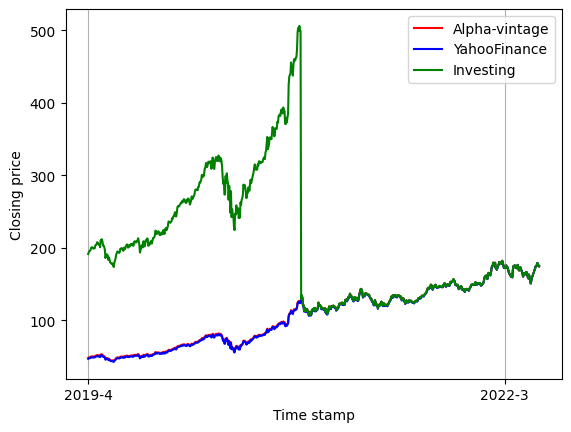

In [ ]:
draw_stocks(yahoo, alpha, inv_AAPL, 'AAPL')


759


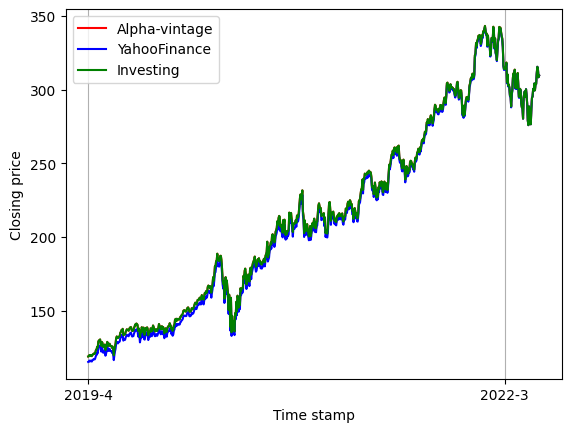

In [ ]:
draw_stocks(yahoo, alpha, inv_MSFT, 'MSFT')


759


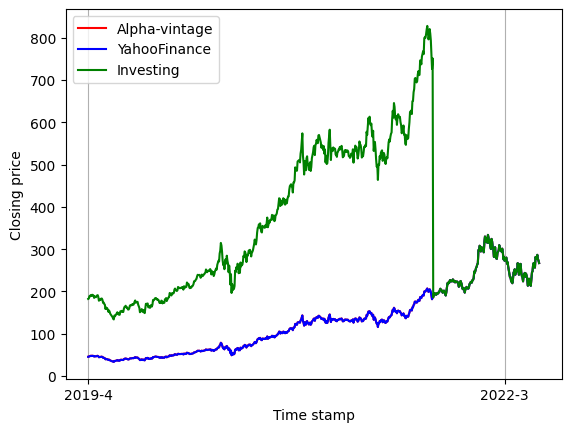

In [ ]:
draw_stocks(yahoo, alpha, inv_NVDA, 'NVDA')


759


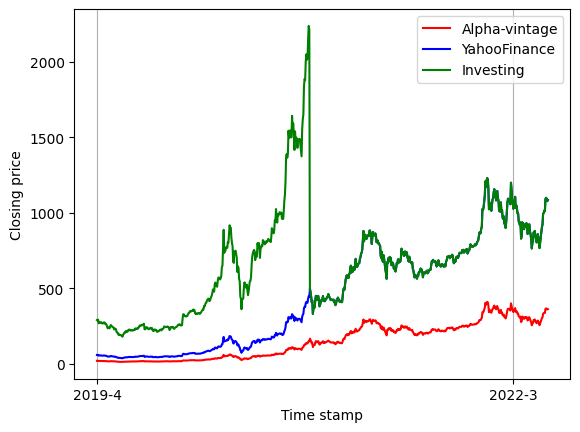

In [ ]:
draw_stocks(yahoo, alpha, inv_TSLA, 'TSLA')

In [ ]:
def draw_stocks_closer(x, y, z, sticker):
    x= x[sticker][300:500]; y = y[sticker][300:500];
    t = len(x)
    z = z['Price'][::-1]; z = z[300:500]

    xis = np.arange(len(y))
    print(len(xis))
    plt.xticks(np.arange(0, t, step=100), ['', '2020-10'])  # Set label locations.
    plt.ylabel('Closing price')  # Set label locations.
    plt.plot(xis, z, 'r',label='Alpha-vintage')
    plt.plot(xis, x, 'b', label='YahooFinance')
    plt.plot(xis, y, 'g',label='Investing')
    plt.grid(axis = 'x')
    plt.xlabel('Time stamp')
    plt.legend()

200


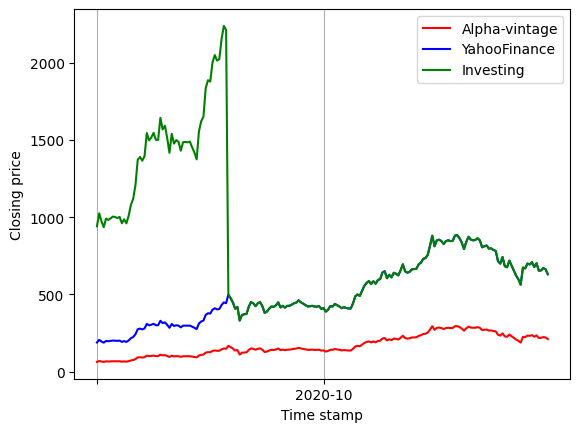

In [ ]:
draw_stocks_closer(yahoo, alpha, inv_TSLA, 'TSLA')


200


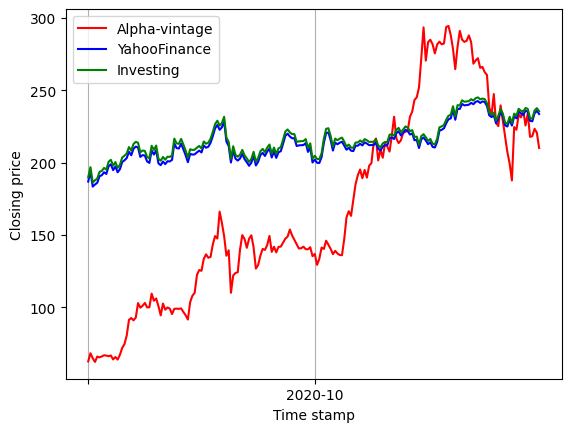

In [ ]:
draw_stocks_closer(yahoo, alpha, inv_TSLA, 'MSFT')

200


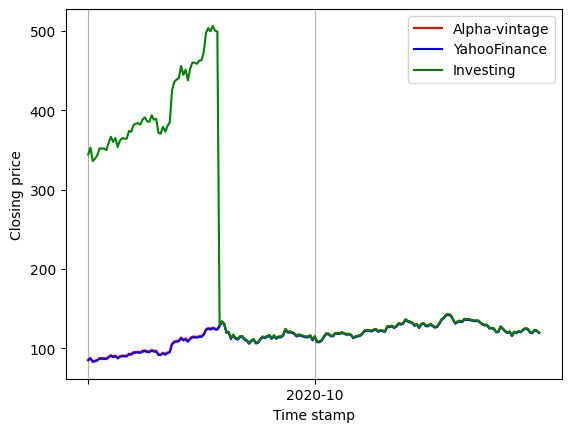

In [ ]:
draw_stocks_closer(yahoo, alpha, inv_AAPL, 'AAPL')

200


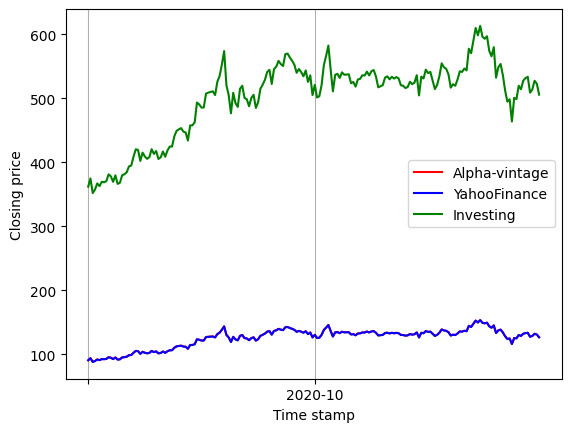

In [ ]:
draw_stocks_closer(yahoo, alpha, inv_NVDA, 'NVDA')

In [ ]:
def draw_stocks_sub(x, y, z, sticker):
    x= x[sticker]; y = y[sticker];
    t = len(x)
    z = z['Price'][::-1]

    plt.subplot(121)

    xis = np.arange(len(y))
    print(len(xis))
    plt.xticks(np.arange(0, t, step=700), ['2019-4', '2022-3'])  # Set label locations.
    plt.ylabel('Closing price')  # Set label locations.
    plt.plot(xis, z, 'r',label='Alpha-vintage')
    plt.plot(xis, x, 'b', label='YahooFinance')
    plt.plot(xis, y, 'g',label='Investing')
    plt.grid(axis = 'x')
    plt.xlabel('Time stamp')
    # plt.legend()


    plt.subplot(122)
    x= x[300:500]; y = y[300:500];
    t = len(x)
    z = z[300:500]

    xis = np.arange(len(y))
    print(len(xis))
    plt.xticks(np.arange(0, t, step=100), ['', '2020-10'])  # Set label locations.
    # plt.ylabel('Closing price')  # Set label locations.
    plt.plot(xis, z, 'r',label='Alpha-vintage')
    plt.plot(xis, x, 'b', label='YahooFinance')
    plt.plot(xis, y, 'g',label='Investing')
    plt.grid(axis = 'x')
    plt.xlabel('Time stamp')
    plt.legend()
    plt.savefig((sticker+'.png'))

759
200


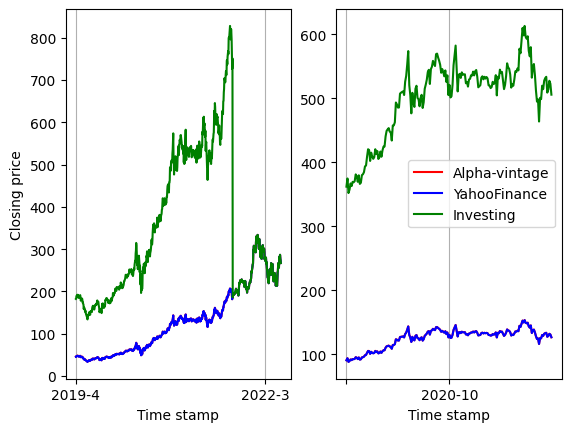

In [ ]:
draw_stocks_sub(yahoo, alpha, inv_NVDA, 'NVDA')

759
200


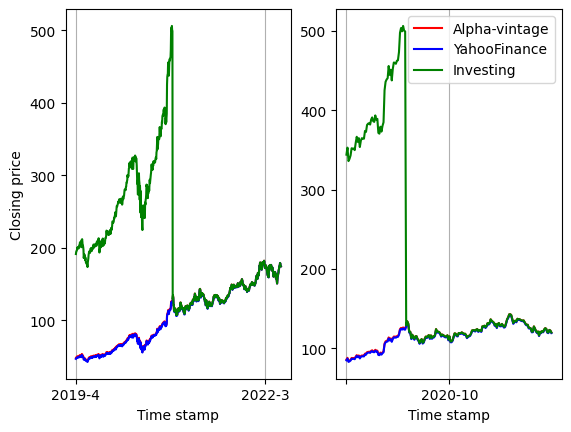

In [ ]:
draw_stocks_sub(yahoo, alpha, inv_AAPL, 'AAPL')

759
200


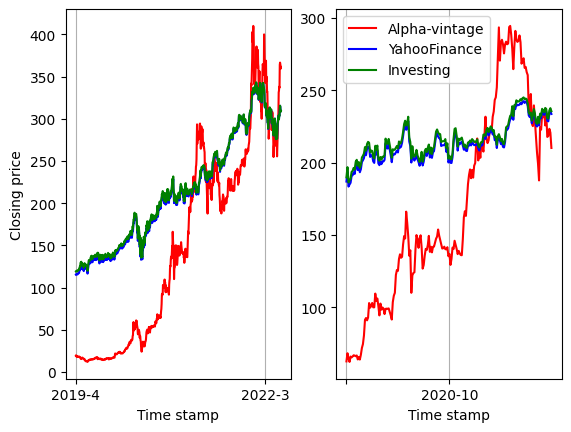

In [ ]:
draw_stocks_sub(yahoo, alpha, inv_MSFT, 'MSFT')

759
200


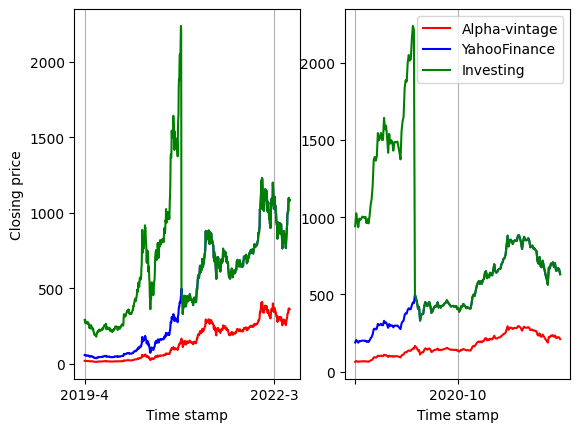

In [ ]:
draw_stocks_sub(yahoo, alpha, inv_TSLA, 'TSLA')